# CSC8637 Deep Learning: Summative Coursework

***Abdullah Turki H Alshadadi (190582184)***

***MSc Data Science (with AI)***

## TODO:

* [X] Load in the dogs dataset

* [X] Combine `dogs_train` and `dogs_valid` and preprocess it

* [X] Randomly extract the `cycleGAN_cats` (with a `seed=123` for reproducibility) to match the `dogs_final` dataset

* [X] Randomly extract the `cycleGAN_humans` (with a `seed=123` for reproducibility) to match the `dogs_cats_final` dataset

* [ ] **NOTE** FIX UPLOAD ISSUE OF `img_align_celeba` dataset !! IT'S SHOWN WAY BELOW 200_000 images

* [ ] **When modelling, DON'T FORGET TO SET THE WEIGHTS MODEL PATH !!!**

* [X] Update the path locations for saved prediction images in CycleGAN task 1

* [ ] Complete the template for `# Demo` section for each task

  * [ ] Task 1 Demo

  * [ ] Task 2 Demo

  * [ ] Task 3 Demo

* [ ] Complete the template for `checkpoints` section for each task

  * [X] Task 1 Checkpoints

  * [ ] Task 2 Checkpoints

  * [ ] Task 3 Checkpoints

* [X] In Task 3 Timeseries, convert the time object to unix time stamp

* [ ] In Task 3, models dataset

  * [ ] 3.1 For predicting logs times, use only `'data_and_time`'

  * [ ] 3.2 For predicting number of users, use `'date_and_time`', `'duration_ms`' and `'cluster'` as `train_X` and the labels are for `'number_of_users'` as `'train_y'`

  * [ ] 3.3 For predicting the names of clusters and event type status of `LOGIN` and `LOGOUT`, you will need to create a multivariate output for `'cluster'` and `'event_type'`. Therefore, `'train_X'` are `'date_and_time'`, `'duration_ms'` and labels are `'cluster'` and `'event_type'`.

* [ ] **MAYBE** Change Task 2 preprocessing image resize from `'nearest'` to `'bilinear'`

* [ ] **MAYBE** Remove shuffling in Task 2

* [ ] Finish Task 2 `# Evaluation` section

* [X] Change the Task 3, `unix timestamp` `float32` object to `np.unint64` object

* [ ] **MAYBE** Train Task 3.1, to predict the ***intervals*** of `'date_and_time'`, so that it figures out how big is the interval until for the next timestamp. e.g. in unix time small example [120, 125, 130, 140] -> predict difference could be 6 [146]

* [ ] **MAYBE** Task 3, add one-hot encoding for `'event_type'` and `'cluster'`

* [ ] To classify for Task 3.2, add a `layers.Dense(num_cluster_classes, activation='softmax')` in the end of the LSTM model

## Coursework Structure:

1. Using an Existing Model [30%]:

  * Short report - no more than half a page - on what you did to process the data and train the model and the hyper-parameters within the model you have used/changed.

  * Some examples of the results of the model - this includes images of yourself and module staff members stylised as cats/dogs using your trained model. You can select any image of yourself (optional) and you can find staff images in the intro lecture 00. If you do not wish to use an image of yourself, you can use an image of any celebrity.

  * For testing we will provide you with some images, so make sure your code will allow this.

  * Code and checkpoints (trained model weights) along with instructions on how to run your model to reproduce your submitted results.

  **Demo:**
  * We will provide you with a set of images from either domain. You should be able to load these into your chosen tool and convert them to the new domain. You can either display them directly or save to a file and open them.

2. Fine-Grained Classification [30%]:
  
  * Short report – no more than half a page – on what you did to process the data and train the model and the hyper-parameters you have used within your model. The reasons for choosing the hyper-parameters must be explained (report if you have run any experiments or searches or tell us if you just guessed what the best hyper-parameters were). Your final results (accuracy, precision, recall and confusion matrix – the confusion matrix does not need to be within the half-page limit) should be included in this report.

  * Full training and test code along with accurate instructions as to how they should be run. Your results should be reproducible. [Hint: be careful about random number generators introducing stochasticity. Seeds are your friend.]

  * Model checkpoints (trained model weights) should also be submitted to ensure reproducibility of the reported results.

  **Demo:**
  * You will be given a set of images (and labels). You need to be able to pass these through your Deep Learning model and provide accuracy, precision, recall, F1 and confusion matrix for these images along with the individual labels for each image.


3. Time-Series Model [30%]:

  * Short report - no more than half a page - on what you did to process the data and train the model and the hyper-parameters you have used within your model. You may include a few examples of the outputs of your model.

  * Full training and test code along with accurate instructions as to how they should be run. Your test code should be written in a way that allows the user to provide a sequence of events (in a CSV file) and then outputs the appropriate result.
  
  * Model checkpoints (trained model weights) should be submitted to enable the testing of the model (text generation).

  **Demo:**
  * You will be expected to demo three results. This could be three separate networks:

  * Given a CSV file of N events, remove the last 100 of these (for testing). Run your model
  on the N-100 events and predict the last 100 login / logout times. Produce an R2, MSE,
  MAE values for these last 100 predictions.

  * Given a CSV file of N events, remove the last 100 of these (for testing). Run your model
  on the N-100 events and predict the number of students using the system for the next
  100 events. Produce an R2, MSE, MAE value for these last 100 predictions.

  * Given a CSV file of N events, remove the last 100 of these (for testing). Run your model
  on the N-100 events and predict the cluster names for the next 100 events. Produce an accuracy, precision, recall and F1 score for this.

4. Reflecting on the Paper Reading Workshop [10%]:

  * Short report - no more than half a page - on what you have learned about reading academic papers and how this will affect your future as a deep learning specialist whether working in industry or academia. The report will also include a very brief summary of the papers we have read (no more than a few sentences).

## Structure of the writing **(Please Read This)**

From Task 1 to 3, the writing pieces will be structured like so:

* Writing: Data Handling

* Writing: Modellings

* Writing: Evaluation of Results

**Note:** Task 3 will have 3 "Writing: Modellings" and "Writing: Evaluation of Results"

## Setup

Mount Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Install `ipython-autotime` to see how long each block of code takes to run

In [ ]:
!pip install ipython-autotime
%load_ext autotime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 7.0 MB/s eta 0:00:00
time: 524 µs (started: 2024-03-04 05:42:33 +00:00)


Setup paths for the datasets' zipfiles and the main data directory path

In [ ]:
path = '/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/'

# Task 1 dataset
# --------------
cycleGAN_faces = 'cycleGAN_faces.zip'
cycleGAN_cats  = 'cycleGAN_cats.zip'
cycleGAN_dogs  = 'cycleGAN_dogs.zip'

# Task 2 dataset
# --------------
classification_aircraft = 'classification_aircraft.zip'

# Task 3 dataset
# --------------
UserLog_csv = 'UserLog.csv.zip'

time: 7.84 ms (started: 2024-03-04 05:42:33 +00:00)


Extract uploaded zipfiles ***(RUN ONCE IF NOT UNZIPPED)***

In [ ]:
# Task 1 dataset
# --------------
# !unzip $path$cycleGAN_faces -d $path"cycleGAN_faces" && \
#  unzip $path"cycleGAN_faces/face_align_celeba.zip" -d $path"cycleGAN_faces/face_align_celeba" && \
#  unzip $path"cycleGAN_faces/UTK Face Cropped.zip" -d $path"cycleGAN_faces/UTK Face Cropped"
# !unzip $path$cycleGAN_cats -d $path"cycleGAN_cats"
# !unzip $path$cycleGAN_dogs -d $path"cycleGAN_dogs"

# Task 2 dataset
# --------------
# !unzip $path$classification_aircraft -d $path"classification_aircraft"

# Task 3 dataset
# --------------
# !unzip $path$UserLog_csv -d $path"UserLog_csv"

time: 422 µs (started: 2024-03-04 05:42:33 +00:00)


Check if the zipfiles is unzipped

In [ ]:
!ls -al $path

total 4318379
drwx------ 2 root root       4096 Feb 19 18:33 classification_aircraft
-rw------- 1 root root 2755138214 Feb 10 15:21 classification_aircraft.zip
drwx------ 2 root root       4096 Feb 13 15:39 cycleGAN_cats
-rw------- 1 root root  100661714 Feb  9 16:41 cycleGAN_cats.zip
drwx------ 2 root root       4096 Feb 13 15:47 cycleGAN_dogs
-rw------- 1 root root   16344587 Feb  9 16:04 cycleGAN_dogs.zip
drwx------ 2 root root       4096 Feb 12 11:36 cycleGAN_faces
-rw------- 1 root root 1533457290 Feb  9 15:07 cycleGAN_faces.zip
drwx------ 2 root root       4096 Feb 12 10:11 UserLog_csv
-rw------- 1 root root   16396237 Feb 10 15:22 UserLog.csv.zip
time: 428 ms (started: 2024-03-04 05:42:33 +00:00)


Investigating the dataset paths

In [ ]:
!ls -al $path"cycleGAN_faces/"

total 1647544
drwx------ 2 root root       4096 Feb 12 11:37  face_align_celeba
-rw------- 1 root root 1443490838 Feb  6  2023  face_align_celeba.zip
drwx------ 2 root root       4096 Feb 13 16:01 'UTK Face Cropped'
-rw------- 1 root root  243584746 Feb  6  2023 'UTK Face Cropped.zip'
time: 223 ms (started: 2024-03-04 05:42:33 +00:00)


In [ ]:
!ls -al $path"cycleGAN_dogs"

total 4
drwx------ 2 root root 4096 Jan 20  2023 images.cv_93crsmi9z4e6klw0pvbzuv
time: 123 ms (started: 2024-03-04 05:42:34 +00:00)


In [ ]:
!ls -al $path"cycleGAN_dogs/images.cv_93crsmi9z4e6klw0pvbzuv/data/train"

total 4
drwx------ 2 root root 4096 Jan 20  2023 'animal animal_faces dog dog_face'
time: 535 ms (started: 2024-03-04 05:42:34 +00:00)


In [ ]:
!ls -al $path"cycleGAN_faces/face_align_celeba"

total 4
drwx------ 2 root root 4096 Feb 12 11:37 img_align_celeba
time: 117 ms (started: 2024-03-04 05:42:34 +00:00)


In [ ]:
!ls -al $path"classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data"

total 1167
-rw------- 1 root root    617 Jul 23  2020 families.txt
drwx------ 2 root root   4096 Feb 19 18:33 images
-rw------- 1 root root 231834 Jul 23  2020 images_box.txt
-rw------- 1 root root  56871 Jul 23  2020 images_family_test.txt
-rw------- 1 root root  56870 Jul 23  2020 images_family_train.txt
-rw------- 1 root root 113729 Jul 23  2020 images_family_trainval.txt
-rw------- 1 root root  56859 Jul 23  2020 images_family_val.txt
-rw------- 1 root root  62180 Jul 23  2020 images_manufacturer_test.txt
-rw------- 1 root root  62215 Jul 23  2020 images_manufacturer_train.txt
-rw------- 1 root root 124420 Jul 23  2020 images_manufacturer_trainval.txt
-rw------- 1 root root  62205 Jul 23  2020 images_manufacturer_val.txt
-rw------- 1 root root  26664 Jul 23  2020 images_test.txt
-rw------- 1 root root  26672 Jul 23  2020 images_train.txt
-rw------- 1 root root  26664 Jul 23  2020 images_val.txt
-rw------- 1 root root  54867 Jul 23  2020 images_variant_test.txt
-rw------- 1 root roo

In [ ]:
!ls -al $path"classification_aircraft/"

total 234
drwx------ 3 root root  4096 Feb 19 18:33 fgvc-aircraft-2013b
-rw------- 1 root root 77889 Jul 23  2020 test.csv
-rw------- 1 root root 77901 Jul 23  2020 train.csv
-rw------- 1 root root 77882 Jul 23  2020 val.csv
time: 123 ms (started: 2024-03-04 05:42:35 +00:00)


Remove duplicates in the dataset

In [ ]:
# !rm -r $path"cycleGAN_cats/cats/cats"
# !rm -r $path"cycleGAN_faces/UTK Face Cropped/utkcropped/utkcropped"

time: 338 µs (started: 2024-03-04 05:42:36 +00:00)


Setup the final paths to the datasets

In [ ]:
# Task 1 dataset
# --------------
cats_path = path+"cycleGAN_cats"
dogs_path = path+"cycleGAN_dogs/images.cv_93crsmi9z4e6klw0pvbzuv/data/"
humans_utk_path = path+"cycleGAN_faces/UTK Face Cropped"
humans_celebs_path = path+"cycleGAN_faces/face_align_celeba"

# Task 2 dataset
# --------------
aircraft_csv_path = path+"classification_aircraft/"
aircraft_images_path = path+"classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/"

# Task 3 dataset
# --------------
userlog_csv_path = path+"UserLog_csv/"

time: 31.1 ms (started: 2024-03-04 05:42:36 +00:00)


Setup path for checkpoints of model weights

In [ ]:
# Implement the path location for each task models
checkpoint_path = "/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/model_checkpoints/"

# Task 1
# ------
checkpoint_cyclegan = checkpoint_path+"cyclegan/cyclegan_checkpoints.{epoch:03d}"

# Task 2
# ------
checkpoint_task2 = checkpoint_path+"fine-grained_model/fine-grained_model.{epoch:03d}-{val_accuracy:.2f}"
checkpoint_task2_tuning = checkpoint_path+"fine-grained_model/"

# Task 3
# ------
checkpoint_task3_1_path = checkpoint_path+"userlog_timeseries/model_3_1/"
checkpoint_task3_2_path = checkpoint_path+"userlog_timeseries/model_3_2/"
checkpoint_task3_3_path = checkpoint_path+"userlog_timeseries/model_3_3/"

checkpoint_task3_1 = checkpoint_path+"userlog_timeseries/model_3_1/model_3_1.{epoch:03d}-{mae:.2f}"
checkpoint_task3_2 = checkpoint_path+"userlog_timeseries/model_3_2/model_3_2.{epoch:03d}-{mae:.2f}"
checkpoint_task3_3 = checkpoint_path+"userlog_timeseries/model_3_3/model_3_3.{epoch:03d}-{val_accuracy:.2f}"

time: 944 µs (started: 2024-03-04 05:42:36 +00:00)


General libraries imports

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import keras
from keras import layers
from tqdm.notebook import tqdm

time: 23.1 s (started: 2024-03-04 05:42:36 +00:00)


## 1) Using an Existing Model [30%]

Install tensorflow-addons for the layer "InstanceNormalization"

In [ ]:
!pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 3.8 MB/s eta 0:00:00
time: 8.44 s (started: 2024-03-02 13:22:01 +00:00)


In [ ]:
import tensorflow_addons as tfa

time: 136 ms (started: 2024-03-02 13:22:10 +00:00)


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


### Experimentation (SKIP FOR MARKING)

In [ ]:
# import tensorflow as tf
# from keras.preprocessing.image import load_img, img_to_array
# import os

# # Get the list of files in the directory
# cats_imgs_list = os.listdir(cats_path+"/cats/")

# image_paths = []
# for imgs in tqdm(cats_imgs_list):
#   image_paths.append(cats_path+"/cats/"+imgs)
# # Count the number of files
# num_cats_imgs = len(cats_imgs_list)
# print(num_cats_imgs)

# # Define a list of file paths to your images
# # image_paths = cats_imgs_list

# print(image_paths)

# # Define a function to load and preprocess an image
# def load_and_preprocess_image(image_path):
#     # Load the image using TensorFlow
#     # image_path = '/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/cycleGAN_cats/cats/9313.jpg'
#     # If the image_path is a symbolic tensor, get its numpy value
#     print(image_path)
#     image_path = image_path.numpy()
#     img = load_img(image_path, target_size=(224, 224))  # Adjust target_size as needed
#     img_array = img_to_array(img)
#     return img_array

# # Create a tf.data.Dataset from the list of file paths
# image_dataset = tf.data.Dataset.from_tensor_slices(image_paths)

# # Use tf.py_function to apply the load_and_preprocess_image function
# def load_and_preprocess_image_wrapper(image_path):
#     return tf.py_function(load_and_preprocess_image, [image_path], tf.float32)


# # Map the load_and_preprocess_image function to the dataset
# image_dataset = image_dataset.map(load_and_preprocess_image_wrapper, num_parallel_calls=tf.data.AUTOTUNE)

# # (Optional) Shuffle and batch the dataset
# image_dataset = image_dataset.shuffle(buffer_size=len(image_paths)).batch(batch_size=1)

# # (Optional) Prefetch the dataset for better performance
# # image_dataset = image_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

time: 302 µs (started: 2024-02-24 10:12:51 +00:00)


In [ ]:
# image_dataset

time: 272 µs (started: 2024-02-24 10:12:51 +00:00)


In [ ]:
# for img in image_dataset.take(1):
#   print(img)

time: 304 µs (started: 2024-02-24 10:12:51 +00:00)


### Data Preparation

In [ ]:
# Define the standard image size.
# orig_img_size = (286, 286)
orig_img_size = (64, 64)
# Size of the random crops to be used during training.
# input_img_size = (256, 256, 3)
input_img_size = (64, 64, 3)
# # Weights initializer for the layers.
# kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# # Gamma initializer for instance normalization.
# gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

buffer_size = 256
batch_size = 1
SEED = 123  # For reproducibility


# def normalize_img(img):
#     img = tf.cast(img, dtype=tf.float32)
#     # Map values in the range [-1, 1]
#     return (img / 127.5) - 1.0


# def preprocess_train_image(img):
#     # Random flip
#     img = tf.image.random_flip_left_right(img)
#     # Resize to the original size first
#     img = tf.image.resize(img, [*orig_img_size],
#                           method='nearest', antialias=True)
#     # Random crop to 256X256
#     img = tf.image.random_crop(img, size=[*input_img_size], seed=SEED)
#     # Normalize the pixel values in the range [-1, 1]
#     img = normalize_img(img)
#     return img


# def preprocess_test_image(img):
#     # Only resizing and normalization for the test images.
#     img = tf.image.resize(img, [input_img_size[0], input_img_size[1]])
#     img = normalize_img(img)
#     return img

time: 845 µs (started: 2024-03-02 15:50:14 +00:00)


Loading the datasets

In [ ]:
dogs_train = keras.utils.image_dataset_from_directory(
    dogs_path+"train/",
    labels=None,
    # batch_size=batch_size,
    batch_size=None,
    image_size=(orig_img_size),
    shuffle=False,
    interpolation='nearest'  # To avoid too much blurring
)

dogs_valid = keras.utils.image_dataset_from_directory(
    dogs_path+"val/",
    labels=None,
    # batch_size=batch_size,
    batch_size=None,
    image_size=(orig_img_size),
    shuffle=False,
    interpolation='nearest'  # To avoid too much blurring
)

dogs_test = keras.utils.image_dataset_from_directory(
    dogs_path+"test/",
    labels=None,
    # batch_size=batch_size,
    batch_size=None,
    image_size=(orig_img_size),
    shuffle=False,
    interpolation='nearest'  # To avoid too much blurring
)

Found 3020 files belonging to 1 classes.
Found 512 files belonging to 1 classes.
Found 1510 files belonging to 1 classes.
time: 23.2 s (started: 2024-02-24 10:12:51 +00:00)


Subset `dogs_test` to have a small data for visual testing on unforeseen data

In [ ]:
# Define the total size of the dataset
dogs_test_size = dogs_test.cardinality().numpy()

# Define the number of images for testing
test_size = 5

# Split the dataset into training and testing
dogs_test_ = dogs_test.skip(test_size)  # For combining with training
dogs_test_vis = dogs_test.take(test_size) # Unforeseen dataset

time: 10.5 ms (started: 2024-02-24 10:13:14 +00:00)


In [ ]:
dogs_test_.cardinality().numpy()

1505

time: 2.52 ms (started: 2024-02-24 10:13:14 +00:00)


In [ ]:
dogs_test_vis.cardinality().numpy()

5

time: 2.49 ms (started: 2024-02-24 10:13:14 +00:00)


Combine `dogs_train`, `dogs_valid` and `dogs_test` into one dataset

In [ ]:
dogs_train_ = dogs_train.concatenate(dogs_valid)
dogs_final  = dogs_train_.concatenate(dogs_test_)

time: 6.25 ms (started: 2024-02-24 10:13:14 +00:00)


In [ ]:
dogs_final.cardinality().numpy()

5037

time: 2.37 ms (started: 2024-02-24 10:13:14 +00:00)


In [ ]:
# Remove unnecessary data from memory
# del(dogs_valid, dogs_test, dogs_train, dogs_train_)

time: 207 µs (started: 2024-02-24 10:13:14 +00:00)


In [ ]:
import os
# Get the list of files in the directory
cats_imgs_list = os.listdir(cats_path+"/cats/")

# Count the number of files
num_cats_imgs = len(cats_imgs_list)
print(num_cats_imgs)

15747
time: 1min 35s (started: 2024-02-24 10:13:14 +00:00)


Match the size of smallest dataset (that is `cycleGAN_dogs`)

In [ ]:
# Match cats to the size of `dogs_final` dataset
match_num_dogs_final = (dogs_final.cardinality().numpy()) / num_cats_imgs
print(match_num_dogs_final)

# Match cats to the visual test `dogs_test_vis` dataset
match_num_dogs_test_vis = (dogs_test_vis.cardinality().numpy()) / num_cats_imgs
print(match_num_dogs_test_vis)

0.3198704515145742
0.0003175207976122436
time: 2.74 ms (started: 2024-02-24 10:14:50 +00:00)


In [ ]:
cats_final = keras.utils.image_dataset_from_directory(
    cats_path,
    labels=None,
    # batch_size=batch_size,
    batch_size=None,
    image_size=(orig_img_size),
    validation_split=match_num_dogs_final,
    subset="validation",     # To get the right split, ignore that it says validation
    shuffle=True,
    seed=SEED,                # Seed for reproducibility
    interpolation='nearest'  # To avoid too much blurring
)

cats_test_vis = keras.utils.image_dataset_from_directory(
    cats_path,
    labels=None,
    batch_size=None,
    # batch_size=batch_size,
    image_size=(orig_img_size),
    validation_split=match_num_dogs_test_vis,
    subset="validation",     # To get the right split, ignore that it says validation
    shuffle=True,
    seed=SEED,                # Seed for reproducibility
    interpolation='nearest'  # To avoid too much blurring
)

Found 15747 files belonging to 1 classes.
Using 5037 files for validation.
Found 15747 files belonging to 1 classes.
Using 5 files for validation.
time: 18 s (started: 2024-02-24 10:14:50 +00:00)


Check if the datasets are loaded probably as a `tf.data.Dataset`

In [ ]:
cats_final

<_PrefetchDataset element_spec=TensorSpec(shape=(64, 64, 3), dtype=tf.uint8, name=None)>

time: 2.4 ms (started: 2024-02-24 10:15:08 +00:00)


In [ ]:
cats_test_vis

<_PrefetchDataset element_spec=TensorSpec(shape=(64, 64, 3), dtype=tf.uint8, name=None)>

time: 2.16 ms (started: 2024-02-24 10:15:08 +00:00)


In [ ]:
dogs_final

<_ConcatenateDataset element_spec=TensorSpec(shape=(64, 64, 3), dtype=tf.uint8, name=None)>

time: 2.21 ms (started: 2024-02-24 10:15:08 +00:00)


In [ ]:
dogs_test_vis

<_TakeDataset element_spec=TensorSpec(shape=(64, 64, 3), dtype=tf.uint8, name=None)>

time: 2.1 ms (started: 2024-02-24 10:15:08 +00:00)


Check the size of the dataset

In [ ]:
cats_final.cardinality().numpy()

5037

time: 3.67 ms (started: 2024-02-24 10:15:08 +00:00)


In [ ]:
cats_test_vis.cardinality().numpy()

5

time: 2.83 ms (started: 2024-02-24 10:15:08 +00:00)


In [ ]:
dogs_final.cardinality().numpy()

5037

time: 2.44 ms (started: 2024-02-24 10:15:08 +00:00)


In [ ]:
dogs_test_vis.cardinality().numpy()

5

time: 2.32 ms (started: 2024-02-24 10:15:08 +00:00)


Combine `dogs_final` and `cats_final`

In [ ]:
dogs_cats_final = dogs_final.concatenate(cats_final)

time: 2.24 ms (started: 2024-02-24 10:15:08 +00:00)


In [ ]:
dogs_cats_final.cardinality().numpy()

10074

time: 2.28 ms (started: 2024-02-24 10:15:08 +00:00)


In [ ]:
# Remove unnecessary data from memory
# del(dogs_final, cats_final)

time: 274 µs (started: 2024-02-24 10:15:08 +00:00)


Combine the `dogs_test_vis` and `cats_test_vis`

In [ ]:
dogs_cats_test_vis = dogs_test_vis.concatenate(cats_test_vis)

time: 2.32 ms (started: 2024-02-24 10:15:08 +00:00)


In [ ]:
dogs_cats_test_vis.cardinality().numpy()

10

time: 2.24 ms (started: 2024-02-24 10:15:08 +00:00)


In [ ]:
# Remove unnecessary data from memory
# del(dogs_test_vis, cats_test_vis)

time: 235 µs (started: 2024-02-24 10:15:08 +00:00)


Load in the human faces matching the `dogs_cats_final` size and `dogs_cats_test_vis` for visually testing the model

Loading first half from the `humans_utk_final` dataset

In [ ]:
# Get the list of files in the directory
humans_utk_imgs_list = os.listdir(humans_utk_path+"/utkcropped/")

# Count the number of files
num_humans_utk_imgs = len(humans_utk_imgs_list)
print(num_humans_utk_imgs)

23709
time: 25.8 s (started: 2024-02-24 10:17:16 +00:00)


In [ ]:
# Match humans faces to the size of `dogs_cats_final` dataset
match_num_dogs_cats_final = (dogs_cats_final.cardinality().numpy()) / num_humans_utk_imgs
print(match_num_dogs_cats_final)

# Match humans faces to the visual test `dogs_cats_test_vis` dataset
match_num_dogs_cats_test_vis = (dogs_cats_test_vis.cardinality().numpy()) / num_humans_utk_imgs
print(match_num_dogs_cats_test_vis)

0.42490193597368087
0.00042178075836180355
time: 3.4 ms (started: 2024-02-24 10:17:42 +00:00)


In [ ]:
humans_utk_final = keras.utils.image_dataset_from_directory(
    humans_utk_path,
    labels=None,
    # batch_size=batch_size,
    batch_size=None,
    image_size=(orig_img_size),
    validation_split=match_num_dogs_cats_final / 2, # Only take half
    subset="validation",     # To get the right split, ignore that it says validation
    shuffle=True,
    seed=SEED,                # Seed for reproducibility
    interpolation='nearest'  # To avoid too much blurring
)

humans_utk_test_vis = keras.utils.image_dataset_from_directory(
    humans_utk_path,
    labels=None,
    # batch_size=batch_size,
    batch_size=None,
    image_size=(orig_img_size),
    validation_split=match_num_dogs_cats_test_vis / 2, # Only take half
    subset="validation",     # To get the right split, ignore that it says validation
    shuffle=True,
    seed=SEED,                # Seed for reproducibility
    interpolation='nearest'  # To avoid too much blurring
)

Found 23709 files belonging to 1 classes.
Using 5037 files for validation.
Found 23709 files belonging to 1 classes.
Using 5 files for validation.
time: 1min 2s (started: 2024-02-24 10:17:42 +00:00)


In [ ]:
# Get the list of files in the directory
humans_celebs_imgs_list = os.listdir(humans_celebs_path+"/img_align_celeba/")

# Count the number of files
num_humans_celebs_imgs = len(humans_celebs_imgs_list)
print(num_humans_celebs_imgs)

37323
time: 4.61 s (started: 2024-02-24 10:18:44 +00:00)


In [ ]:
# Match humans faces to the size of `dogs_cats_final` dataset
match_num_dogs_cats_final = (dogs_cats_final.cardinality().numpy()) / num_humans_celebs_imgs
print(match_num_dogs_cats_final)

# Match humans faces to the visual test `dogs_cats_test_vis` dataset
match_num_dogs_cats_test_vis = (dogs_cats_test_vis.cardinality().numpy()) / num_humans_celebs_imgs
print(match_num_dogs_cats_test_vis)

0.26991399405192507
0.00026793130241406103
time: 2.48 ms (started: 2024-02-24 10:18:49 +00:00)


In [ ]:
humans_celebs_final = keras.utils.image_dataset_from_directory(
    humans_celebs_path,
    labels=None,
    # batch_size=batch_size,
    batch_size=None,
    image_size=(orig_img_size),
    validation_split=match_num_dogs_cats_final / 2, # Only take half
    subset="validation",     # To get the right split, ignore that it says validation
    shuffle=True,
    seed=SEED,                # Seed for reproducibility
    interpolation='nearest'  # To avoid too much blurring
)

humans_celebs_test_vis = keras.utils.image_dataset_from_directory(
    humans_celebs_path,
    labels=None,
    # batch_size=batch_size,
    batch_size=None,
    image_size=(orig_img_size),
    validation_split=match_num_dogs_cats_test_vis / 2, # Only take half
    subset="validation",     # To get the right split, ignore that it says validation
    shuffle=True,
    seed=SEED,                # Seed for reproducibility
    interpolation='nearest'  # To avoid too much blurring
)

Found 37323 files belonging to 1 classes.
Using 5037 files for validation.
Found 37323 files belonging to 1 classes.
Using 5 files for validation.
time: 1min 8s (started: 2024-02-24 10:18:49 +00:00)


Combine `humans_utk_final` and `humans_celebs_final`

In [ ]:
humans_faces_final = humans_utk_final.concatenate(humans_celebs_final)

time: 1.74 ms (started: 2024-02-24 10:19:57 +00:00)


In [ ]:
humans_faces_final.cardinality().numpy()

10074

time: 2.76 ms (started: 2024-02-24 10:19:57 +00:00)


Combine the `humans_utk_test_vis` and `humans_celebs_test_vis`

In [ ]:
humans_faces_test_vis = humans_utk_test_vis.concatenate(humans_celebs_test_vis)

time: 1.6 ms (started: 2024-02-24 10:19:57 +00:00)


In [ ]:
humans_faces_test_vis.cardinality().numpy()

10

time: 2.68 ms (started: 2024-02-24 10:19:57 +00:00)


### Data Preprocessing

In [ ]:
autotune = tf.data.AUTOTUNE

def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    return (img / 127.5) - 1.0


def preprocess_train_image(img):
    # Random flip
    img = tf.image.random_flip_left_right(img)
    # Resize to the original size first
    img = tf.image.resize(img, [*orig_img_size],
                          method='nearest', antialias=True)
    # Random crop to 256X256
    img = tf.image.random_crop(img, size=[*input_img_size], seed=SEED)
    # Normalize the pixel values in the range [-1, 1]
    img = normalize_img(img)
    return img


def preprocess_test_image(img):
    # Only resizing and normalization for the test images.
    img = tf.image.resize(img, [input_img_size[0], input_img_size[1]])
    img = normalize_img(img)
    return img

time: 633 µs (started: 2024-02-24 10:19:57 +00:00)


In [ ]:
# Apply the preprocessing operations to the training data
dogs_cats_train = (
    dogs_cats_final.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size, seed=SEED)
    .batch(batch_size)
)
humans_faces_train = (
    humans_faces_final.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size, seed=SEED)
    .batch(batch_size)
)

# Apply the preprocessing operations to the test data
dogs_cats_test = (
    dogs_cats_test_vis.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size, seed=SEED)
    .batch(batch_size)
)
humans_faces_test = (
    humans_faces_test_vis.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size, seed=SEED)
    .batch(batch_size)
)


time: 215 ms (started: 2024-02-24 10:19:57 +00:00)


Visualise the the preprocessed `*_train` and `*_test`

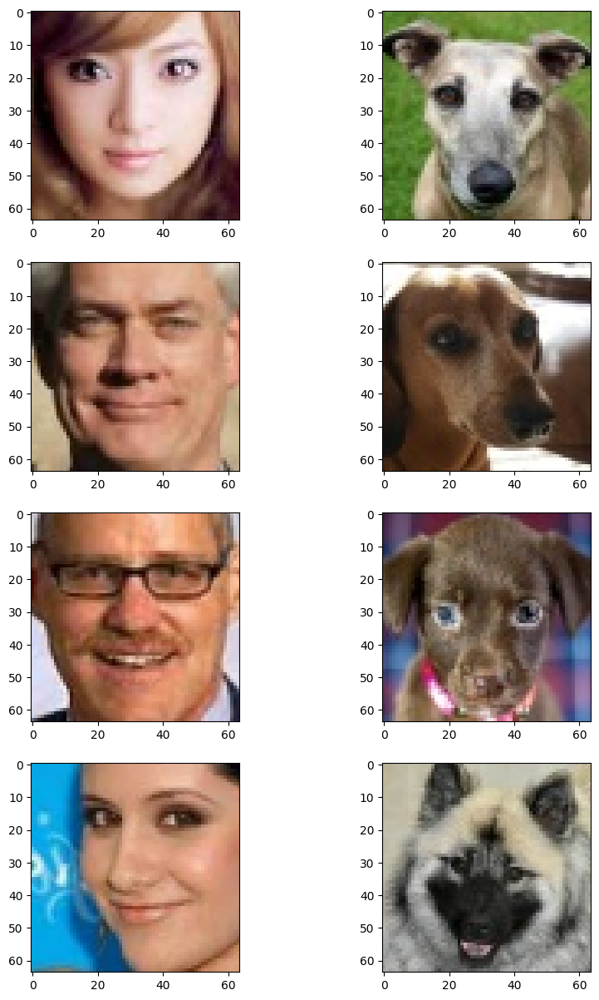

time: 2min 14s (started: 2024-02-24 09:29:48 +00:00)


In [ ]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, samples in enumerate(zip(humans_faces_train.take(4), dogs_cats_train.take(4))):
    horse = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    zebra = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(horse)
    ax[i, 1].imshow(zebra)
plt.show()

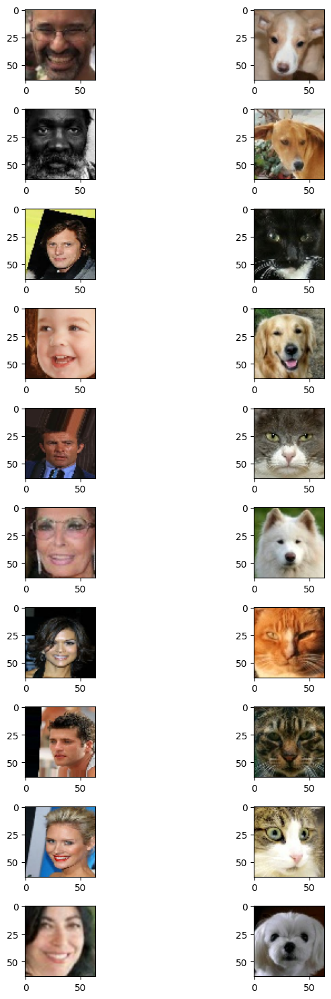

time: 9.74 s (started: 2024-02-24 09:32:03 +00:00)


In [ ]:
_, ax = plt.subplots(10, 2, figsize=(10, 15))
for i, samples in enumerate(zip(humans_faces_test.take(10), dogs_cats_test.take(10))):
    horse = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    zebra = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(horse)
    ax[i, 1].imshow(zebra)
    _.tight_layout()
plt.show()

### Modelling

Create the initialisers

In [ ]:
# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

time: 872 µs (started: 2024-03-02 15:50:24 +00:00)


Building blocks used in the CycleGAN generators and discriminators

In [ ]:
class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super().__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


time: 3.23 ms (started: 2024-03-02 15:50:25 +00:00)


Building the generators

The generator consists of downsampling blocks: nine residual blocks and upsampling blocks. The structure of the generator is the following:

```
c7s1-64 ==> Conv block with `relu` activation, filter size of 7
d128 ====|
         |-> 2 downsampling blocks
d256 ====|
R256 ====|
R256     |
R256     |
R256     |
R256     |-> 9 residual blocks
R256     |
R256     |
R256     |
R256 ====|
u128 ====|
         |-> 2 upsampling blocks
u64  ====|
c7s1-3 => Last conv block with `tanh` activation, filter size of 7.
```

In [ ]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model

time: 1.71 ms (started: 2024-03-02 15:50:26 +00:00)


Building the discriminators

The discriminators implement the following architecture: `C64->C128->C256->C512`

In [ ]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


time: 4.45 s (started: 2024-03-02 15:50:28 +00:00)


Building the CycleGAN Model

We will override the `train_step()` method of the `Model` class for training via `fit()`.

In [ ]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super().compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # x is Horse and y is zebra
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adversarial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            # Horse to fake zebra
            fake_y = self.gen_G(real_x, training=True)
            # Zebra to fake horse -> y2x
            fake_x = self.gen_F(real_y, training=True)

            # Cycle (Horse to fake zebra to fake horse): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (Zebra to fake horse to fake zebra) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adversarial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }

time: 7.79 ms (started: 2024-03-02 15:50:40 +00:00)


Create a callback that periodically saves generated images

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(humans_faces_test.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.utils.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()

time: 1.75 ms (started: 2024-03-02 15:50:41 +00:00)


Train the end-to-end model

In [ ]:
# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)


time: 21.2 ms (started: 2024-03-02 15:50:42 +00:00)


Train the CycleGAN model on the `humans_faces_train` and `dogs_cats_train` datasets

Epoch 1/10
10074/10074 [==============================] - ETA: 0s - G_loss: 4.0531 - F_loss: 3.7946 - D_X_loss: 0.1617 - D_Y_loss: 0.1725

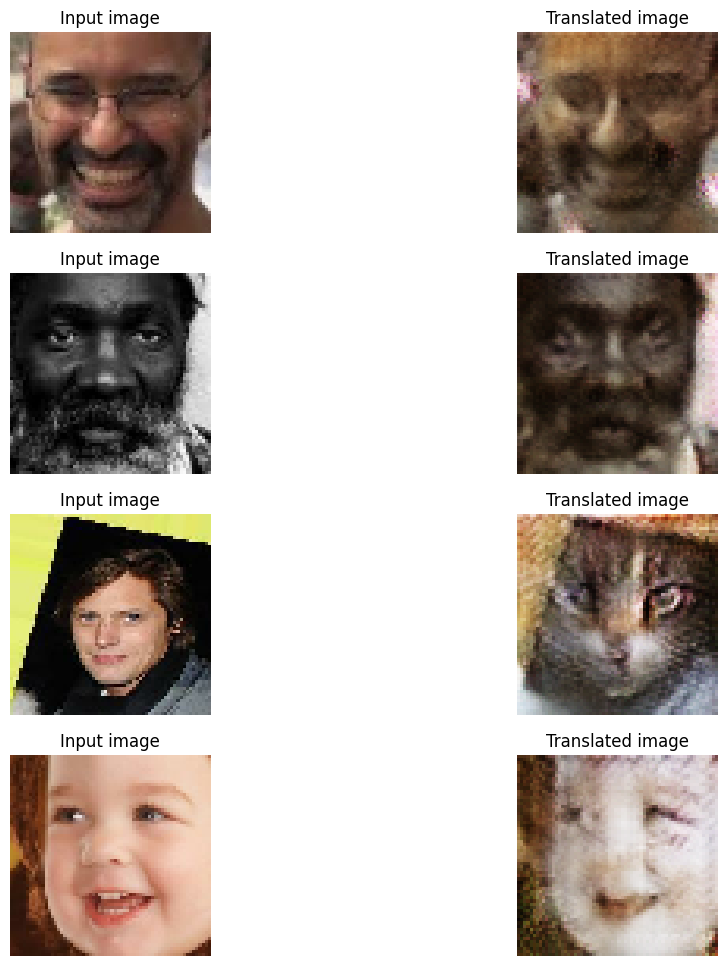

10074/10074 [==============================] - 1453s 128ms/step - G_loss: 4.0531 - F_loss: 3.7946 - D_X_loss: 0.1617 - D_Y_loss: 0.1725
Epoch 2/10
10074/10074 [==============================] - ETA: 0s - G_loss: 3.4941 - F_loss: 3.1592 - D_X_loss: 0.1788 - D_Y_loss: 0.1862

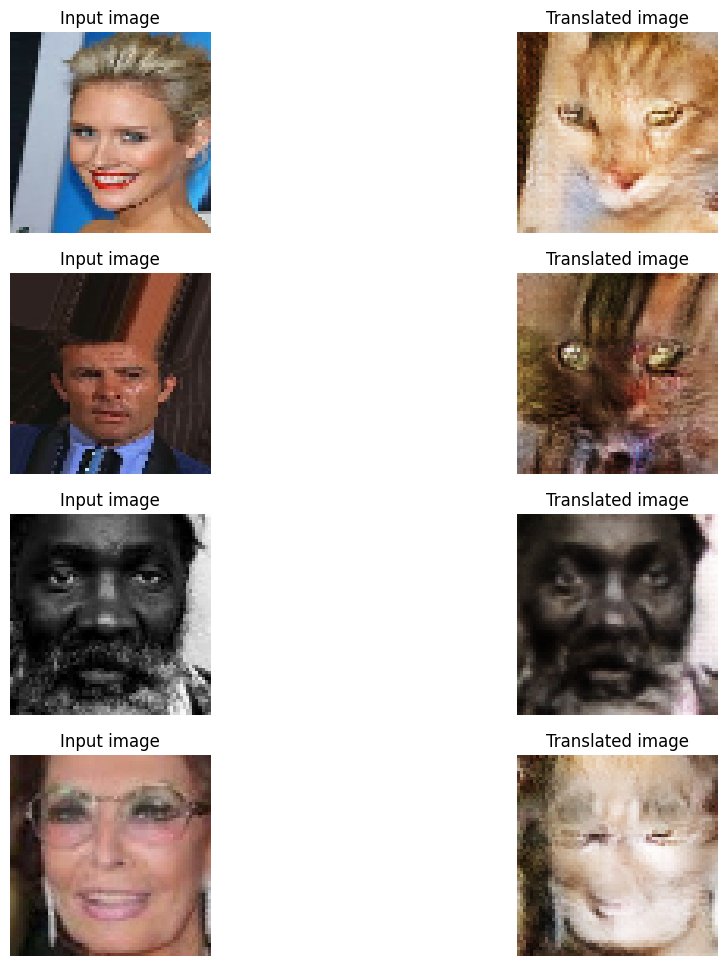

10074/10074 [==============================] - 984s 98ms/step - G_loss: 3.4941 - F_loss: 3.1593 - D_X_loss: 0.1788 - D_Y_loss: 0.1862
Epoch 3/10
10074/10074 [==============================] - ETA: 0s - G_loss: 3.3721 - F_loss: 2.9476 - D_X_loss: 0.1828 - D_Y_loss: 0.1855

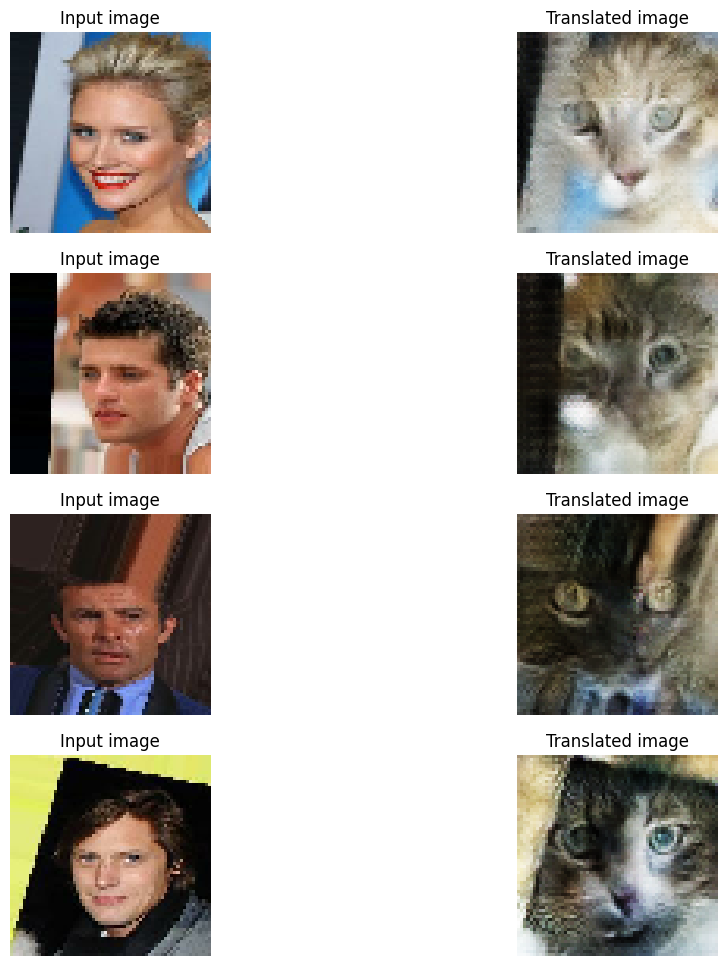

10074/10074 [==============================] - 987s 98ms/step - G_loss: 3.3722 - F_loss: 2.9476 - D_X_loss: 0.1828 - D_Y_loss: 0.1855
Epoch 4/10
10074/10074 [==============================] - ETA: 0s - G_loss: 3.3245 - F_loss: 2.8559 - D_X_loss: 0.1843 - D_Y_loss: 0.1832

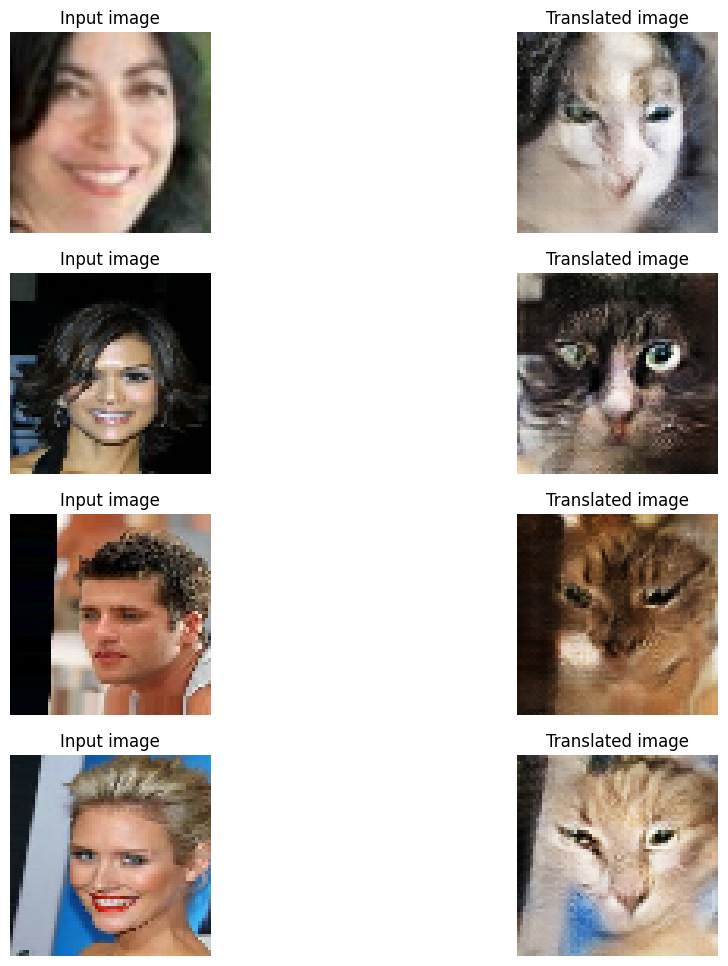

10074/10074 [==============================] - 985s 98ms/step - G_loss: 3.3245 - F_loss: 2.8559 - D_X_loss: 0.1843 - D_Y_loss: 0.1832
Epoch 5/10
10074/10074 [==============================] - ETA: 0s - G_loss: 3.2900 - F_loss: 2.8082 - D_X_loss: 0.1815 - D_Y_loss: 0.1808

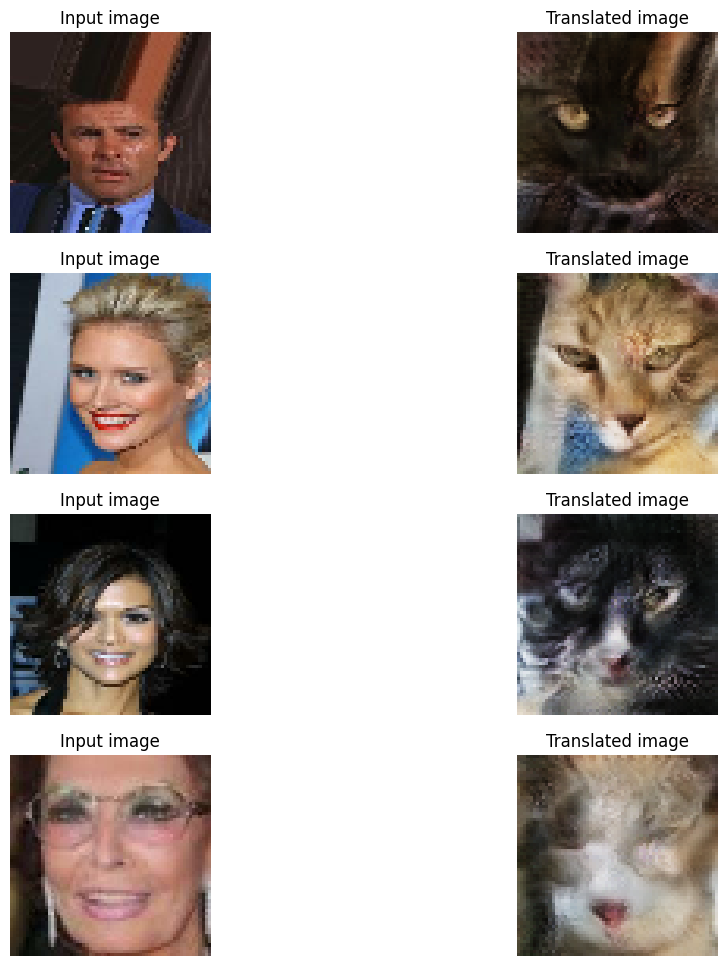

10074/10074 [==============================] - 985s 98ms/step - G_loss: 3.2900 - F_loss: 2.8082 - D_X_loss: 0.1815 - D_Y_loss: 0.1808
Epoch 6/10
10074/10074 [==============================] - ETA: 0s - G_loss: 3.2678 - F_loss: 2.7863 - D_X_loss: 0.1789 - D_Y_loss: 0.1788

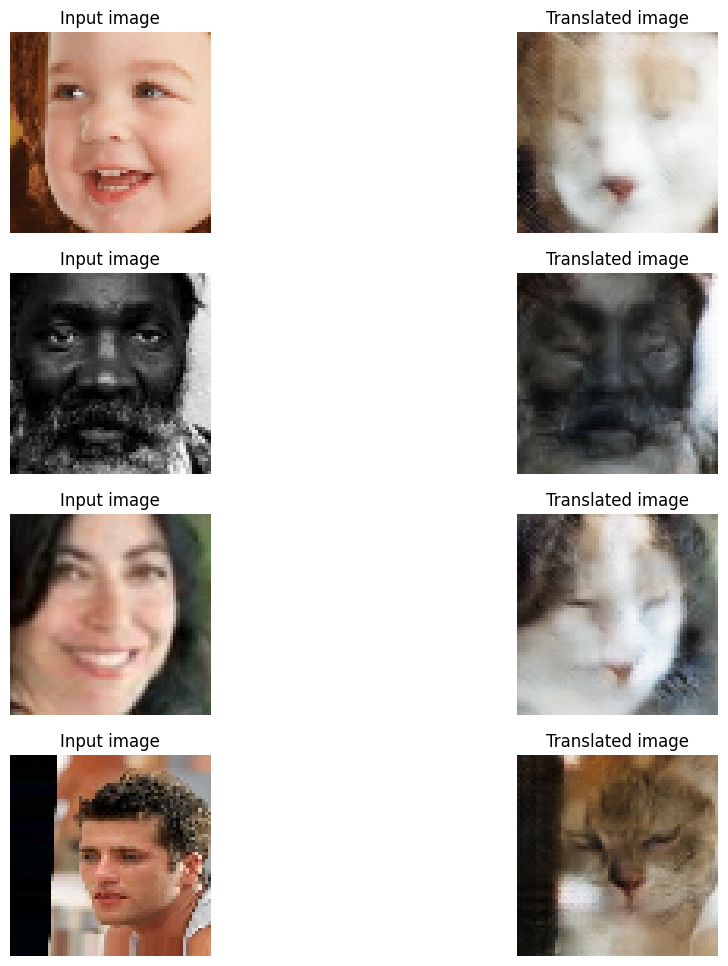

10074/10074 [==============================] - 987s 98ms/step - G_loss: 3.2678 - F_loss: 2.7863 - D_X_loss: 0.1789 - D_Y_loss: 0.1788
Epoch 7/10
10074/10074 [==============================] - ETA: 0s - G_loss: 3.2439 - F_loss: 2.8137 - D_X_loss: 0.1761 - D_Y_loss: 0.1773

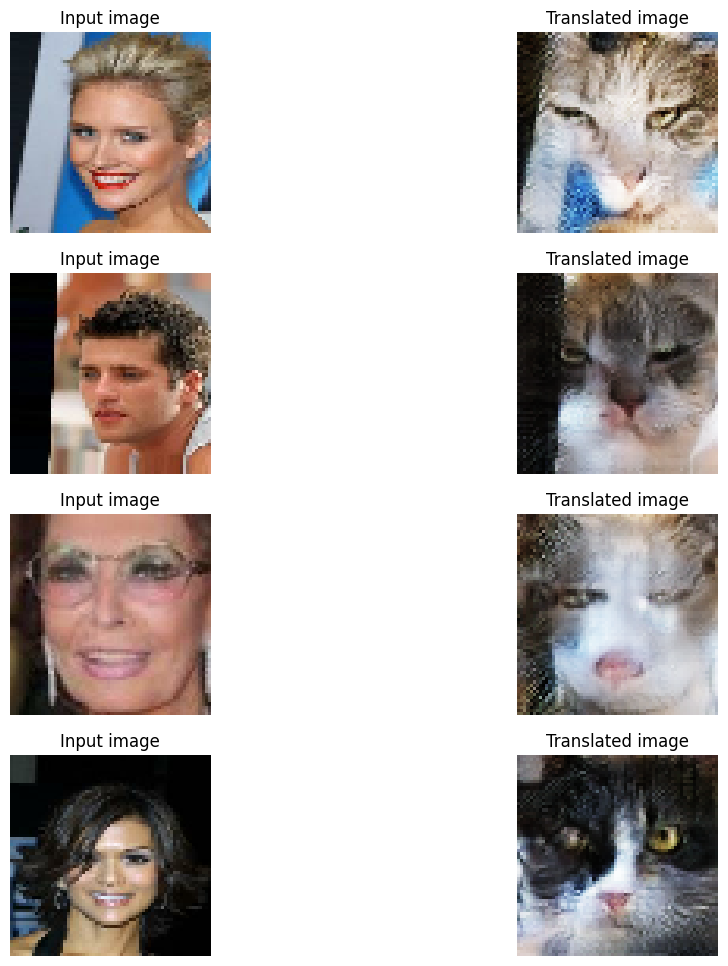

10074/10074 [==============================] - 989s 98ms/step - G_loss: 3.2441 - F_loss: 2.8137 - D_X_loss: 0.1761 - D_Y_loss: 0.1773
Epoch 8/10
10074/10074 [==============================] - ETA: 0s - G_loss: 3.2391 - F_loss: 2.8725 - D_X_loss: 0.1747 - D_Y_loss: 0.1756

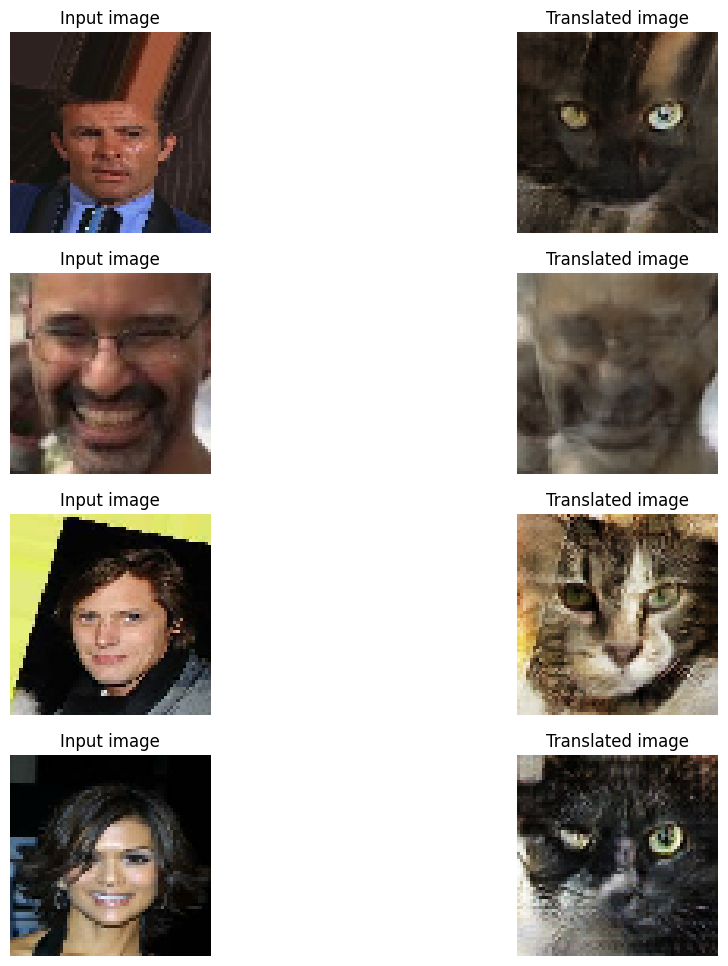

10074/10074 [==============================] - 988s 98ms/step - G_loss: 3.2391 - F_loss: 2.8726 - D_X_loss: 0.1747 - D_Y_loss: 0.1756
Epoch 9/10
10074/10074 [==============================] - ETA: 0s - G_loss: 3.2301 - F_loss: 2.9429 - D_X_loss: 0.1700 - D_Y_loss: 0.1749

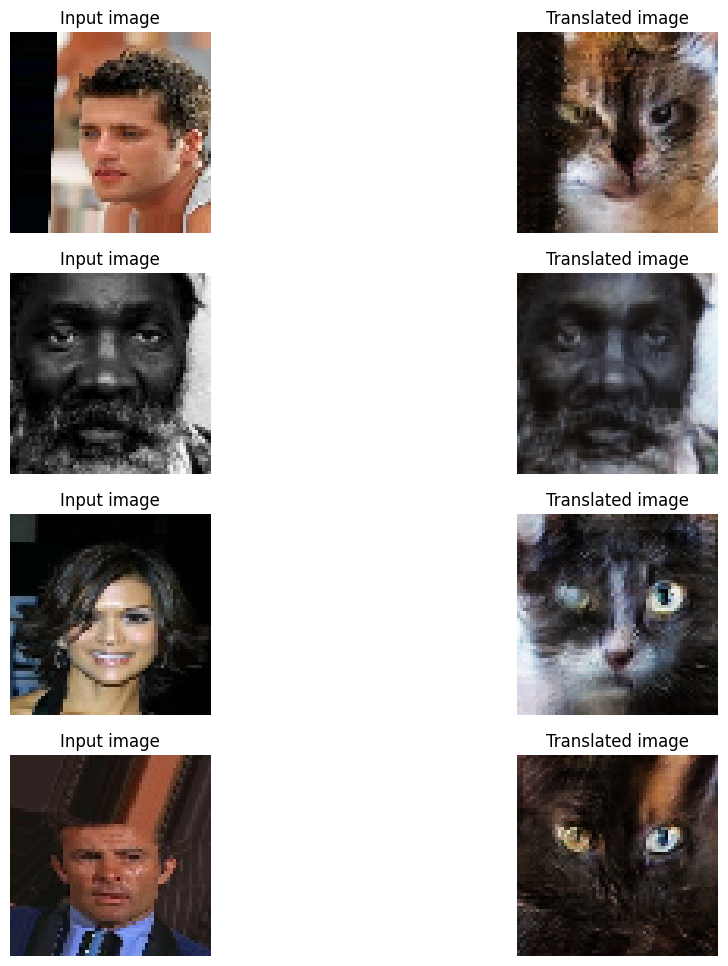

10074/10074 [==============================] - 986s 98ms/step - G_loss: 3.2302 - F_loss: 2.9430 - D_X_loss: 0.1700 - D_Y_loss: 0.1749
Epoch 10/10
10074/10074 [==============================] - ETA: 0s - G_loss: 3.2674 - F_loss: 3.0232 - D_X_loss: 0.1649 - D_Y_loss: 0.1719

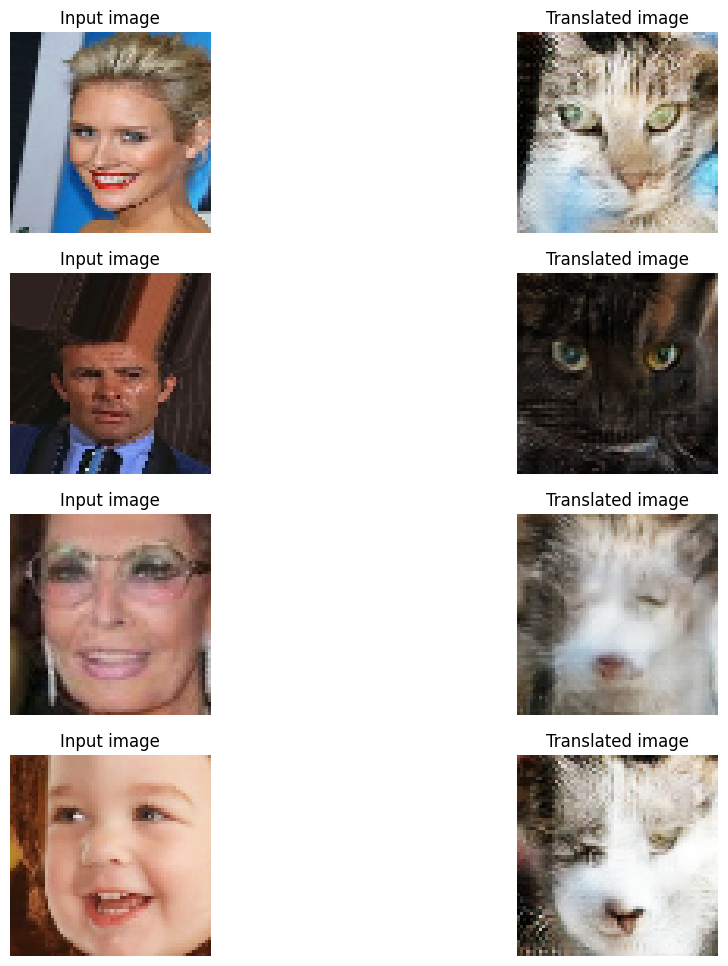

10074/10074 [==============================] - 982s 98ms/step - G_loss: 3.2674 - F_loss: 3.0232 - D_X_loss: 0.1649 - D_Y_loss: 0.1719


time: 2h 52min 5s (started: 2024-02-24 10:20:00 +00:00)


In [ ]:
# Callbacks
plotter = GANMonitor()
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_cyclegan, save_weights_only=True
)

# Here we will train the model for just one epoch as each epoch takes around
# 7 minutes on a single P100 backed machine.
cycle_gan_model.fit(
    tf.data.Dataset.zip((humans_faces_train, dogs_cats_train)),
    epochs=10,
    callbacks=[plotter, model_checkpoint_callback],
)

In [ ]:
!ls $checkpoint_path"cyclegan"

checkpoint				      cyclegan_checkpoints.006.data-00000-of-00001
cyclegan_checkpoints.001.data-00000-of-00001  cyclegan_checkpoints.006.index
cyclegan_checkpoints.001.index		      cyclegan_checkpoints.007.data-00000-of-00001
cyclegan_checkpoints.002.data-00000-of-00001  cyclegan_checkpoints.007.index
cyclegan_checkpoints.002.index		      cyclegan_checkpoints.008.data-00000-of-00001
cyclegan_checkpoints.003.data-00000-of-00001  cyclegan_checkpoints.008.index
cyclegan_checkpoints.003.index		      cyclegan_checkpoints.009.data-00000-of-00001
cyclegan_checkpoints.004.data-00000-of-00001  cyclegan_checkpoints.009.index
cyclegan_checkpoints.004.index		      cyclegan_checkpoints.010.data-00000-of-00001
cyclegan_checkpoints.005.data-00000-of-00001  cyclegan_checkpoints.010.index
cyclegan_checkpoints.005.index		      cyclegan.keras
time: 108 ms (started: 2024-03-02 15:55:44 +00:00)


In [ ]:
# from google.colab import runtime
# runtime.unassign()

### Evaluation: Examples ran on model



Using a webcam to capture images for processing on the runtime.


In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

time: 1.37 ms (started: 2024-02-17 16:25:38 +00:00)


<IPython.core.display.Javascript object>

Saved to photo.jpg


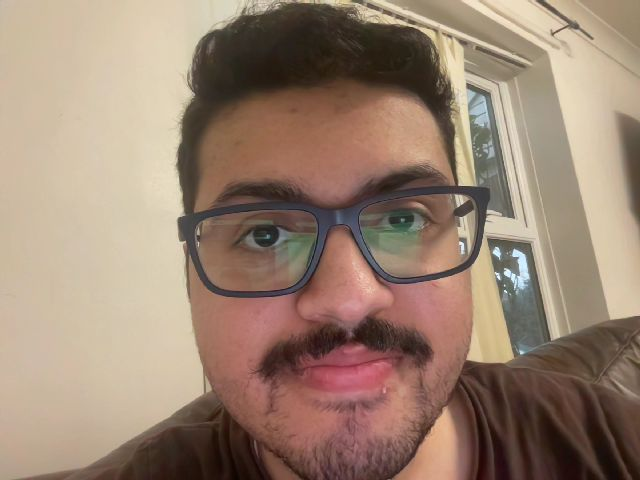

time: 43.5 s (started: 2024-02-17 16:26:27 +00:00)


In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

Load the image as a `tf.data.Dataset`


In [ ]:
from skimage import io

my_face = io.imread("photo.jpg")
print(my_face.shape)

(480, 640, 3)
time: 134 ms (started: 2024-02-24 13:12:59 +00:00)


In [ ]:
my_face_data = tf.data.Dataset.from_tensor_slices([my_face])

time: 383 ms (started: 2024-02-24 13:13:01 +00:00)


In [ ]:
type(my_face_data)

tensorflow.python.data.ops.from_tensor_slices_op._TensorSliceDataset

time: 5.81 ms (started: 2024-02-24 13:13:03 +00:00)


In [ ]:
for image in my_face_data.take(1):
  print(image)

tf.Tensor(
[[[193 180 163]
  [195 182 165]
  [199 183 167]
  ...
  [156 139 111]
  [154 137 109]
  [153 136 108]]

 [[196 183 166]
  [197 184 167]
  [201 185 169]
  ...
  [156 139 111]
  [154 137 109]
  [153 136 108]]

 [[198 185 168]
  [200 187 170]
  [203 187 171]
  ...
  [156 139 111]
  [154 137 109]
  [153 136 108]]

 ...

 [[173 157 134]
  [173 157 134]
  [173 157 134]
  ...
  [ 38  21  11]
  [ 39  22  12]
  [ 42  25  15]]

 [[173 157 134]
  [173 157 134]
  [172 156 133]
  ...
  [ 37  20  10]
  [ 38  21  11]
  [ 40  23  13]]

 [[172 156 133]
  [172 156 133]
  [172 156 133]
  ...
  [ 36  19   9]
  [ 36  19   9]
  [ 38  21  11]]], shape=(480, 640, 3), dtype=uint8)
time: 10.9 ms (started: 2024-02-24 13:13:05 +00:00)


Preprocess before inputting the dataset

In [ ]:
# Apply the preprocessing operations to the training data
my_face_example = (
    my_face_data.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size, seed=SEED)
    .batch(batch_size)
)

time: 43.5 ms (started: 2024-02-24 13:13:07 +00:00)


In [ ]:
for image in my_face_example.take(1):
  print(image)

tf.Tensor(
[[[[ 0.5764706   0.45098042  0.32549024]
   [ 0.6         0.45882356  0.28627455]
   [ 0.60784316  0.4666667   0.27843142]
   ...
   [ 0.27058828  0.10588241 -0.10588235]
   [ 0.2313726   0.09803927 -0.12156862]
   [ 0.21568632  0.082353   -0.1372549 ]]

  [[ 0.5764706   0.45882356  0.2941177 ]
   [ 0.6         0.45882356  0.27058828]
   [ 0.60784316  0.47450984  0.27058828]
   ...
   [ 0.26274514  0.09803927 -0.11372548]
   [ 0.2313726   0.09803927 -0.12156862]
   [ 0.20784318  0.07450986 -0.14509803]]

  [[ 0.5921569   0.4666667   0.28627455]
   [ 0.6156863   0.45882356  0.26274514]
   [ 0.60784316  0.47450984  0.27058828]
   ...
   [ 0.24705887  0.09803927 -0.1372549 ]
   [ 0.21568632  0.082353   -0.1372549 ]
   [ 0.19215691  0.05882359 -0.1607843 ]]

  ...

  [[ 0.427451    0.28627455  0.12941182]
   [ 0.45098042  0.27843142  0.11372554]
   [ 0.45882356  0.26274514  0.09019613]
   ...
   [-0.73333335 -0.8509804  -0.8901961 ]
   [-0.7490196  -0.8745098  -0.9764706 ]
   [-

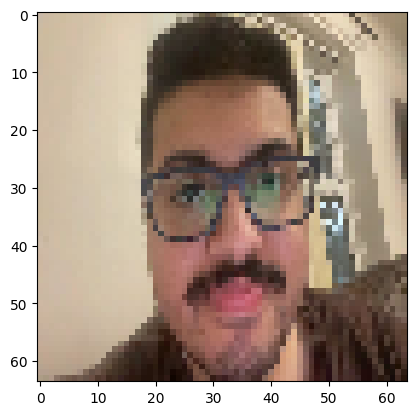

time: 158 ms (started: 2024-02-24 13:13:13 +00:00)


In [ ]:
for image in my_face_example.take(1):
    image = (((image[0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    plt.imshow(image)
plt.show()

Create the CycleGAN model instance running on pre-train weights

In [ ]:
# Create an instance of the CycleGAN model
cycle_gan_model_instance = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Compile the model
cycle_gan_model_instance.compile(
    gen_G_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)

time: 21.5 ms (started: 2024-03-02 15:51:10 +00:00)


In [ ]:
cyclegan_latest = tf.train.latest_checkpoint(checkpoint_path+"cyclegan/")

time: 729 ms (started: 2024-03-02 15:51:11 +00:00)


In [ ]:
cycle_gan_model_instance.save(checkpoint_path+"cyclegan/cyclegan.keras")

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_api.py:164: UserWarning: You are saving a model that has not yet been built. It might not contain any weights yet. Consider building the model first by calling it on some data.
  saving_lib.save_model(model, filepath)


time: 2.87 s (started: 2024-03-02 15:52:29 +00:00)


Load in model checkpoint and run the example image `my_face_example`

Weights loaded successfully


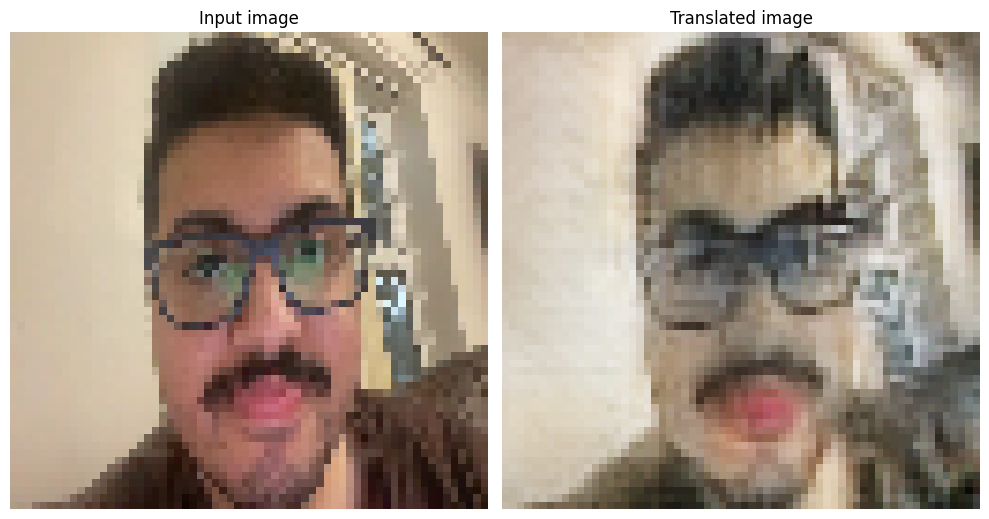

time: 3.52 s (started: 2024-02-24 13:13:43 +00:00)


In [ ]:
model_run_cyclegan = cycle_gan_model_instance.load_weights(cyclegan_latest).expect_partial()
print("Weights loaded successfully")

_, ax = plt.subplots(1, 2, figsize=(10, 15))
for img in my_face_example.take(1):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[0].imshow(img)
    ax[1].imshow(prediction)
    ax[0].set_title("Input image")
    ax[1].set_title("Translated image")
    ax[0].axis("off")
    ax[1].axis("off")

    prediction = keras.utils.array_to_img(prediction)
    prediction.save("predicted_img_cyclegan.png")
plt.tight_layout()
plt.show()


Load a staff member picture

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving photo.jpg to photo.jpg
Saving stephen_staff.jpg to stephen_staff.jpg
User uploaded file "photo.jpg" with length 35116 bytes
User uploaded file "stephen_staff.jpg" with length 20400 bytes
time: 17.8 s (started: 2024-02-24 13:12:33 +00:00)


In [ ]:
from skimage import io

staff_image = io.imread('stephen_staff.jpg')
print(staff_image.shape)

(296, 236, 3)
time: 3.83 ms (started: 2024-02-24 13:13:53 +00:00)


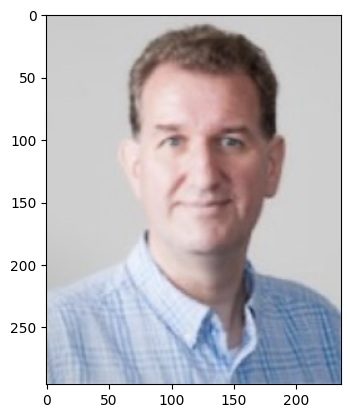

time: 219 ms (started: 2024-02-24 13:14:01 +00:00)


In [ ]:
plt.imshow(staff_image)

Load the image as a `tf.data.Dataset`

In [ ]:
staff_image_data = tf.data.Dataset.from_tensor_slices([staff_image])

time: 89.7 ms (started: 2024-02-24 13:14:04 +00:00)


In [ ]:
type(staff_image_data)

tensorflow.python.data.ops.from_tensor_slices_op._TensorSliceDataset

time: 5.27 ms (started: 2024-02-24 13:14:05 +00:00)


In [ ]:
for image in staff_image_data.take(1):
  print(image)

tf.Tensor(
[[[217 217 217]
  [213 213 213]
  [212 212 212]
  ...
  [212 212 212]
  [209 209 209]
  [216 216 216]]

 [[207 207 207]
  [204 204 204]
  [203 203 203]
  ...
  [206 206 206]
  [204 204 204]
  [211 211 211]]

 [[207 207 207]
  [204 204 204]
  [203 203 203]
  ...
  [204 204 204]
  [202 202 202]
  [210 210 210]]

 ...

 [[189 201 217]
  [178 190 206]
  [170 183 200]
  ...
  [100 126 161]
  [100 124 158]
  [120 144 178]]

 [[190 199 214]
  [180 192 208]
  [174 187 204]
  ...
  [110 134 170]
  [104 128 162]
  [118 142 176]]

 [[198 207 222]
  [192 204 218]
  [189 200 218]
  ...
  [129 153 189]
  [118 142 176]
  [125 149 183]]], shape=(296, 236, 3), dtype=uint8)
time: 9.99 ms (started: 2024-02-24 13:14:07 +00:00)


Preprocess before inputting the dataset

In [ ]:
# Apply the preprocessing operations to the training data
staff_image_example = (
    staff_image_data.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size, seed=SEED)
    .batch(batch_size)
)

time: 43 ms (started: 2024-02-24 13:14:10 +00:00)


In [ ]:
for image in staff_image_example.take(1):
  print(image)

tf.Tensor(
[[[[ 0.58431375  0.58431375  0.58431375]
   [ 0.5921569   0.5921569   0.5921569 ]
   [ 0.5921569   0.5921569   0.5921569 ]
   ...
   [ 0.5921569   0.5921569   0.5921569 ]
   [ 0.5921569   0.5921569   0.5921569 ]
   [ 0.6         0.6         0.6       ]]

  [[ 0.5921569   0.5921569   0.5921569 ]
   [ 0.5921569   0.5921569   0.5921569 ]
   [ 0.5921569   0.5921569   0.5921569 ]
   ...
   [ 0.5921569   0.5921569   0.5921569 ]
   [ 0.5921569   0.5921569   0.5921569 ]
   [ 0.5921569   0.5921569   0.5921569 ]]

  [[ 0.6         0.6         0.6       ]
   [ 0.6         0.6         0.6       ]
   [ 0.6         0.6         0.6       ]
   ...
   [ 0.5921569   0.5921569   0.5921569 ]
   [ 0.5921569   0.5921569   0.5921569 ]
   [ 0.6         0.6         0.6       ]]

  ...

  [[-0.1607843   0.00392163  0.21568632]
   [-0.23921567  0.0196079   0.2941177 ]
   [-0.31764704 -0.09019607  0.17647064]
   ...
   [ 0.38823533  0.48235297  0.654902  ]
   [ 0.26274514  0.35686278  0.5294118 ]
   [ 

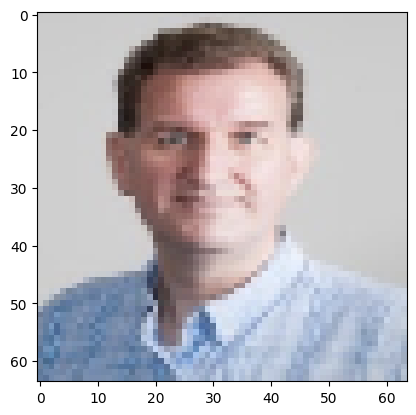

time: 151 ms (started: 2024-02-24 13:14:16 +00:00)


In [ ]:
for image in staff_image_example.take(1):
    image = (((image[0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    plt.imshow(image)
plt.show()

Weights loaded successfully


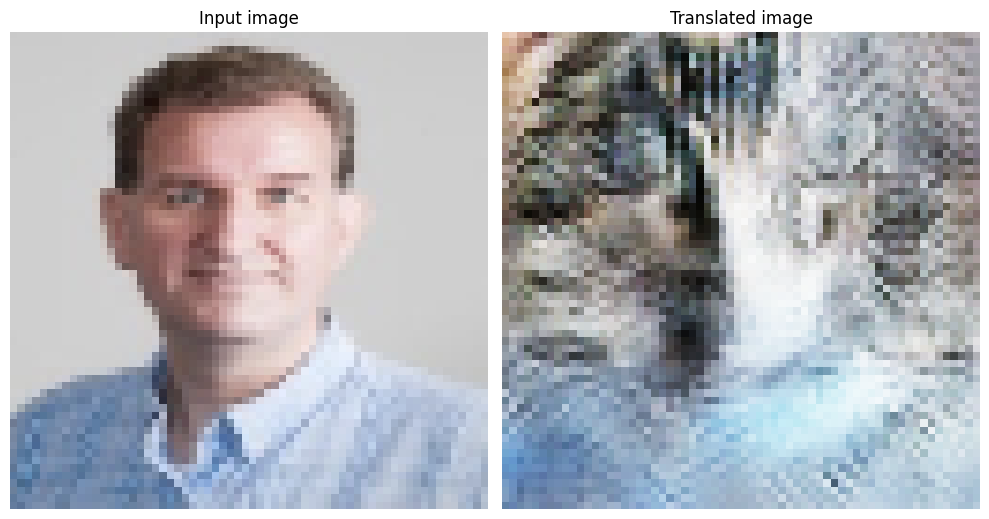

time: 1.06 s (started: 2024-02-24 13:14:18 +00:00)


In [ ]:
model_run_cyclegan = cycle_gan_model_instance.load_weights(cyclegan_latest).expect_partial()
print("Weights loaded successfully")

_, ax = plt.subplots(1, 2, figsize=(10, 15))
for img in staff_image_example.take(1):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[0].imshow(img)
    ax[1].imshow(prediction)
    ax[0].set_title("Input image")
    ax[1].set_title("Translated image")
    ax[0].axis("off")
    ax[1].axis("off")

    prediction = keras.utils.array_to_img(prediction)
    prediction.save("predicted_img_cyclegan.png")
plt.tight_layout()
plt.show()

### Demo

## 2) Fine-Grained Classification [30%]

### Data Preparation

Load the CSV files of the training, validation and testing sets

In [ ]:
import pandas as pd

train_csv = pd.read_csv(aircraft_csv_path+"train.csv")
valid_csv = pd.read_csv(aircraft_csv_path+"val.csv")
test_csv = pd.read_csv(aircraft_csv_path+"test.csv")

time: 876 ms (started: 2024-03-02 13:47:46 +00:00)


View the CSV files

In [ ]:
train_csv.head()

,filename,Classes,Labels
0,1025794.jpg,707-320,0
1,1340192.jpg,707-320,0
2,0056978.jpg,707-320,0
3,0698580.jpg,707-320,0
4,0450014.jpg,707-320,0


time: 50.5 ms (started: 2024-03-02 13:47:46 +00:00)


In [ ]:
valid_csv.head()

,filename,Classes,Labels
0,0481847.jpg,707-320,0
1,0810608.jpg,707-320,0
2,1514481.jpg,707-320,0
3,0887066.jpg,707-320,0
4,1318819.jpg,707-320,0


time: 25.7 ms (started: 2024-03-02 13:47:47 +00:00)


In [ ]:
test_csv.head()

,filename,Classes,Labels
0,1514522.jpg,707-320,0
1,0747566.jpg,707-320,0
2,1008575.jpg,707-320,0
3,0717480.jpg,707-320,0
4,0991569.jpg,707-320,0


time: 28.6 ms (started: 2024-03-02 13:47:47 +00:00)


In [ ]:
print(train_csv['Labels'].values)

[ 0  0  0 ... 99 99 99]
time: 4.97 ms (started: 2024-03-02 13:47:47 +00:00)


Read images and labels under the columns `filename` and `Labels` in the `train_csv`, `valid_csv` and `test_csv`

Add the path locations on top of the `filename`, so it easy to implement the rest of the stack

In [ ]:
train_csv['filename'] = aircraft_images_path + train_csv['filename']
valid_csv['filename'] = aircraft_images_path + valid_csv['filename']
test_csv['filename'] = aircraft_images_path + test_csv['filename']

time: 9.03 ms (started: 2024-03-02 13:47:48 +00:00)


In [ ]:
train_csv.head()

,filename,Classes,Labels
0,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0
1,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0
2,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0
3,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0
4,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0


time: 23.8 ms (started: 2024-03-02 13:47:49 +00:00)


In [ ]:
valid_csv.head()

,filename,Classes,Labels
0,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0
1,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0
2,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0
3,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0
4,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0


time: 22.4 ms (started: 2024-03-02 13:47:49 +00:00)


In [ ]:
test_csv.head()

,filename,Classes,Labels
0,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0
1,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0
2,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0
3,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0
4,/content/drive/MyDrive/msc-data-science-23-24/...,707-320,0


time: 22.7 ms (started: 2024-03-02 13:47:50 +00:00)


Load `filename` columns as a `tf.data.Dataset`

In [ ]:
train_images_paths = tf.data.Dataset.from_tensor_slices((train_csv['filename'].values, train_csv['Labels'].values))
valid_images_paths = tf.data.Dataset.from_tensor_slices((valid_csv['filename'].values, valid_csv['Labels'].values))
test_images_paths = tf.data.Dataset.from_tensor_slices((test_csv['filename'].values, test_csv['Labels'].values))

time: 16.2 ms (started: 2024-03-02 13:47:51 +00:00)


Check if `train_csv`, `valid_csv` and `test_csv` is loaded probably as `tf.data.Dataset`

In [ ]:
for image in train_images_paths.take(10):
  print(image)

(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/1025794.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/1340192.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/0056978.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/0698580.jpg'>, <tf.Tensor: shape=(), dtype=i

In [ ]:
for image in valid_images_paths.take(10):
  print(image)

(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/0481847.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/0810608.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/1514481.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/0887066.jpg'>, <tf.Tensor: shape=(), dtype=i

In [ ]:
for image in test_images_paths.take(10):
  print(image)

(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/1514522.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/0747566.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/1008575.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/MyDrive/msc-data-science-23-24/csc8637-deep-learning/data/classification_aircraft/fgvc-aircraft-2013b/fgvc-aircraft-2013b/data/images/0717480.jpg'>, <tf.Tensor: shape=(), dtype=i

Load the images corresponding the `filename` columns in the `tf.data.Dataset`: `train_images_paths`, `valid_images_paths` and `test_images_paths`

In [ ]:
def load_images(file_paths, labels):
  img = tf.io.read_file(file_paths) # load the raw data from the file as a string
  img = tf.image.decode_jpeg(img)

  return img, labels

time: 894 µs (started: 2024-03-02 13:47:56 +00:00)


In [ ]:
train_aircraft = train_images_paths.map(load_images)
valid_aircraft = valid_images_paths.map(load_images)
test_aircraft = test_images_paths.map(load_images)

time: 75.5 ms (started: 2024-03-02 13:47:56 +00:00)


Check if the images has been loaded as `tf.data.Dataset`

In [ ]:
for image in train_aircraft.take(1):
  print(image)

(<tf.Tensor: shape=(695, 1024, 3), dtype=uint8, numpy=
array([[[219, 219, 219],
        [218, 218, 218],
        [219, 219, 219],
        ...,
        [222, 222, 222],
        [221, 221, 221],
        [220, 220, 220]],

       [[216, 216, 216],
        [219, 219, 219],
        [222, 222, 222],
        ...,
        [219, 219, 219],
        [220, 220, 220],
        [221, 221, 221]],

       [[217, 217, 217],
        [220, 220, 220],
        [221, 221, 221],
        ...,
        [221, 221, 221],
        [222, 222, 222],
        [224, 224, 224]],

       ...,

       [[  2,  11,   8],
        [ 59,  72,  81],
        [ 98, 115, 125],
        ...,
        [  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   2,   0],
        [  0,   2,   3],
        [  0,   1,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  5,   1,   0],
        [  3,   0,   4],
        [  3,   0,   2],
        ...,
        [  0,   0, 

In [ ]:
for image in valid_aircraft.take(1):
  print(image)

(<tf.Tensor: shape=(802, 1200, 3), dtype=uint8, numpy=
array([[[110, 145, 183],
        [110, 145, 183],
        [108, 143, 181],
        ...,
        [162, 173, 191],
        [161, 172, 190],
        [163, 174, 192]],

       [[109, 144, 182],
        [110, 145, 183],
        [109, 144, 182],
        ...,
        [162, 173, 191],
        [161, 172, 190],
        [162, 173, 191]],

       [[108, 143, 181],
        [110, 145, 183],
        [110, 145, 183],
        ...,
        [163, 174, 192],
        [162, 173, 191],
        [163, 174, 192]],

       ...,

       [[  0,   1,   0],
        [  0,   1,   0],
        [246, 248, 247],
        ...,
        [ 42,  46,  49],
        [  0,   0,   4],
        [  0,   0,   4]],

       [[  1,   1,   1],
        [  1,   1,   1],
        [254, 254, 254],
        ...,
        [ 46,  47,  49],
        [  1,   2,   4],
        [  4,   5,   7]],

       [[  4,   4,   4],
        [  4,   4,   4],
        [  0,   0,   0],
        ...,
        [  1,   2, 

In [ ]:
for image in test_aircraft.take(1):
  print(image)

(<tf.Tensor: shape=(882, 1200, 3), dtype=uint8, numpy=
array([[[ 91,  99, 122],
        [ 91,  99, 120],
        [ 94, 100, 122],
        ...,
        [136, 144, 155],
        [136, 144, 155],
        [138, 146, 157]],

       [[ 91,  99, 122],
        [ 91,  99, 120],
        [ 95, 101, 123],
        ...,
        [135, 143, 154],
        [135, 143, 154],
        [137, 145, 156]],

       [[ 93, 101, 124],
        [ 93, 101, 122],
        [ 95, 101, 123],
        ...,
        [136, 144, 155],
        [135, 143, 154],
        [136, 144, 155]],

       ...,

       [[  0,   1,   2],
        [106, 120, 129],
        [ 78,  88,  97],
        ...,
        [  0,   1,   0],
        [  0,   0,   0],
        [  0,   1,   0]],

       [[  0,   6,  12],
        [ 47,  60,  68],
        [ 94, 108, 117],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  3,   0,   0],
        [  1,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0, 

Visualise some samples

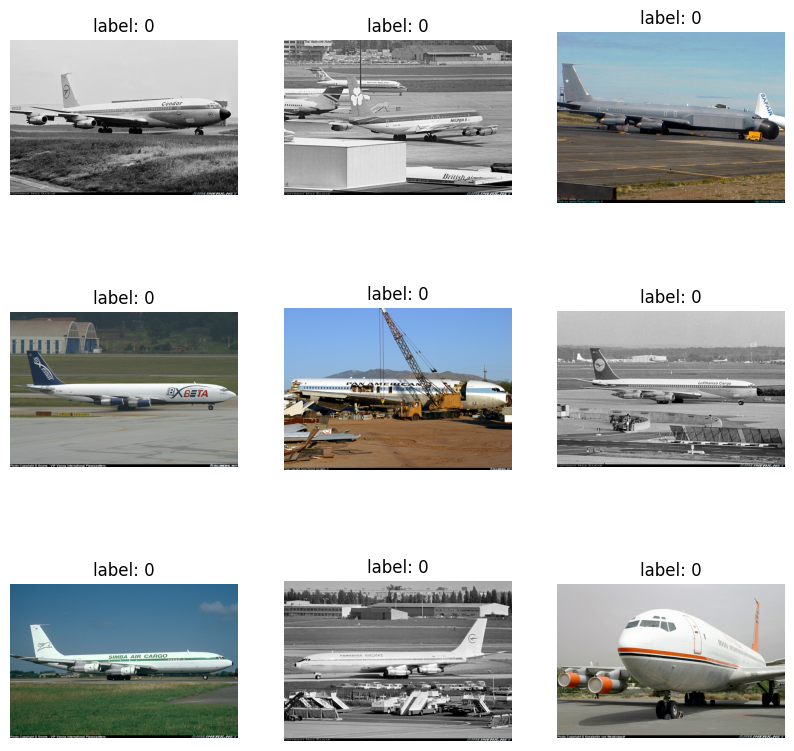

time: 2.01 s (started: 2024-03-01 19:54:36 +00:00)


In [ ]:
i = 0
plt.figure(figsize=(10, 10))
for image, label in train_aircraft.take(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image)
  plt.title(f'label: {label}')
  plt.axis("off")
  i += 1

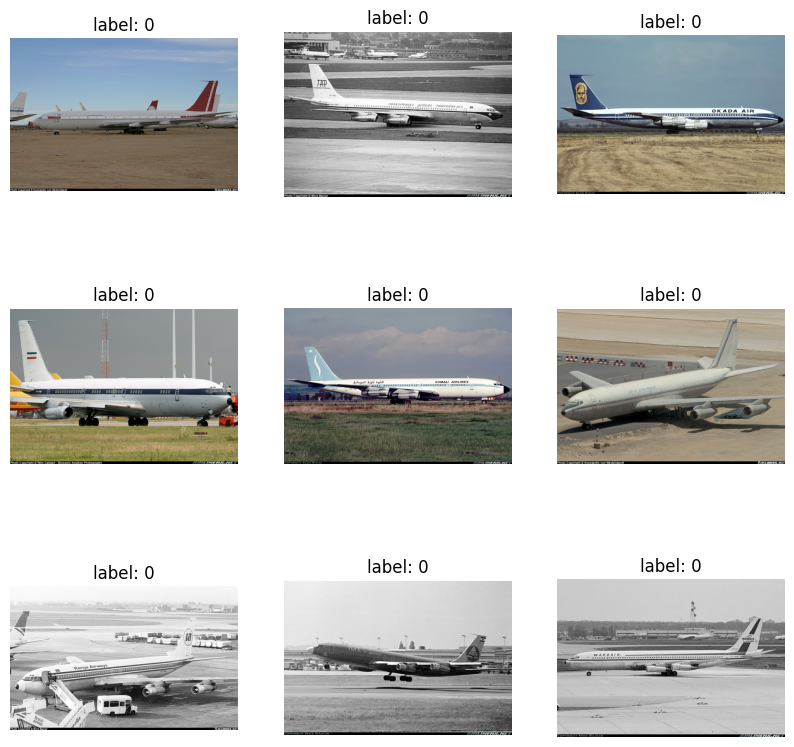

time: 2.15 s (started: 2024-03-01 19:54:38 +00:00)


In [ ]:
i = 0
plt.figure(figsize=(10, 10))
for image, label in valid_aircraft.take(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image)
  plt.title(f'label: {label}')
  plt.axis("off")
  i += 1

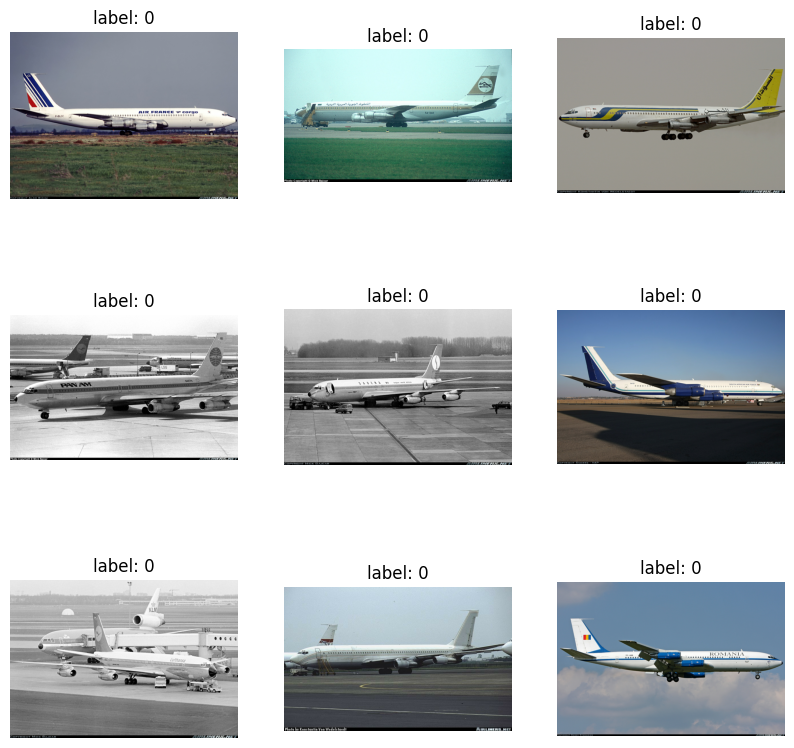

time: 2.22 s (started: 2024-03-01 19:54:40 +00:00)


In [ ]:
i = 0
plt.figure(figsize=(10, 10))
for image, label in test_aircraft.take(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image)
  plt.title(f'label: {label}')
  plt.axis("off")
  i += 1

View the size of the datasets

In [ ]:
train_aircraft.cardinality().numpy()

3334

time: 4.2 ms (started: 2024-03-01 19:54:43 +00:00)


In [ ]:
valid_aircraft.cardinality().numpy()

3333

time: 2.31 ms (started: 2024-03-01 19:54:43 +00:00)


In [ ]:
test_aircraft.cardinality().numpy()

3333

time: 2.2 ms (started: 2024-03-01 19:54:43 +00:00)


### Data Preprocessing

In [ ]:
def preprocessing_aircraft_images(images, labels):
  image_size = (224, 224)

  images = tf.image.resize(images, image_size, method='nearest')

  # Crop the image by removing the bottom 20 pixels
  height, width = image_size
  images = tf.image.crop_to_bounding_box(images, 0, 0, height - 20, width)
  images = tf.image.resize(images, image_size, method='nearest')  # Change to bilinear

  # EfficientNet does not need normalisation
  # https://www.tensorflow.org/api_docs/python/tf/keras/applications/efficientnet/preprocess_input

  return images, labels

time: 985 µs (started: 2024-03-02 13:48:28 +00:00)


In [ ]:
train_aircraft_preprocessed = train_aircraft.map(preprocessing_aircraft_images)
valid_aircraft_preprocessed = valid_aircraft.map(preprocessing_aircraft_images)
test_aircraft_preprocessed = test_aircraft.map(preprocessing_aircraft_images)

time: 363 ms (started: 2024-03-02 13:48:29 +00:00)


Check if the datasets are preprocessed probably

In [ ]:
for image, _ in train_aircraft_preprocessed.take(10):
  print(image.numpy().shape)
  print(image.numpy()[0][0][0])

(224, 224, 3)
222
(224, 224, 3)
168
(224, 224, 3)
128
(224, 224, 3)
50
(224, 224, 3)
116
(224, 224, 3)
203
(224, 224, 3)
35
(224, 224, 3)
171
(224, 224, 3)
191
(224, 224, 3)
106
time: 734 ms (started: 2024-03-01 19:54:43 +00:00)


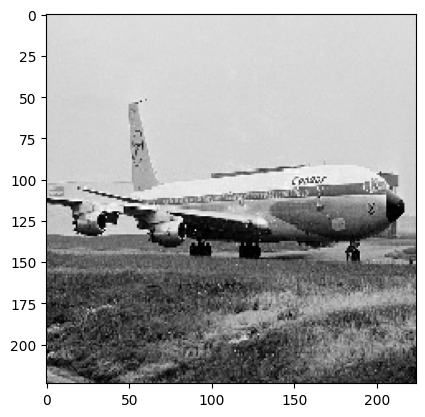

time: 479 ms (started: 2024-03-01 19:54:44 +00:00)


In [ ]:
for image, _ in train_aircraft_preprocessed.take(1):
  # preprocessed = (((image.numpy() + 1) * 255) / 2).astype(np.uint(8))
  preprocessed = image.numpy()
  plt.imshow(preprocessed)

Compare preprocessed images to original images to see if it removed the **"20 pixels high containing copyright information"** - FGVC-Aircraft Benchmark, `README.html` file

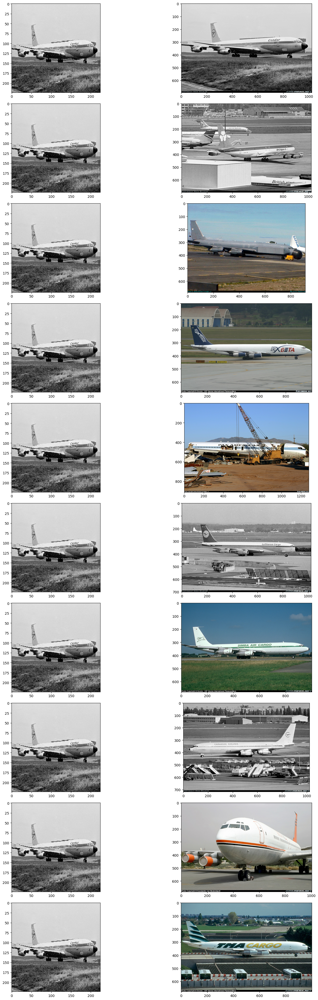

time: 8.31 s (started: 2024-03-01 19:54:44 +00:00)


In [ ]:
fig, ax = plt.subplots(10, 2, figsize=(20, 40))
for i, samples in enumerate(zip(train_aircraft_preprocessed.take(10), train_aircraft.take(10))):
    # preprocessed = ((((samples[0][0] + 1) * 255) / 2).numpy()).astype(np.uint8)
    preprocessed = image.numpy()
    normal = samples[1][0]
    ax[i, 0].imshow(preprocessed)#, aspect='auto')
    ax[i, 1].imshow(normal)#, aspect='auto')
    fig.tight_layout()
plt.show()

Optimise the dataset for training on **GPU** and **shuffle** the dataset

In [ ]:
autotune = tf.data.AUTOTUNE

# seed to for reproducibility
SEED = 123
buffer_size = 256
# batch_size = 1
batch_size = 32  # For faster training

time: 750 µs (started: 2024-03-02 13:49:05 +00:00)


Setup the number of classes

In [ ]:
num_classes = len(train_csv['Labels'].unique())
print(num_classes)

100
time: 9.6 ms (started: 2024-03-02 14:58:42 +00:00)


In [ ]:
train_aircraft_optimised = (
    train_aircraft_preprocessed
    .map(lambda x, y: (x, tf.one_hot(y, depth=num_classes)))  # Convert labels to one-hot encoding
    .prefetch(autotune)
    .cache()
    .shuffle(buffer_size, seed=SEED)
    .batch(batch_size)
)
valid_aircraft_optimised = (
    valid_aircraft_preprocessed
    .map(lambda x, y: (x, tf.one_hot(y, depth=num_classes)))  # Convert labels to one-hot encoding
    .prefetch(autotune)
    .cache()
    .shuffle(buffer_size, seed=SEED)
    .batch(batch_size)
)
test_aircraft_optimised = (
    test_aircraft_preprocessed
    .map(lambda x, y: (x, tf.one_hot(y, depth=num_classes)))  # Convert labels to one-hot encoding
    .cache()
    .shuffle(buffer_size, seed=SEED)
    .batch(batch_size)
)

time: 108 ms (started: 2024-03-02 13:49:06 +00:00)


Visualise some samples

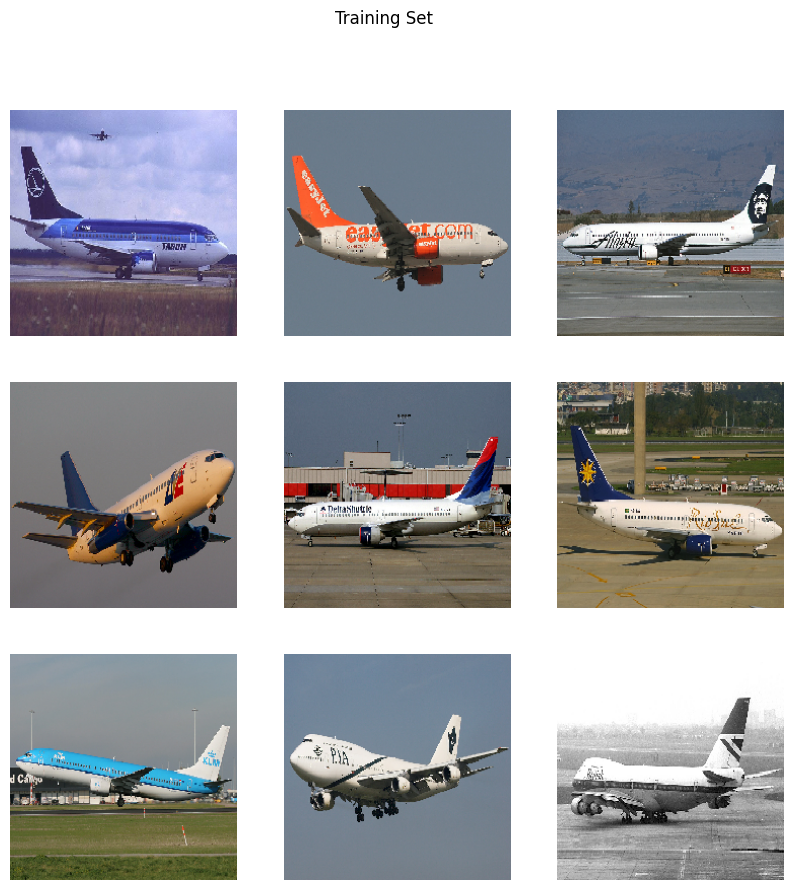

time: 14.8 s (started: 2024-03-01 19:54:54 +00:00)


In [ ]:
i = 0
plt.figure(figsize=(10, 10))
for image, label in train_aircraft_optimised.take(9):
  ax = plt.subplot(3, 3, i + 1)
  # preprocessed = (((image[0].numpy() + 1) * 255) / 2).astype(np.uint8)
  preprocessed = image[0].numpy()
  plt.imshow(preprocessed)
  # plt.title(f'label: {label}')
  plt.suptitle("Training Set")
  plt.axis("off")
  i += 1

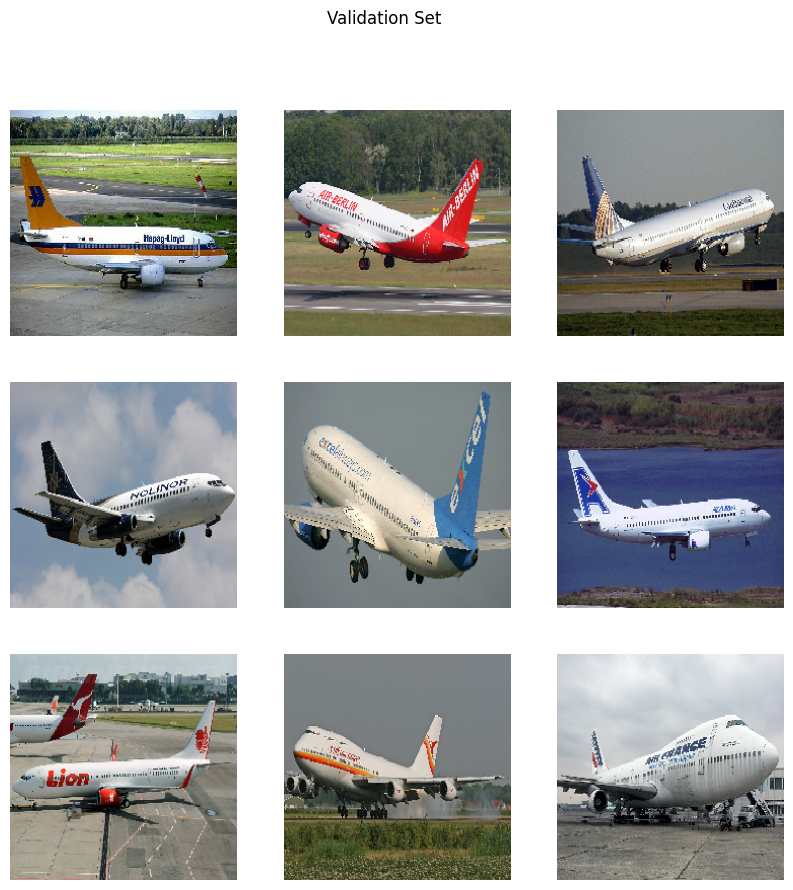

time: 13.8 s (started: 2024-03-01 19:55:09 +00:00)


In [ ]:
i = 0
plt.figure(figsize=(10, 10))
for image, label in valid_aircraft_optimised.take(9):
  ax = plt.subplot(3, 3, i + 1)
  # preprocessed = (((image[0].numpy() + 1) * 255) / 2).astype(np.uint8)
  preprocessed = image[0].numpy()
  plt.imshow(preprocessed)
  # plt.title(f'label: {label}')
  plt.suptitle("Validation Set")
  plt.axis("off")
  i += 1

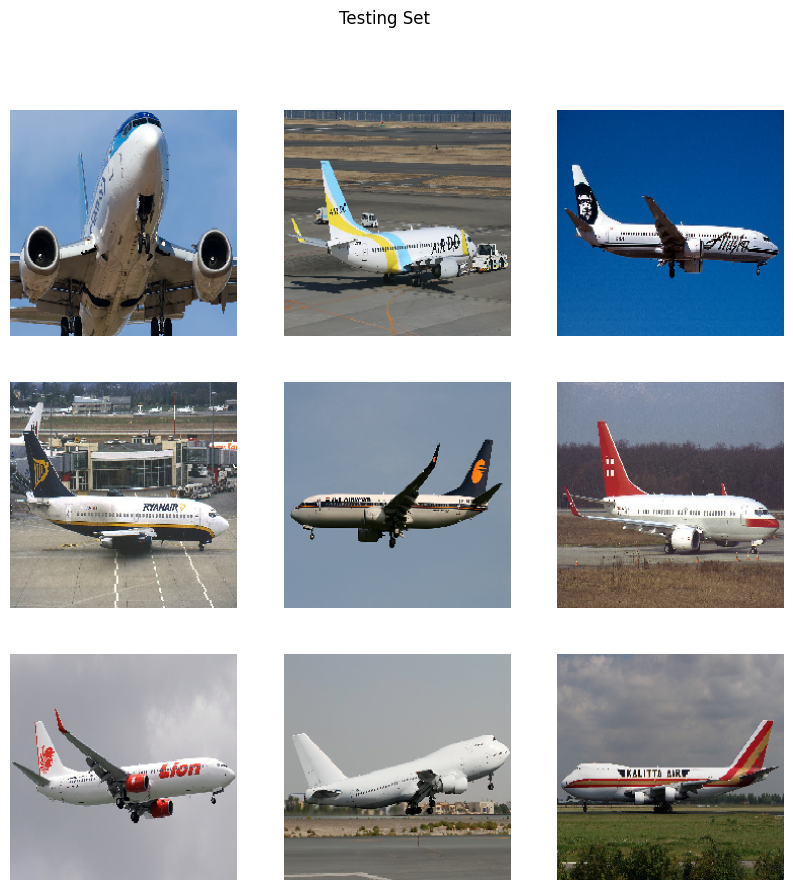

time: 15.1 s (started: 2024-03-01 19:55:23 +00:00)


In [ ]:
i = 0
plt.figure(figsize=(10, 10))
for image, label in test_aircraft_optimised.take(9):
  ax = plt.subplot(3, 3, i + 1)
  # preprocessed = (((image[0].numpy() + 1) * 255) / 2).astype(np.uint8)
  preprocessed = image[0].numpy()
  plt.imshow(preprocessed)
  # plt.title(f'label: {label}')
  plt.suptitle("Testing Set")
  plt.axis("off")
  i += 1

View the sizes of the final datasets

In [ ]:
train_aircraft_optimised.cardinality().numpy()

105

time: 2.52 ms (started: 2024-03-01 19:55:38 +00:00)


In [ ]:
valid_aircraft_optimised.cardinality().numpy()

105

time: 2.63 ms (started: 2024-03-01 19:55:38 +00:00)


In [ ]:
test_aircraft_optimised.cardinality().numpy()

105

time: 2.65 ms (started: 2024-03-01 19:55:38 +00:00)


### DEPRECATED Modelling (SKIP FOR MARKING)

In [ ]:
# # base_model_resnet = keras.applications.ResNet50V2(weights="imagenet",
# #                                                   include_top=False)

# # base_model_resnet.summary()


# # base_model_inception = keras.applications.InceptionV3(weights="imagenet",
# #                                                       # pooling='avg',
# #                                                       include_top=False)

# # base_model_inception.summary()

# base_model_efficientnet = keras.applications.EfficientNetB7(weights="imagenet",
#                                                             include_top=False)

# base_model_efficientnet.summary()

Model: "efficientnetb7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 rescaling_6 (Rescaling)     (None, None, None, 3)        0         ['input_4[0][0]']             
                                                                                                  
 normalization_3 (Normaliza  (None, None, None, 3)        7         ['rescaling_6[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_7 (Rescaling)     (None, None, None, 3)        0         ['normalization_3

In [ ]:
# keras.utils.plot_model(base_model_efficientnet, show_shapes=True)

time: 214 µs (started: 2024-02-29 14:42:20 +00:00)


Set hyperparameters

In [ ]:
num_epochs = 100
learning_rate = 0.001
optimisers = keras.optimizers.Adam(learning_rate=learning_rate)
dropout_rate = 0.5

time: 3.84 ms (started: 2024-02-29 14:43:27 +00:00)


In [ ]:
# from keras import layers
# # Freeze the weights of the pre-trained layers
# # for layer in base_model_resnet.layers:
# #     layer.trainable = False

# # for layer in base_model_inception.layers:
# #     layer.trainable = False

# for layer in base_model_efficientnet.layers:
#     layer.trainable = False

# # Unfreeze the first 100 layers
# for layer in base_model_efficientnet.layers[:20]:
#     layer.trainable = True

# # Create a new model with your output layer
# model_task2 = keras.models.Sequential([
#     # base_model_resnet,
#     # base_model_inception,
#     base_model_efficientnet,
#     layers.GlobalAveragePooling2D(),
#     # layers.Flatten(),
#     # layers.Dense(2560, activation='relu'),
#     # layers.Dense(2560, activation='relu'),
#     layers.Dropout(dropout_rate),
#     layers.Dense(num_classes, activation='softmax')
# ])

time: 2.76 s (started: 2024-02-29 14:43:27 +00:00)


In [ ]:
# model_task2.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb7 (Functional  (None, None, None, 2560   64097687  
 )                           )                                   
                                                                 
 global_average_pooling2d_7  (None, 2560)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_7 (Dropout)         (None, 2560)              0         
                                                                 
 dense_7 (Dense)             (None, 100)               256100    
                                                                 
Total params: 64353787 (245.49 MB)
Trainable params: 263252 (1.00 MB)
Non-trainable params: 64090535 (244.49 MB)
_________________________________________________________________
time: 6

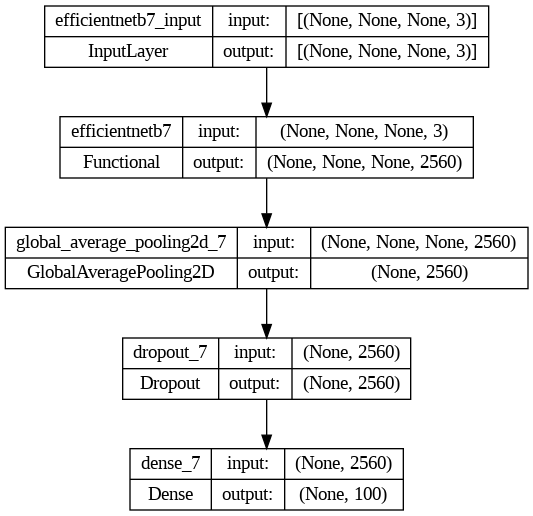

time: 45.3 ms (started: 2024-02-29 14:43:30 +00:00)


In [ ]:
# keras.utils.plot_model(model_task2, show_shapes=True)

In [ ]:
# model_task2.compile(optimizer=optimisers, loss='categorical_crossentropy', metrics=['accuracy'])

time: 15.9 ms (started: 2024-02-29 14:43:30 +00:00)


Add checkpoints and path

In [ ]:
# model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
#     filepath=checkpoint_task2, save_weights_only=True
# )

time: 495 µs (started: 2024-02-29 14:42:23 +00:00)


Add early stopping

In [ ]:
# # Define the EarlyStopping callback
# early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)

time: 433 µs (started: 2024-02-29 14:44:09 +00:00)


In [ ]:
# model_task2.fit(train_aircraft_optimised, epochs=num_epochs, validation_data=valid_aircraft_optimised, callbacks=[model_checkpoint_callback, early_stopping])

Epoch 1/100
105/105 [==============================] - 83s 555ms/step - loss: 5.6109 - accuracy: 0.0282 - val_loss: 4.5745 - val_accuracy: 0.0615
Epoch 2/100
105/105 [==============================] - 51s 488ms/step - loss: 4.5113 - accuracy: 0.0690 - val_loss: 4.6412 - val_accuracy: 0.0828
Epoch 3/100
105/105 [==============================] - 51s 487ms/step - loss: 4.7295 - accuracy: 0.0369 - val_loss: 4.6133 - val_accuracy: 0.0546
Epoch 4/100
105/105 [==============================] - 51s 490ms/step - loss: 4.0578 - accuracy: 0.1044 - val_loss: 3.9547 - val_accuracy: 0.1131
Epoch 5/100
105/105 [==============================] - 51s 489ms/step - loss: 3.6440 - accuracy: 0.1776 - val_loss: 3.6028 - val_accuracy: 0.1479
Epoch 6/100
105/105 [==============================] - 51s 489ms/step - loss: 3.3403 - accuracy: 0.2151 - val_loss: 3.4768 - val_accuracy: 0.2079
Epoch 7/100
105/105 [==============================] - 51s 490ms/step - loss: 2.9588 - accuracy: 0.2819 - val_loss: 3.7061 -

time: 22min 54s (started: 2024-02-29 14:45:18 +00:00)


In [ ]:
# from google.colab import runtime
# runtime.unassign()

Save entire model as a `.keras` format

In [ ]:
# model_task2_path = checkpoint_path+"fine-grained_model/"
# model_task2.save(model_task2_path+"fine-grained_model.keras")

time: 7.93 s (started: 2024-02-28 17:12:34 +00:00)


### Modelling

Install and import `keras_tuner`

In [ ]:
!pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 1.5 MB/s eta 0:00:00
time: 7.94 s (started: 2024-03-02 13:49:30 +00:00)


In [ ]:
import keras_tuner

time: 167 ms (started: 2024-03-02 13:49:38 +00:00)


Retreive the shape of the images

In [ ]:
# input_tensor = ()
input_shape = ()
for image in train_aircraft_optimised.take(1):
  # input_tensor = image[0].shape
  input_shape = image[0].shape[1:]
  # print(input_tensor)
  print(input_shape)

(224, 224, 3)
time: 26.2 ms (started: 2024-03-01 20:04:43 +00:00)


The models that are going to be used:

* EfficinetNet

* ResNet


Notes on the preprocessing:

* [EfficientNet pixel range [0 255]](https://www.tensorflow.org/api_docs/python/tf/keras/applications/efficientnet/preprocess_input)

* [ResNet pixel range [-1 1]](https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet_v2/preprocess_input)

Set the number of trails for tuner and number of epochs

In [ ]:
max_trails = 20
num_epochs = 30

time: 364 µs (started: 2024-03-01 20:04:44 +00:00)


#### **EfficientNet**

In [ ]:
efficientnet_hypermodel = keras_tuner.applications.HyperEfficientNet(
    input_shape=input_shape, classes=num_classes
)

time: 356 µs (started: 2024-03-01 20:04:44 +00:00)


In [ ]:
efficientnet_tuner = keras_tuner.GridSearch(
    efficientnet_hypermodel,
    objective='val_accuracy',
    max_trials=max_trails,
    project_name=checkpoint_task2_tuning+'20_trails_efficientnet_fine-grained_model'
)

time: 1.86 s (started: 2024-03-01 20:04:45 +00:00)


In [ ]:
efficientnet_tuner.search(train_aircraft_optimised, epochs=num_epochs, validation_data=valid_aircraft_optimised)
best_model_gridsearch = efficientnet_tuner.get_best_models()[0]

Trial 20 Complete [00h 05m 10s]
val_accuracy: 0.024002401158213615

Best val_accuracy So Far: 0.6084608435630798
Total elapsed time: 01h 45m 07s
time: 1h 45min 11s (started: 2024-03-01 20:04:47 +00:00)


In [ ]:
best_model_gridsearch.save(checkpoint_task2_tuning+'20_trails_efficientnet_tuner.keras')

time: 1.06 s (started: 2024-03-01 21:49:59 +00:00)


In [ ]:
best_model_gridsearch.save(checkpoint_task2_tuning+'20_trails_efficientnet_tuner.h5')

time: 941 ms (started: 2024-03-01 21:50:00 +00:00)


In [ ]:
# model_test = keras.models.load_model(checkpoint_task2_tuning+'efficientnet_tuner_gridsearch.keras')

#### **ResNet**

Set a different number of epochs for ResNet

In [ ]:
num_epochs = 80

time: 303 µs (started: 2024-03-01 21:50:01 +00:00)


In [ ]:
def preprocess_for_resnet(images, labels):
  # Change images pixel values are scaled between -1 and 1 for ResNet
  images = keras.applications.resnet_v2.preprocess_input(float(images))

  return images, labels

train_aircraft_optimised_resnet = train_aircraft_optimised.map(preprocess_for_resnet)
valid_aircraft_optimised_resnet = valid_aircraft_optimised.map(preprocess_for_resnet)
test_aircraft_optimised_resnet = test_aircraft_optimised.map(preprocess_for_resnet)

time: 57.1 ms (started: 2024-03-01 21:50:01 +00:00)


In [ ]:
resnet_hypermodel = keras_tuner.applications.HyperResNet(
    input_shape=input_shape, classes=num_classes
)

time: 332 µs (started: 2024-03-01 21:50:01 +00:00)


In [ ]:
resnet_tuner = keras_tuner.GridSearch(
    resnet_hypermodel,
    objective='val_accuracy',
    max_trials=max_trails,
    project_name=checkpoint_task2_tuning+"20_trails_resnet_fine-grained_model"
)

time: 1.35 s (started: 2024-03-01 21:50:01 +00:00)


In [ ]:
resnet_tuner.search(train_aircraft_optimised_resnet, epochs=num_epochs, validation_data=valid_aircraft_optimised_resnet)
best_model_resnet = resnet_tuner.get_best_models()[0]

Trial 20 Complete [00h 18m 38s]
val_accuracy: 0.013501349836587906

Best val_accuracy So Far: 0.1866186559200287
Total elapsed time: 03h 53m 48s
time: 3h 53min 53s (started: 2024-03-01 21:50:02 +00:00)


In [ ]:
best_model_resnet.save(checkpoint_task2_tuning+'20_trails_resnet_tuner.keras')

time: 915 ms (started: 2024-03-02 01:43:56 +00:00)


In [ ]:
best_model_resnet.save(checkpoint_task2_tuning+'20_trails_resnet_tuner.h5')

time: 539 ms (started: 2024-03-02 01:43:57 +00:00)


### Evaluation

In [ ]:
# import tensorflow as tf
# from sklearn.metrics import confusion_matrix, classification_report
# import numpy as np

# # Load your testing data into a tf.data.Dataset object
# # For example, if your testing data is stored in X_test and y_test:
# # test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))

# # Load your trained model from the .keras format
# model = tf.keras.models.load_model('path/to/your/model')

# # Compile the model with the appropriate metrics
# model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# # Evaluate the model on the testing dataset
# test_loss, test_accuracy = model.evaluate(test_dataset)

# # Predict the labels for the testing dataset
# predictions = model.predict(test_dataset)

# # Convert predictions to class labels
# predicted_labels = np.argmax(predictions, axis=1)

# # Convert labels from tf.data.Dataset to numpy array
# true_labels = np.concatenate([y.numpy() for x, y in test_dataset])

# # Calculate confusion matrix
# conf_matrix = confusion_matrix(true_labels, predicted_labels)

# # Calculate precision, recall, and F1 score
# classification_rep = classification_report(true_labels, predicted_labels)

# # Print the results
# print(f'Test Loss: {test_loss}')
# print(f'Test Accuracy: {test_accuracy}')
# print('Confusion Matrix:')
# print(conf_matrix)
# print('Classification Report:')
# print(classification_rep)


Load in the model with the best weights (EfficientNetB0)

In [ ]:
model_task2 = keras.models.load_model(checkpoint_task2_tuning+"20_trails_efficientnet_tuner.h5")

time: 12.5 s (started: 2024-03-02 13:47:33 +00:00)


one-hot label: [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


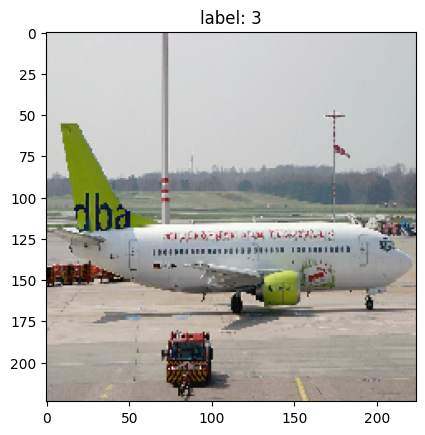

time: 10.8 s (started: 2024-03-02 14:05:29 +00:00)


In [ ]:
for image in test_aircraft_optimised.take(1):
  plt.imshow(image[0][0])
  # Convert one-hot encoding to labels
  decoded_labels = np.argmax(image[1])
  print(f'one-hot label: {image[1]}')
  plt.title(f'label: {decoded_labels}')

Calculate the test accuracy

In [ ]:
# Evaluate the model on the testing dataset
test_loss, test_accuracy = model_task2.evaluate(test_aircraft_optimised)

105/105 [==============================] - 442s 4s/step - loss: 1.7763 - accuracy: 0.5995
time: 7min 21s (started: 2024-03-02 14:14:09 +00:00)


In [ ]:
print(f'test_accuracy: {test_accuracy}')

test_accuracy: 0.5994599461555481
time: 1.59 ms (started: 2024-03-02 14:21:31 +00:00)


Calculate the precision, recall, F1 and confusion matrix

In [ ]:
predictions = model_task2.predict(test_aircraft_optimised)

105/105 [==============================] - 280s 3s/step
time: 4min 39s (started: 2024-03-02 14:35:02 +00:00)


In [ ]:
print(predictions.shape)

(3333, 100)
time: 1.94 ms (started: 2024-03-02 14:39:42 +00:00)


In [ ]:
# Convert predictions to class labels
predicted_labels = np.argmax(predictions, axis=1)

time: 2.78 ms (started: 2024-03-02 14:39:42 +00:00)


In [ ]:
print(predicted_labels)

[ 1  0 64 ... 86 86 89]
time: 2.92 ms (started: 2024-03-02 14:39:42 +00:00)


In [ ]:
# Convert labels from tf.data.Dataset to numpy array
true_labels_dataset = np.concatenate([y.numpy() for x, y in test_aircraft_optimised])

time: 218 ms (started: 2024-03-02 14:41:11 +00:00)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Convert one-hot encoded vectors to class labels
y_true_labels = [np.argmax(item) for item in true_labels_dataset]
y_pred_labels = [np.argmax(item) for item in predictions]

print(len(y_true_labels))
print(len(y_pred_labels))

# Calculate precision, recall, and F1 score
precision = precision_score(y_true_labels, y_pred_labels, average='weighted', zero_division=1)
recall = recall_score(y_true_labels, y_pred_labels, average='weighted')
f1 = f1_score(y_true_labels, y_pred_labels, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

3333
3333
Precision: 0.053547269944655806
Recall: 0.046804680468046804
F1 Score: 0.04714262997481669
time: 64.6 ms (started: 2024-03-02 14:58:52 +00:00)


In [ ]:
# true_labels = np.argmax(true_labels_dataset, axis=1)

time: 393 µs (started: 2024-03-02 14:54:41 +00:00)


In [ ]:
# print(true_labels)

time: 346 µs (started: 2024-03-02 14:54:41 +00:00)


In [ ]:
# from sklearn.metrics import confusion_matrix, classification_report

# # Calculate precision, recall, and F1 score
# classification_rep = classification_report(true_labels, predicted_labels)
# print('Classification Report:')
# print(classification_rep)

time: 372 µs (started: 2024-03-02 14:54:42 +00:00)


In [ ]:
# print(true_labels[:5])
# print(np.unique(true_labels))
# print(predicted_labels[:5])
# print(np.unique(predicted_labels))
# print(f'Same number of labels? {np.array_equal(np.unique(true_labels), np.unique(predicted_labels))}')

time: 368 µs (started: 2024-03-02 14:54:57 +00:00)


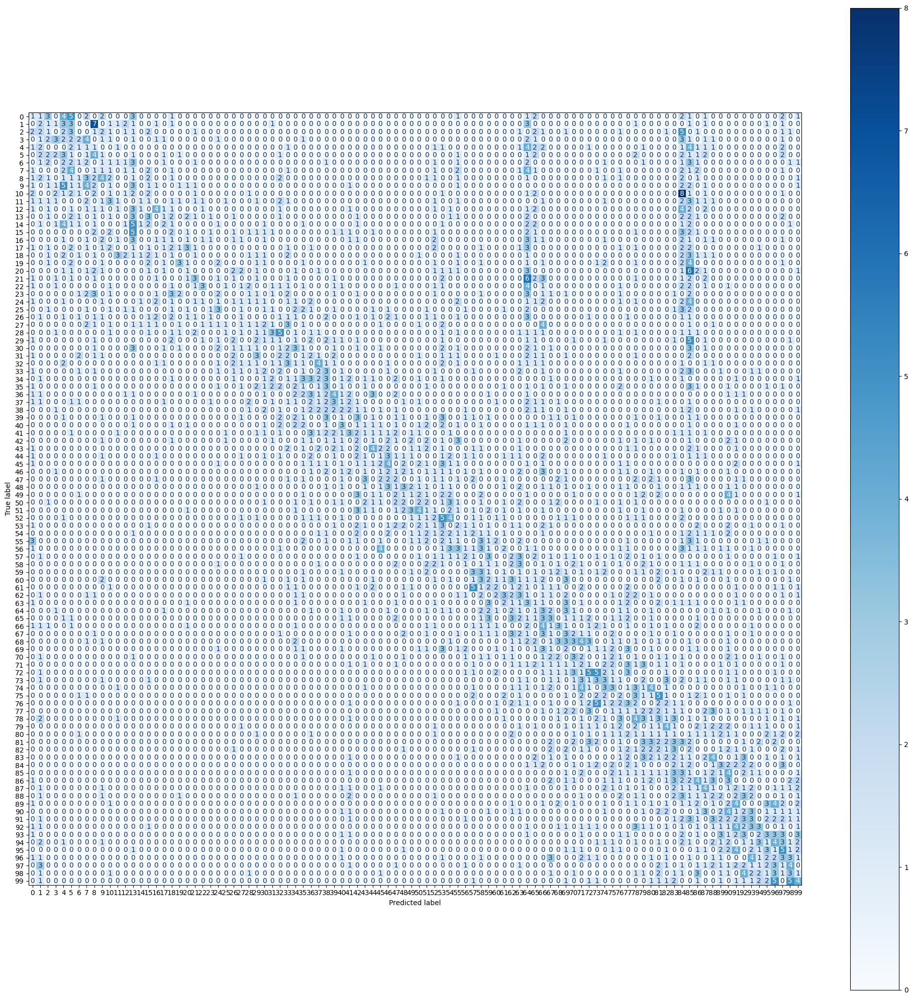

time: 39.4 s (started: 2024-03-02 17:29:48 +00:00)


In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Assuming you have already calculated the confusion matrix
# conf_matrix = confusion_matrix(true_labels, predicted_labels)
conf_matrix = confusion_matrix(y_true_labels, y_pred_labels)

# print(conf_matrix.shape)

# Plot confusion matrix using ConfusionMatrixDisplay
class_names = [str(i) for i in range(num_classes)]
# print(class_names)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)

# Display the plot
fig, ax = plt.subplots(figsize=(20, 20)) #plt.subplots(figsize=(10,10))
disp.plot(ax=ax, cmap=plt.cm.Blues, values_format="d")
fig.tight_layout(rect=[0, 0, 1, 1])
plt.show()

In [ ]:
print(conf_matrix)

[[1 1 3 ... 2 0 1]
 [0 2 1 ... 1 0 0]
 [2 2 1 ... 1 1 0]
 ...
 [0 3 0 ... 1 4 0]
 [0 1 0 ... 1 3 1]
 [0 1 0 ... 0 5 4]]
time: 6.73 ms (started: 2024-03-02 15:14:15 +00:00)


### Demo

## 3) Time-Series Model [30%]

### Data Preparation

In [ ]:
import pandas as pd

userlog_csv = pd.read_csv(userlog_csv_path+"UserLog.csv")

time: 18.9 s (started: 2024-03-04 05:42:59 +00:00)


View the userlog csv file

```
The file is a comma separated value (CSV) file with the following columns:

  * Date and time of the event

  * The event type – either LOGIN or LOGOUT

  * The cluster on which the event occurred

  * The duration – for a LOGIN this is the number of milli-seconds the user was logged in for, for a LOGOUT this is zero

  * The total number of users logged in at that point in time
```

In [ ]:
userlog_csv.head(10)

,Fri Jan 01 00:00:00 GMT 2010,LOGIN,FELL,1261840,1
0,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,10058927,2
1,Fri Jan 01 00:00:00 GMT 2010,LOGIN,SIDE,6868990,3
2,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,2997017,4
3,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,8919800,5
4,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,4426803,6
5,Fri Jan 01 00:21:01 GMT 2010,LOGOUT,FELL,0,5
6,Fri Jan 01 00:29:47 GMT 2010,LOGIN,PETH,2870110,6
7,Fri Jan 01 00:49:57 GMT 2010,LOGOUT,LAKE,0,5
8,Fri Jan 01 01:13:46 GMT 2010,LOGOUT,LAKE,0,4
9,Fri Jan 01 01:16:58 GMT 2010,LOGIN,LAKE,7732830,5


time: 37.9 ms (started: 2024-03-04 05:43:18 +00:00)


Insert column titles

In [ ]:
column_titles = ['date_and_time', 'event_type', 'cluster',
                 'duration_ms', 'number_of_users']


userlog_csv_with_titles = pd.read_csv(userlog_csv_path+"UserLog.csv",
                                      sep=',',
                                      names=column_titles)

time: 14.1 s (started: 2024-03-04 05:43:18 +00:00)


In [ ]:
userlog_csv_with_titles.head(10)

,date_and_time,event_type,cluster,duration_ms,number_of_users
0,Fri Jan 01 00:00:00 GMT 2010,LOGIN,FELL,1261840,1
1,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,10058927,2
2,Fri Jan 01 00:00:00 GMT 2010,LOGIN,SIDE,6868990,3
3,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,2997017,4
4,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,8919800,5
5,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,4426803,6
6,Fri Jan 01 00:21:01 GMT 2010,LOGOUT,FELL,0,5
7,Fri Jan 01 00:29:47 GMT 2010,LOGIN,PETH,2870110,6
8,Fri Jan 01 00:49:57 GMT 2010,LOGOUT,LAKE,0,5
9,Fri Jan 01 01:13:46 GMT 2010,LOGOUT,LAKE,0,4


time: 55.6 ms (started: 2024-03-04 05:43:32 +00:00)


Investigating the CSV file

View the different data types of columns

In [ ]:
userlog_csv_with_titles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2459638 entries, 0 to 2459637
Data columns (total 5 columns):
 #   Column           Dtype 
---  ------           ----- 
 0   date_and_time    object
 1   event_type       object
 2   cluster          object
 3   duration_ms      int64 
 4   number_of_users  int64 
dtypes: int64(2), object(3)
memory usage: 93.8+ MB
time: 55.7 ms (started: 2024-03-04 05:43:32 +00:00)


View how a row looks like

In [ ]:
userlog_csv_with_titles.loc[0]

date_and_time      Fri Jan 01 00:00:00 GMT 2010
event_type                                LOGIN
cluster                                    FELL
duration_ms                             1261840
number_of_users                               1
Name: 0, dtype: object

time: 16.4 ms (started: 2024-03-04 05:43:32 +00:00)


See what type of object is `'data_and_time'`, `'event_type'` and `'cluster'`

In [ ]:
userlog_csv_with_titles['date_and_time'].apply(type)

0          <class 'str'>
1          <class 'str'>
2          <class 'str'>
3          <class 'str'>
4          <class 'str'>
               ...      
2459633    <class 'str'>
2459634    <class 'str'>
2459635    <class 'str'>
2459636    <class 'str'>
2459637    <class 'str'>
Name: date_and_time, Length: 2459638, dtype: object

time: 846 ms (started: 2024-03-04 05:43:32 +00:00)


In [ ]:
userlog_csv_with_titles['event_type'].apply(type)

0          <class 'str'>
1          <class 'str'>
2          <class 'str'>
3          <class 'str'>
4          <class 'str'>
               ...      
2459633    <class 'str'>
2459634    <class 'str'>
2459635    <class 'str'>
2459636    <class 'str'>
2459637    <class 'str'>
Name: event_type, Length: 2459638, dtype: object

time: 1.2 s (started: 2024-03-04 05:43:33 +00:00)


In [ ]:
userlog_csv_with_titles['cluster'].apply(type)

0          <class 'str'>
1          <class 'str'>
2          <class 'str'>
3          <class 'str'>
4          <class 'str'>
               ...      
2459633    <class 'str'>
2459634    <class 'str'>
2459635    <class 'str'>
2459636    <class 'str'>
2459637    <class 'str'>
Name: cluster, Length: 2459638, dtype: object

time: 882 ms (started: 2024-03-04 05:43:34 +00:00)


Find the range of each columns (beside `'data_and_time'`, `'event_type'` and `'cluster'` because there are in string object):

`'duration_ms'`

In [ ]:
print('min: {}'.format(userlog_csv_with_titles['duration_ms'].min()))
print('max: {}'.format(userlog_csv_with_titles['duration_ms'].max()))

min: 0
max: 1329521914
time: 26.6 ms (started: 2024-03-04 05:43:35 +00:00)


`'number_of_users'`

In [ ]:
print('min: {}'.format(userlog_csv_with_titles['number_of_users'].min()))
print('max: {}'.format(userlog_csv_with_titles['number_of_users'].max()))

min: 0
max: 1024
time: 33.3 ms (started: 2024-03-04 05:43:35 +00:00)


Check the unique values of `'event_type'` and `'cluster'`

In [ ]:
print('length: {}'.format(len(userlog_csv_with_titles['event_type'].unique())))
print(userlog_csv_with_titles['event_type'].unique())

length: 2
[' LOGIN' ' LOGOUT']
time: 945 ms (started: 2024-03-04 05:43:35 +00:00)


In [ ]:
print('length: {}'.format(len(userlog_csv_with_titles['cluster'].unique())))
print(userlog_csv_with_titles['cluster'].unique())

length: 37
['  FELL' '  LAKE' '  SIDE' '  PETH' '  WEAR' '  TYNE' '  TARN' '  BECK'
 '  TEES' '  DENE' '  LINN' '  ISAAC' '  PARK' '  BRAE' '  FAYOL' '  LOCH'
 '  BANK' '  BRIG' '  ELDON' '  POOL' '  TREE' '  POND' '  CHART'
 '  NAIAD' '  LAWN' '  ORACLE' '  TURF' '  GILL' '  GATE' '  YARD'
 '  WOOD' '  NEREID' '  MOSS' '  NIDD' '  HULL' '  GLOBE' '  BARN']
time: 881 ms (started: 2024-03-04 05:43:36 +00:00)


### Dummy: Data Preprocessing

Handle `'BST'` timezone

In [ ]:
from datetime import datetime, timedelta
import pytz

def handle_bst(date_string_list):
  '''Convert BST to GMT'''
  datetime_list = []

  for date_string in tqdm(date_string_list):
    if 'BST' in date_string:
      # Replace 'BST' with 'GMT'
      bst_to_gmt_string = date_string.replace('BST', 'GMT')
      bst_to_gmt = datetime.strptime(bst_to_gmt_string, '%a %b %d %H:%M:%S %Z %Y')

      # 'BST' to 'GMT' is an hour difference
      bst_to_gmt = pytz.timezone('GMT').localize(bst_to_gmt) - timedelta(hours=1)
      datetime_list.append(bst_to_gmt)
    else:
      gmt = datetime.strptime(date_string, '%a %b %d %H:%M:%S %Z %Y')
      gmt = pytz.timezone('GMT').localize(gmt)
      datetime_list.append(gmt)

  return datetime_list


time: 1.19 ms (started: 2024-03-02 13:24:09 +00:00)


Check if the preprocessing is working as intended with a dummy dataframe `userlog_csv_experiment`

In [ ]:
userlog_csv_experiment = userlog_csv_with_titles.copy()

time: 188 ms (started: 2024-02-27 17:25:46 +00:00)


In [ ]:
userlog_csv_experiment['converted_datetime'] = handle_bst(userlog_csv_experiment['date_and_time'].values)

  0%|          | 0/2459638 [00:00<?, ?it/s]

time: 1min 29s (started: 2024-02-27 17:25:46 +00:00)


In [ ]:
userlog_csv_experiment.head(10)

,date_and_time,event_type,cluster,duration_ms,number_of_users,converted_datetime
0,Fri Jan 01 00:00:00 GMT 2010,LOGIN,FELL,1261840,1,2010-01-01 00:00:00+00:00
1,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,10058927,2,2010-01-01 00:00:00+00:00
2,Fri Jan 01 00:00:00 GMT 2010,LOGIN,SIDE,6868990,3,2010-01-01 00:00:00+00:00
3,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,2997017,4,2010-01-01 00:00:00+00:00
4,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,8919800,5,2010-01-01 00:00:00+00:00
5,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,4426803,6,2010-01-01 00:00:00+00:00
6,Fri Jan 01 00:21:01 GMT 2010,LOGOUT,FELL,0,5,2010-01-01 00:21:01+00:00
7,Fri Jan 01 00:29:47 GMT 2010,LOGIN,PETH,2870110,6,2010-01-01 00:29:47+00:00
8,Fri Jan 01 00:49:57 GMT 2010,LOGOUT,LAKE,0,5,2010-01-01 00:49:57+00:00
9,Fri Jan 01 01:13:46 GMT 2010,LOGOUT,LAKE,0,4,2010-01-01 01:13:46+00:00


time: 17 ms (started: 2024-02-27 17:27:16 +00:00)


In [ ]:
userlog_csv_experiment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2459638 entries, 0 to 2459637
Data columns (total 6 columns):
 #   Column              Dtype              
---  ------              -----              
 0   date_and_time       object             
 1   event_type          object             
 2   cluster             object             
 3   duration_ms         int64              
 4   number_of_users     int64              
 5   converted_datetime  datetime64[ns, GMT]
dtypes: datetime64[ns, GMT](1), int64(2), object(3)
memory usage: 112.6+ MB
time: 9.95 ms (started: 2024-02-27 17:27:16 +00:00)


Convert `datetime` object to `unix timestamp`

In [ ]:
# Convert 'date_and_time' column to Unix timestamp
userlog_csv_experiment['unix_timestamp'] = userlog_csv_experiment['converted_datetime'].apply(lambda x: x.timestamp()).astype(np.uint64)

userlog_csv_experiment.head()

,date_and_time,event_type,cluster,duration_ms,number_of_users,converted_datetime,unix_timestamp
0,Fri Jan 01 00:00:00 GMT 2010,LOGIN,FELL,1261840,1,2010-01-01 00:00:00+00:00,1262304000
1,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,10058927,2,2010-01-01 00:00:00+00:00,1262304000
2,Fri Jan 01 00:00:00 GMT 2010,LOGIN,SIDE,6868990,3,2010-01-01 00:00:00+00:00,1262304000
3,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,2997017,4,2010-01-01 00:00:00+00:00,1262304000
4,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,8919800,5,2010-01-01 00:00:00+00:00,1262304000


time: 16.4 s (started: 2024-02-27 17:30:05 +00:00)


Check if the `unix_timestamp` generated values are correct

In [ ]:
print(userlog_csv_experiment['unix_timestamp'].iloc[0])

1262304000
time: 1.27 ms (started: 2024-02-27 17:30:44 +00:00)


In [ ]:
print(userlog_csv_experiment['unix_timestamp'].iloc[int(0.5 * len(userlog_csv_experiment))])
print(userlog_csv_experiment['converted_datetime'].iloc[int(0.5 * len(userlog_csv_experiment))])
print(userlog_csv_experiment['date_and_time'].iloc[int(0.5 * len(userlog_csv_experiment))])

1275410752
2010-06-01 16:45:52+00:00
Tue Jun 01 17:45:52 BST 2010
time: 5.22 ms (started: 2024-02-27 17:30:44 +00:00)


To convert `unix timestamp` to GMT `datetime` object

In [ ]:
from datetime import timezone

# Function to convert Unix timestamp to the desired format in GMT
def convert_unix_to_datetime_gmt(unix_timestamp):
    # Convert Unix timestamp to a datetime object in UTC
    datetime_utc = datetime.utcfromtimestamp(unix_timestamp).replace(tzinfo=timezone.utc)

    # Format the datetime object as a string with 'GMT'
    result_string = datetime_utc.strftime('%a %b %d %H:%M:%S GMT %Y')

    return result_string

# Apply the function to create a new 'formatted_datetime_gmt' column
userlog_csv_experiment['formatted_datetime_gmt'] = userlog_csv_experiment['unix_timestamp'].apply(convert_unix_to_datetime_gmt)


time: 14.2 s (started: 2024-02-27 17:30:44 +00:00)


In [ ]:
userlog_csv_experiment.head(10)

,date_and_time,event_type,cluster,duration_ms,number_of_users,converted_datetime,unix_timestamp,formatted_datetime_gmt
0,Fri Jan 01 00:00:00 GMT 2010,LOGIN,FELL,1261840,1,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010
1,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,10058927,2,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010
2,Fri Jan 01 00:00:00 GMT 2010,LOGIN,SIDE,6868990,3,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010
3,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,2997017,4,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010
4,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,8919800,5,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010
5,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,4426803,6,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010
6,Fri Jan 01 00:21:01 GMT 2010,LOGOUT,FELL,0,5,2010-01-01 00:21:01+00:00,1262305261,Fri Jan 01 00:21:01 GMT 2010
7,Fri Jan 01 00:29:47 GMT 2010,LOGIN,PETH,2870110,6,2010-01-01 00:29:47+00:00,1262305787,Fri Jan 01 00:29:47 GMT 2010
8,Fri Jan 01 00:49:57 GMT 2010,LOGOUT,LAKE,0,5,2010-01-01 00:49:57+00:00,1262306997,Fri Jan 01 00:49:57 GMT 2010
9,Fri Jan 01 01:13:46 GMT 2010,LOGOUT,LAKE,0,4,2010-01-01 01:13:46+00:00,1262308426,Fri Jan 01 01:13:46 GMT 2010


time: 31.5 ms (started: 2024-02-27 17:30:58 +00:00)


In [ ]:
userlog_csv_experiment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2459638 entries, 0 to 2459637
Data columns (total 8 columns):
 #   Column                  Dtype              
---  ------                  -----              
 0   date_and_time           object             
 1   event_type              object             
 2   cluster                 object             
 3   duration_ms             int64              
 4   number_of_users         int64              
 5   converted_datetime      datetime64[ns, GMT]
 6   unix_timestamp          uint64             
 7   formatted_datetime_gmt  object             
dtypes: datetime64[ns, GMT](1), int64(2), object(4), uint64(1)
memory usage: 150.1+ MB
time: 21.7 ms (started: 2024-02-27 17:30:58 +00:00)


Check if the `convert_unix_to_datetime_gmt` has converted `unix_timestamp` back to GMT `date_and_time` format (even compared to the original BST time) correctly

In [ ]:
print(userlog_csv_experiment['unix_timestamp'].iloc[int(0.5 * len(userlog_csv_experiment))])
print(userlog_csv_experiment['converted_datetime'].iloc[int(0.5 * len(userlog_csv_experiment))])
print(userlog_csv_experiment['formatted_datetime_gmt'].iloc[int(0.5 * len(userlog_csv_experiment))])
print(userlog_csv_experiment['date_and_time'].iloc[int(0.5 * len(userlog_csv_experiment))])

1275410752
2010-06-01 16:45:52+00:00
Tue Jun 01 16:45:52 GMT 2010
Tue Jun 01 17:45:52 BST 2010
time: 2.29 ms (started: 2024-02-27 17:30:58 +00:00)


Convert `'event_type'` and `'cluster'` columns into encodings

In [ ]:
print(userlog_csv_experiment[['event_type', 'cluster']].iloc[:10])

  event_type cluster
0      LOGIN    FELL
1      LOGIN    LAKE
2      LOGIN    SIDE
3      LOGIN    LAKE
4      LOGIN    LAKE
5      LOGIN    LAKE
6     LOGOUT    FELL
7      LOGIN    PETH
8     LOGOUT    LAKE
9     LOGOUT    LAKE
time: 699 ms (started: 2024-02-27 17:30:58 +00:00)


In [ ]:
print(userlog_csv_experiment['event_type'].unique())

[' LOGIN' ' LOGOUT']
time: 152 ms (started: 2024-02-27 17:30:59 +00:00)


In [ ]:
# Create a mapping dictionary (STRING VALUES STARTS WITH A SPACE FOR SOME REASON, SPENT 2 HOURS ON THIS)
event_type_mapping = {' LOGIN': 1, ' LOGOUT': 0}

# Fit and transform categorical columns
userlog_csv_experiment['encoded_event_type'] = userlog_csv_experiment['event_type'].map(event_type_mapping)

time: 190 ms (started: 2024-02-27 17:30:59 +00:00)


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoders
# label_encoder_event_type = LabelEncoder()
label_encoder_cluster = LabelEncoder()

# Fit and transform categorical columns
# userlog_csv_experiment['encoded_event_type'] = label_encoder_event_type.fit_transform(userlog_csv_experiment['event_type'])
userlog_csv_experiment['encoded_cluster'] = label_encoder_cluster.fit_transform(userlog_csv_experiment['cluster'])

time: 442 ms (started: 2024-02-27 17:30:59 +00:00)


In [ ]:
print(userlog_csv_experiment[['encoded_event_type', 'encoded_cluster']].iloc[:10])

   encoded_event_type  encoded_cluster
0                   1                9
1                   1               15
2                   1               28
3                   1               15
4                   1               15
5                   1               15
6                   0                9
7                   1               25
8                   0               15
9                   0               15
time: 88.7 ms (started: 2024-02-27 17:31:00 +00:00)


In [ ]:
print('length: {}'.format(len(userlog_csv_experiment['encoded_event_type'].unique())))
print(userlog_csv_experiment['encoded_event_type'].unique())
print('length: {}'.format(len(userlog_csv_experiment['encoded_cluster'].unique())))
print(userlog_csv_experiment['encoded_cluster'].unique())

length: 2
[1 0]
length: 37
[ 9 15 28 25 34 33 29  2 30  6 17 14 24  3  8 18  0  4  7 27 31 26  5 20
 16 23 32 11 10 36 35 21 19 22 13 12  1]
time: 76.7 ms (started: 2024-02-27 17:31:00 +00:00)


In [ ]:
userlog_csv_experiment.head(10)

,date_and_time,event_type,cluster,duration_ms,number_of_users,converted_datetime,unix_timestamp,formatted_datetime_gmt,encoded_event_type,encoded_cluster
0,Fri Jan 01 00:00:00 GMT 2010,LOGIN,FELL,1261840,1,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,9
1,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,10058927,2,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15
2,Fri Jan 01 00:00:00 GMT 2010,LOGIN,SIDE,6868990,3,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,28
3,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,2997017,4,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15
4,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,8919800,5,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15
5,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,4426803,6,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15
6,Fri Jan 01 00:21:01 GMT 2010,LOGOUT,FELL,0,5,2010-01-01 00:21:01+00:00,1262305261,Fri Jan 01 00:21:01 GMT 2010,0,9
7,Fri Jan 01 00:29:47 GMT 2010,LOGIN,PETH,2870110,6,2010-01-01 00:29:47+00:00,1262305787,Fri Jan 01 00:29:47 GMT 2010,1,25
8,Fri Jan 01 00:49:57 GMT 2010,LOGOUT,LAKE,0,5,2010-01-01 00:49:57+00:00,1262306997,Fri Jan 01 00:49:57 GMT 2010,0,15
9,Fri Jan 01 01:13:46 GMT 2010,LOGOUT,LAKE,0,4,2010-01-01 01:13:46+00:00,1262308426,Fri Jan 01 01:13:46 GMT 2010,0,15


time: 12.4 ms (started: 2024-02-27 17:31:00 +00:00)


In [ ]:
userlog_csv_experiment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2459638 entries, 0 to 2459637
Data columns (total 10 columns):
 #   Column                  Dtype              
---  ------                  -----              
 0   date_and_time           object             
 1   event_type              object             
 2   cluster                 object             
 3   duration_ms             int64              
 4   number_of_users         int64              
 5   converted_datetime      datetime64[ns, GMT]
 6   unix_timestamp          uint64             
 7   formatted_datetime_gmt  object             
 8   encoded_event_type      int64              
 9   encoded_cluster         int64              
dtypes: datetime64[ns, GMT](1), int64(4), object(4), uint64(1)
memory usage: 187.7+ MB
time: 11.8 ms (started: 2024-02-27 17:31:00 +00:00)


Check if `'encoded_cluster'` is labelled correctly using `LabelEncoder()`

In [ ]:
# Fit and transform categorical columns
userlog_csv_experiment['back_to_cluster'] = label_encoder_cluster.inverse_transform(userlog_csv_experiment['encoded_cluster'])

time: 153 ms (started: 2024-02-27 17:31:00 +00:00)


In [ ]:
# original 'cluster' column
cluster = userlog_csv_experiment['cluster'].unique()
print('length: {}'.format(len(cluster)))
print(cluster)

# converted 'back_to_cluster' column
back_to_cluster = userlog_csv_experiment['back_to_cluster'].unique()
print('length: {}'.format(len(back_to_cluster)))
print(back_to_cluster)

print(f'Are they the same? {np.array_equal(cluster, back_to_cluster)}')

length: 37
['  FELL' '  LAKE' '  SIDE' '  PETH' '  WEAR' '  TYNE' '  TARN' '  BECK'
 '  TEES' '  DENE' '  LINN' '  ISAAC' '  PARK' '  BRAE' '  FAYOL' '  LOCH'
 '  BANK' '  BRIG' '  ELDON' '  POOL' '  TREE' '  POND' '  CHART'
 '  NAIAD' '  LAWN' '  ORACLE' '  TURF' '  GILL' '  GATE' '  YARD'
 '  WOOD' '  NEREID' '  MOSS' '  NIDD' '  HULL' '  GLOBE' '  BARN']
length: 37
['  FELL' '  LAKE' '  SIDE' '  PETH' '  WEAR' '  TYNE' '  TARN' '  BECK'
 '  TEES' '  DENE' '  LINN' '  ISAAC' '  PARK' '  BRAE' '  FAYOL' '  LOCH'
 '  BANK' '  BRIG' '  ELDON' '  POOL' '  TREE' '  POND' '  CHART'
 '  NAIAD' '  LAWN' '  ORACLE' '  TURF' '  GILL' '  GATE' '  YARD'
 '  WOOD' '  NEREID' '  MOSS' '  NIDD' '  HULL' '  GLOBE' '  BARN']
Are they the same? True
time: 284 ms (started: 2024-02-27 17:31:00 +00:00)


In [ ]:
userlog_csv_experiment.head(10)

,date_and_time,event_type,cluster,duration_ms,number_of_users,converted_datetime,unix_timestamp,formatted_datetime_gmt,encoded_event_type,encoded_cluster,back_to_cluster
0,Fri Jan 01 00:00:00 GMT 2010,LOGIN,FELL,1261840,1,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,9,FELL
1,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,10058927,2,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15,LAKE
2,Fri Jan 01 00:00:00 GMT 2010,LOGIN,SIDE,6868990,3,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,28,SIDE
3,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,2997017,4,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15,LAKE
4,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,8919800,5,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15,LAKE
5,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,4426803,6,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15,LAKE
6,Fri Jan 01 00:21:01 GMT 2010,LOGOUT,FELL,0,5,2010-01-01 00:21:01+00:00,1262305261,Fri Jan 01 00:21:01 GMT 2010,0,9,FELL
7,Fri Jan 01 00:29:47 GMT 2010,LOGIN,PETH,2870110,6,2010-01-01 00:29:47+00:00,1262305787,Fri Jan 01 00:29:47 GMT 2010,1,25,PETH
8,Fri Jan 01 00:49:57 GMT 2010,LOGOUT,LAKE,0,5,2010-01-01 00:49:57+00:00,1262306997,Fri Jan 01 00:49:57 GMT 2010,0,15,LAKE
9,Fri Jan 01 01:13:46 GMT 2010,LOGOUT,LAKE,0,4,2010-01-01 01:13:46+00:00,1262308426,Fri Jan 01 01:13:46 GMT 2010,0,15,LAKE


time: 16.5 ms (started: 2024-02-27 17:31:01 +00:00)


In [ ]:
userlog_csv_experiment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2459638 entries, 0 to 2459637
Data columns (total 11 columns):
 #   Column                  Dtype              
---  ------                  -----              
 0   date_and_time           object             
 1   event_type              object             
 2   cluster                 object             
 3   duration_ms             int64              
 4   number_of_users         int64              
 5   converted_datetime      datetime64[ns, GMT]
 6   unix_timestamp          uint64             
 7   formatted_datetime_gmt  object             
 8   encoded_event_type      int64              
 9   encoded_cluster         int64              
 10  back_to_cluster         object             
dtypes: datetime64[ns, GMT](1), int64(4), object(5), uint64(1)
memory usage: 206.4+ MB
time: 7.41 ms (started: 2024-02-27 17:31:01 +00:00)


Normalise `'duration_ms'` to a scale 0 to 1

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Assuming you have a DataFrame 'df' with a column 'duration_ms'
# Extract the 'duration_ms' column as a Numpy array
duration_ms_values = userlog_csv_experiment['duration_ms'].values.reshape(-1, 1)

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the data
normalised_duration_ms = scaler.fit_transform(duration_ms_values)

# Update the DataFrame with the normalised values
userlog_csv_experiment['normalised_duration_ms'] = normalised_duration_ms

time: 35.5 ms (started: 2024-02-27 17:31:01 +00:00)


In [ ]:
userlog_csv_experiment.head(10)

,date_and_time,event_type,cluster,duration_ms,number_of_users,converted_datetime,unix_timestamp,formatted_datetime_gmt,encoded_event_type,encoded_cluster,back_to_cluster,normalised_duration_ms
0,Fri Jan 01 00:00:00 GMT 2010,LOGIN,FELL,1261840,1,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,9,FELL,0.000949
1,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,10058927,2,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15,LAKE,0.007566
2,Fri Jan 01 00:00:00 GMT 2010,LOGIN,SIDE,6868990,3,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,28,SIDE,0.005167
3,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,2997017,4,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15,LAKE,0.002254
4,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,8919800,5,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15,LAKE,0.006709
5,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,4426803,6,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15,LAKE,0.003330
6,Fri Jan 01 00:21:01 GMT 2010,LOGOUT,FELL,0,5,2010-01-01 00:21:01+00:00,1262305261,Fri Jan 01 00:21:01 GMT 2010,0,9,FELL,0.000000
7,Fri Jan 01 00:29:47 GMT 2010,LOGIN,PETH,2870110,6,2010-01-01 00:29:47+00:00,1262305787,Fri Jan 01 00:29:47 GMT 2010,1,25,PETH,0.002159
8,Fri Jan 01 00:49:57 GMT 2010,LOGOUT,LAKE,0,5,2010-01-01 00:49:57+00:00,1262306997,Fri Jan 01 00:49:57 GMT 2010,0,15,LAKE,0.000000
9,Fri Jan 01 01:13:46 GMT 2010,LOGOUT,LAKE,0,4,2010-01-01 01:13:46+00:00,1262308426,Fri Jan 01 01:13:46 GMT 2010,0,15,LAKE,0.000000


time: 15 ms (started: 2024-02-27 17:31:01 +00:00)


In [ ]:
userlog_csv_experiment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2459638 entries, 0 to 2459637
Data columns (total 12 columns):
 #   Column                  Dtype              
---  ------                  -----              
 0   date_and_time           object             
 1   event_type              object             
 2   cluster                 object             
 3   duration_ms             int64              
 4   number_of_users         int64              
 5   converted_datetime      datetime64[ns, GMT]
 6   unix_timestamp          uint64             
 7   formatted_datetime_gmt  object             
 8   encoded_event_type      int64              
 9   encoded_cluster         int64              
 10  back_to_cluster         object             
 11  normalised_duration_ms  float64            
dtypes: datetime64[ns, GMT](1), float64(1), int64(4), object(5), uint64(1)
memory usage: 225.2+ MB
time: 10.4 ms (started: 2024-02-27 17:31:01 +00:00)


In [ ]:
# Assuming you have a DataFrame 'df' with a column 'duration_ms'
# Extract the 'duration_ms' column as a Numpy array
normalised_duration_ms_values = userlog_csv_experiment['normalised_duration_ms'].values.reshape(-1, 1)

# Fit and transform the data
back_to_duration_ms = scaler.inverse_transform(normalised_duration_ms_values)

# Update the DataFrame with the normalised values
userlog_csv_experiment['back_to_duration_ms'] = back_to_duration_ms.astype(np.int64)

time: 29 ms (started: 2024-02-27 17:31:01 +00:00)


In [ ]:
userlog_csv_experiment.head(10)

,date_and_time,event_type,cluster,duration_ms,number_of_users,converted_datetime,unix_timestamp,formatted_datetime_gmt,encoded_event_type,encoded_cluster,back_to_cluster,normalised_duration_ms,back_to_duration_ms
0,Fri Jan 01 00:00:00 GMT 2010,LOGIN,FELL,1261840,1,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,9,FELL,0.000949,1261840
1,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,10058927,2,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15,LAKE,0.007566,10058927
2,Fri Jan 01 00:00:00 GMT 2010,LOGIN,SIDE,6868990,3,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,28,SIDE,0.005167,6868990
3,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,2997017,4,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15,LAKE,0.002254,2997017
4,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,8919800,5,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15,LAKE,0.006709,8919800
5,Fri Jan 01 00:00:00 GMT 2010,LOGIN,LAKE,4426803,6,2010-01-01 00:00:00+00:00,1262304000,Fri Jan 01 00:00:00 GMT 2010,1,15,LAKE,0.003330,4426803
6,Fri Jan 01 00:21:01 GMT 2010,LOGOUT,FELL,0,5,2010-01-01 00:21:01+00:00,1262305261,Fri Jan 01 00:21:01 GMT 2010,0,9,FELL,0.000000,0
7,Fri Jan 01 00:29:47 GMT 2010,LOGIN,PETH,2870110,6,2010-01-01 00:29:47+00:00,1262305787,Fri Jan 01 00:29:47 GMT 2010,1,25,PETH,0.002159,2870109
8,Fri Jan 01 00:49:57 GMT 2010,LOGOUT,LAKE,0,5,2010-01-01 00:49:57+00:00,1262306997,Fri Jan 01 00:49:57 GMT 2010,0,15,LAKE,0.000000,0
9,Fri Jan 01 01:13:46 GMT 2010,LOGOUT,LAKE,0,4,2010-01-01 01:13:46+00:00,1262308426,Fri Jan 01 01:13:46 GMT 2010,0,15,LAKE,0.000000,0


time: 18.1 ms (started: 2024-02-27 17:31:01 +00:00)


In [ ]:
userlog_csv_experiment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2459638 entries, 0 to 2459637
Data columns (total 13 columns):
 #   Column                  Dtype              
---  ------                  -----              
 0   date_and_time           object             
 1   event_type              object             
 2   cluster                 object             
 3   duration_ms             int64              
 4   number_of_users         int64              
 5   converted_datetime      datetime64[ns, GMT]
 6   unix_timestamp          uint64             
 7   formatted_datetime_gmt  object             
 8   encoded_event_type      int64              
 9   encoded_cluster         int64              
 10  back_to_cluster         object             
 11  normalised_duration_ms  float64            
 12  back_to_duration_ms     int64              
dtypes: datetime64[ns, GMT](1), float64(1), int64(5), object(5), uint64(1)
memory usage: 244.0+ MB
time: 11.8 ms (started: 2024-02-27 17:31:01 +00:00)


### Data Preprocessing

Actual preprocessing

In [ ]:
from datetime import datetime, timedelta
import pytz

def handle_bst(date_string_list):
  '''Convert BST to GMT'''
  datetime_list = []

  for date_string in tqdm(date_string_list):
    if 'BST' in date_string:
      # Replace 'BST' with 'GMT'
      bst_to_gmt_string = date_string.replace('BST', 'GMT')
      bst_to_gmt = datetime.strptime(bst_to_gmt_string, '%a %b %d %H:%M:%S %Z %Y')

      # 'BST' to 'GMT' is an hour difference
      bst_to_gmt = pytz.timezone('GMT').localize(bst_to_gmt) - timedelta(hours=1)
      datetime_list.append(bst_to_gmt)
    else:
      gmt = datetime.strptime(date_string, '%a %b %d %H:%M:%S %Z %Y')
      gmt = pytz.timezone('GMT').localize(gmt)
      datetime_list.append(gmt)

  return datetime_list

time: 1.18 ms (started: 2024-03-04 05:43:37 +00:00)


In [ ]:
userlog_csv_preprocessed = userlog_csv_with_titles.copy()

time: 262 ms (started: 2024-03-04 05:43:37 +00:00)


Handle BST time

In [ ]:
userlog_csv_preprocessed['date_and_time'] = handle_bst(userlog_csv_preprocessed['date_and_time'].values)

  0%|          | 0/2459638 [00:00<?, ?it/s]

time: 1min 48s (started: 2024-03-04 05:43:37 +00:00)


Convert `'date_and_time'` `datetime` object into `unix_timestamp`

In [ ]:
# Convert 'date_and_time' column to Unix timestamp
userlog_csv_preprocessed['date_and_time'] = userlog_csv_preprocessed['date_and_time'].apply(lambda x: x.timestamp()).astype(np.uint64)

time: 9.45 s (started: 2024-03-04 05:45:25 +00:00)


Encode `'event_type'` and `'cluster'`

In [ ]:
# Create a mapping dictionary (STRING VALUES STARTS WITH A SPACE FOR SOME REASON, SPENT 2 HOURS ON THIS)
event_type_mapping = {' LOGIN': 1, ' LOGOUT': 0}

# Fit and transform categorical columns
userlog_csv_preprocessed['event_type'] = userlog_csv_preprocessed['event_type'].map(event_type_mapping)

time: 308 ms (started: 2024-03-04 05:45:35 +00:00)


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialise LabelEncoders
label_encoder_cluster = LabelEncoder()

# Fit and transform categorical columns
userlog_csv_preprocessed['cluster'] = label_encoder_cluster.fit_transform(userlog_csv_preprocessed['cluster'])

time: 1.47 s (started: 2024-03-04 05:45:35 +00:00)


Normalise `'duration_ms'` to scale of 0 to 1

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Assuming you have a DataFrame 'df' with a column 'duration_ms'
# Extract the 'duration_ms' column as a Numpy array
duration_ms_values = userlog_csv_preprocessed['duration_ms'].values.reshape(-1, 1)

# Initialise the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the data
normalised_duration_ms = scaler.fit_transform(duration_ms_values)

# Update the DataFrame with the normalised values
userlog_csv_preprocessed['duration_ms'] = normalised_duration_ms

time: 54.8 ms (started: 2024-03-04 05:45:37 +00:00)


Create a column for `'time_interval'` to avoid LSTM predicting `'date_and_time'` from the past

In [ ]:
# Calculate intervals
userlog_csv_preprocessed['time_interval'] = userlog_csv_preprocessed['date_and_time'].diff()

time: 39.7 ms (started: 2024-03-04 05:45:37 +00:00)


Replace `NaN` value created when creating `'time_interval'`

In [ ]:
print(userlog_csv_preprocessed.isna().any())

date_and_time      False
event_type         False
cluster            False
duration_ms        False
number_of_users    False
time_interval       True
dtype: bool
time: 26.1 ms (started: 2024-03-04 05:45:37 +00:00)


In [ ]:
userlog_csv_preprocessed['time_interval'].fillna(0, inplace=True)

time: 14.8 ms (started: 2024-03-04 05:45:37 +00:00)


In [ ]:
print(userlog_csv_preprocessed.isna().any())

date_and_time      False
event_type         False
cluster            False
duration_ms        False
number_of_users    False
time_interval      False
dtype: bool
time: 18.1 ms (started: 2024-03-04 05:45:37 +00:00)


In [ ]:
userlog_csv_preprocessed['time_interval'] = userlog_csv_preprocessed['time_interval'].astype(np.uint64)

time: 29.4 ms (started: 2024-03-04 05:45:37 +00:00)


In [ ]:
userlog_csv_preprocessed.head(10)

,date_and_time,event_type,cluster,duration_ms,number_of_users,time_interval
0,1262304000,1,9,0.000949,1,0
1,1262304000,1,15,0.007566,2,0
2,1262304000,1,28,0.005167,3,0
3,1262304000,1,15,0.002254,4,0
4,1262304000,1,15,0.006709,5,0
5,1262304000,1,15,0.003330,6,0
6,1262305261,0,9,0.000000,5,1261
7,1262305787,1,25,0.002159,6,526
8,1262306997,0,15,0.000000,5,1210
9,1262308426,0,15,0.000000,4,1429


time: 13 ms (started: 2024-03-04 05:45:37 +00:00)


In [ ]:
userlog_csv_preprocessed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2459638 entries, 0 to 2459637
Data columns (total 6 columns):
 #   Column           Dtype  
---  ------           -----  
 0   date_and_time    uint64 
 1   event_type       int64  
 2   cluster          int64  
 3   duration_ms      float64
 4   number_of_users  int64  
 5   time_interval    uint64 
dtypes: float64(1), int64(3), uint64(2)
memory usage: 112.6 MB
time: 12.9 ms (started: 2024-03-04 05:45:37 +00:00)


### Experimentations (SKIP FOR MARKING)

**Attempt 1**

In [ ]:
from sklearn.model_selection import train_test_split

# Create sequences and targets
sequence_length = 10  # Adjust according to your dataset
target_sequence_length = 100  # Number of datetimes to predict
data = userlog_csv_preprocessed['date_and_time'].values

# Create a tf.data.Dataset from the data
dataset = tf.data.Dataset.from_tensor_slices(data)

# Define a function to create sequences and targets
def create_sequence_target_pairs(item):
    sequence = item[:sequence_length]
    target = item[sequence_length:sequence_length+target_sequence_length]
    return sequence, target

# Apply the function to create sequence-target pairs
sequences_targets_dataset = dataset.window(size=sequence_length+target_sequence_length, shift=1, drop_remainder=True)
sequences_targets_dataset = sequences_targets_dataset.flat_map(lambda window: window.batch(sequence_length+target_sequence_length))
sequences_targets_dataset = sequences_targets_dataset.map(create_sequence_target_pairs)

# Split the data into training and testing sets
train_size = int(0.8 * sequences_targets_dataset.cardinality().numpy())
train_dataset_ = sequences_targets_dataset.take(train_size)
test_dataset_ = sequences_targets_dataset.skip(train_size)

print(type(train_dataset_))
print(type(test_dataset_))

# Define the model (same as in the previous examples)
model = tf.keras.Sequential([
    tf.keras.layers.LSTM(50, activation='relu', input_shape=(sequence_length, 1)),
    tf.keras.layers.RepeatVector(target_sequence_length),
    tf.keras.layers.LSTM(50, activation='relu', return_sequences=True),
    tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(1))
])

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Function to preprocess dataset for training
def preprocess(dataset):
    sequences = dataset.map(lambda x, y: x)
    targets = dataset.map(lambda x, y: y)
    sequences = sequences.batch(32)  # Adjust batch size as needed
    targets = targets.batch(32)  # Adjust batch size as needed
    return tf.data.Dataset.zip((sequences, targets))

# Preprocess datasets
train_dataset = preprocess(train_dataset_)
test_dataset = preprocess(test_dataset_)

In [ ]:
print(type(train_dataset))
print(type(test_dataset))

<class 'tensorflow.python.data.ops.zip_op._ZipDataset'>
<class 'tensorflow.python.data.ops.zip_op._ZipDataset'>
time: 3.33 ms (started: 2024-02-25 12:47:09 +00:00)


In [ ]:
for sequence, target in train_dataset_.take(1):
  print(f'seq: {sequence}')
  print(sequence.numpy().shape)
  print(f'target: {target}')
  print(target.numpy().shape)

seq: [1.26230400e+09 1.26230400e+09 1.26230400e+09 1.26230400e+09
 1.26230400e+09 1.26230400e+09 1.26230526e+09 1.26230579e+09
 1.26230700e+09 1.26230843e+09]
(10,)
target: [1.26230862e+09 1.26230866e+09 1.26231087e+09 1.26231292e+09
 1.26231406e+09 1.26231635e+09 1.26232994e+09 1.26233020e+09
 1.26233583e+09 1.26233618e+09 1.26233691e+09 1.26233883e+09
 1.26233946e+09 1.26234032e+09 1.26234146e+09 1.26234150e+09
 1.26234165e+09 1.26234235e+09 1.26234236e+09 1.26234299e+09
 1.26234303e+09 1.26234338e+09 1.26234366e+09 1.26234458e+09
 1.26234464e+09 1.26234592e+09 1.26234594e+09 1.26234647e+09
 1.26234661e+09 1.26234878e+09 1.26234980e+09 1.26234987e+09
 1.26235004e+09 1.26235013e+09 1.26235013e+09 1.26235026e+09
 1.26235144e+09 1.26235144e+09 1.26235171e+09 1.26235171e+09
 1.26235174e+09 1.26235188e+09 1.26235236e+09 1.26235291e+09
 1.26235327e+09 1.26235346e+09 1.26235363e+09 1.26235380e+09
 1.26235397e+09 1.26235410e+09 1.26235451e+09 1.26235458e+09
 1.26235461e+09 1.26235468e+09 1.2

In [ ]:
for sequence, target in train_dataset.take(1):
  print(f'seq: {sequence}')
  print(sequence.numpy().shape)
  print(f'target: {target}')
  print(target.numpy().shape)

seq: [[1.26230400e+09 1.26230400e+09 1.26230400e+09 1.26230400e+09
  1.26230400e+09 1.26230400e+09 1.26230526e+09 1.26230579e+09
  1.26230700e+09 1.26230843e+09]
 [1.26230400e+09 1.26230400e+09 1.26230400e+09 1.26230400e+09
  1.26230400e+09 1.26230526e+09 1.26230579e+09 1.26230700e+09
  1.26230843e+09 1.26230862e+09]
 [1.26230400e+09 1.26230400e+09 1.26230400e+09 1.26230400e+09
  1.26230526e+09 1.26230579e+09 1.26230700e+09 1.26230843e+09
  1.26230862e+09 1.26230866e+09]
 [1.26230400e+09 1.26230400e+09 1.26230400e+09 1.26230526e+09
  1.26230579e+09 1.26230700e+09 1.26230843e+09 1.26230862e+09
  1.26230866e+09 1.26231087e+09]
 [1.26230400e+09 1.26230400e+09 1.26230526e+09 1.26230579e+09
  1.26230700e+09 1.26230843e+09 1.26230862e+09 1.26230866e+09
  1.26231087e+09 1.26231292e+09]
 [1.26230400e+09 1.26230526e+09 1.26230579e+09 1.26230700e+09
  1.26230843e+09 1.26230862e+09 1.26230866e+09 1.26231087e+09
  1.26231292e+09 1.26231406e+09]
 [1.26230526e+09 1.26230579e+09 1.26230700e+09 1.2623

In [ ]:
# Train the model
model.fit(train_dataset, epochs=10, validation_data=test_dataset)

# Make predictions for the next 100 datetimes
last_sequence = data[-sequence_length:].reshape((1, sequence_length, 1))
predicted_sequence = model.predict(last_sequence)

Epoch 1/10


KeyboardInterrupt: 

time: 3.22 s (started: 2024-02-25 12:52:14 +00:00)


**Attempt 2**

In [ ]:
# Assuming df is your DataFrame with 'normalized_value' column
data = userlog_csv_preprocessed['date_and_time'].values.reshape(-1, 1)

# Create a TensorFlow Dataset
sequence_length = 10  # Adjust based on your data
sequences_dataset = tf.data.Dataset.from_tensor_slices(data)
sequences_dataset = sequences_dataset.window(size=sequence_length + 1, shift=1, drop_remainder=True)
sequences_dataset = sequences_dataset.flat_map(lambda window: window.batch(sequence_length + 1))
sequences_dataset = sequences_dataset.map(lambda window: (window[:-1], window[-1]), num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Split into input sequences and target values
X = sequences_dataset.map(lambda window: window[:-1])
y = sequences_dataset.map(lambda window: window[-1])

# You can directly use these datasets for training
# For example, batch the data and create training sets
batch_size = 64
train_dataset = tf.data.Dataset.zip((X, y)).batch(batch_size)

TypeError: in user code:


    TypeError: outer_factory.<locals>.inner_factory.<locals>.<lambda>() takes 1 positional argument but 2 were given


time: 236 ms (started: 2024-02-25 13:40:28 +00:00)


In [ ]:
sequences_dataset.cardinality().numpy()

-2

time: 11 ms (started: 2024-02-25 13:40:31 +00:00)


In [ ]:
train_dataset.cardinality().numpy()

-2

time: 5.68 ms (started: 2024-02-25 13:22:25 +00:00)


In [ ]:
for X, y in train_dataset.take(1):
  print(X)
  print(y)

**Attempt 3**

In [ ]:
data = userlog_csv_preprocessed['date_and_time'].values.reshape(-1, 1)
print(data.shape)

(2459638, 1)
time: 12.7 ms (started: 2024-02-25 13:49:51 +00:00)


In [ ]:
seq_dataset = tf.data.Dataset.from_tensor_slices(data)

time: 18.4 ms (started: 2024-02-25 13:49:53 +00:00)


In [ ]:
seq_dataset.element_spec

TensorSpec(shape=(1,), dtype=tf.float64, name=None)

time: 12.9 ms (started: 2024-02-25 13:49:54 +00:00)


In [ ]:
for seq in seq_dataset.take(1):
  print(seq.shape)

(1,)
time: 25.2 ms (started: 2024-02-25 13:49:54 +00:00)


In [ ]:
type(seq_dataset)

tensorflow.python.data.ops.from_tensor_slices_op._TensorSliceDataset

time: 20.8 ms (started: 2024-02-25 14:00:55 +00:00)


In [ ]:
seq_dataset_windowed = seq_dataset.window(100, shift=1, drop_remainder=True)

time: 5 ms (started: 2024-02-25 14:13:45 +00:00)


In [ ]:
seq_dataset_windowed.cardinality().numpy()

2459539

time: 14 ms (started: 2024-02-25 14:14:15 +00:00)


In [ ]:
for seq in seq_dataset_windowed.take(1):
  print(type(seq))

<class 'tensorflow.python.data.ops.dataset_ops._VariantDataset'>
time: 54.4 ms (started: 2024-02-25 14:17:30 +00:00)


In [ ]:
seq_dataset_batched = seq_dataset.batch(32)

time: 10.7 ms (started: 2024-02-25 14:19:43 +00:00)


In [ ]:
for seq in seq_dataset_batched.take(1):
  print(seq.shape)

(32, 1)
time: 19.7 ms (started: 2024-02-25 14:19:45 +00:00)


**Attempt 4**

In [ ]:
data = userlog_csv_preprocessed['date_and_time'].values
print(data.shape)

(2459638,)
time: 1.03 ms (started: 2024-02-25 14:48:43 +00:00)


In [ ]:
print(len(userlog_csv_preprocessed))

2459638
time: 941 µs (started: 2024-02-25 14:52:30 +00:00)


In [ ]:
input_data = data[:-100]
targets = data[100:]

train_data = keras.utils.timeseries_dataset_from_array(
    data,
    targets=targets,
    sequence_length=100,
    batch_size=128
)

time: 542 ms (started: 2024-02-25 14:48:44 +00:00)


In [ ]:
train_data.cardinality().numpy()

19216

time: 5.16 ms (started: 2024-02-25 14:48:47 +00:00)


In [ ]:
for batch in train_data:
  inputs, targets = batch
  assert np.array_equal(inputs[0], data[:100])  # First sequence: steps [0-9]
  # Corresponding target: step 10
  assert np.array_equal(targets[0], data[100])
  break

AssertionError: 

time: 170 ms (started: 2024-02-25 14:49:38 +00:00)


**Attempt 5**

In [ ]:
data = userlog_csv_preprocessed['date_and_time'].values
print(data.shape)

In [ ]:
# Create sequences of length 100 using numpy
sequence_length = 100
sequences = np.lib.stride_tricks.sliding_window_view(data, (sequence_length,))
labels = np.lib.stride_tricks.sliding_window_view(data[sequence_length:], (100,))

time: 11.1 ms (started: 2024-02-25 15:03:44 +00:00)


In [ ]:
print(sequences.shape)
print(labels.shape)

(2459539, 100)
(2459439, 100)
time: 4.47 ms (started: 2024-02-25 15:04:06 +00:00)


In [ ]:
# Reshape to match the desired format
sequences_ = sequences.reshape(-1, sequence_length)
labels_ = labels.reshape(-1, 100)

time: 861 µs (started: 2024-02-25 15:07:03 +00:00)


In [ ]:
print(sequences_.shape)
print(labels_.shape)

(2459539, 100)
(2459439, 100)
time: 899 µs (started: 2024-02-25 15:07:04 +00:00)


In [ ]:
train_data = tf.data.Dataset.from_tensor_slices((sequences, labels))

**Attempt 6**

In [ ]:
data = userlog_csv_preprocessed['date_and_time'].values
print(data.shape)

(2459638,)
time: 5.12 ms (started: 2024-02-25 16:51:33 +00:00)


In [ ]:
timesteps = 100

input_data = data[:-timesteps]
targets = data[timesteps:]

train_data = keras.utils.timeseries_dataset_from_array(
    input_data, targets, sequence_length=100, batch_size=32
)

time: 146 ms (started: 2024-02-25 16:56:26 +00:00)


In [ ]:
type(train_data)

tensorflow.python.data.ops.batch_op._BatchDataset

time: 13.9 ms (started: 2024-02-25 16:56:36 +00:00)


In [ ]:
train_data.element_spec

(TensorSpec(shape=(None, None), dtype=tf.float64, name=None),
 TensorSpec(shape=(None,), dtype=tf.float64, name=None))

time: 8.5 ms (started: 2024-02-25 17:00:23 +00:00)


In [ ]:
# Define the LSTM model
model = keras.models.Sequential([
    keras.layers.LSTM(50, activation='relu', input_shape=(timesteps, 1)),
    keras.layers.RepeatVector(100),
    keras.layers.LSTM(50, activation='relu', return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(1))
])

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Train the model
model.fit(train_data, epochs=10)

Epoch 1/10
  300/76858 [..............................] - ETA: 1:13:09 - loss: nan

KeyboardInterrupt: 

time: 20.6 s (started: 2024-02-25 16:59:53 +00:00)


**Attempt 7**

In [ ]:
X = np.arange(100)
Y = X*2

sample_length = 20
input_dataset = keras.utils.timeseries_dataset_from_array(
    X, None, sequence_length=sample_length, sequence_stride=sample_length)
target_dataset = keras.utils.timeseries_dataset_from_array(
    Y, None, sequence_length=sample_length, sequence_stride=sample_length)

for batch in zip(input_dataset, target_dataset):
    inputs, targets = batch
    assert np.array_equal(inputs[0], X[:sample_length])

    # second sample equals output timestamps 20-40
    assert np.array_equal(targets[1], Y[sample_length:2*sample_length])
    break

time: 184 ms (started: 2024-02-25 17:21:30 +00:00)


In [ ]:
print(Y.shape)

(100,)
time: 508 µs (started: 2024-02-25 17:21:41 +00:00)


In [ ]:
for data in input_dataset.take(1):
  print(data.shape)
  print(data[0].numpy())

(5, 20)
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
time: 58.5 ms (started: 2024-02-25 17:07:52 +00:00)


In [ ]:
for data in target_dataset.take(1):
  print(data.shape)
  print(data[0].numpy())

(5, 20)
[ 0  2  4  6  8 10 12 14 16 18 20 22 24 26 28 30 32 34 36 38]
time: 36.2 ms (started: 2024-02-25 17:07:59 +00:00)


**Attempt 8**

In [ ]:
data = userlog_csv_preprocessed['date_and_time']
print(data.shape)

(2459638,)
time: 564 µs (started: 2024-02-25 17:23:09 +00:00)


In [ ]:
sample_length = 100
X = data[:-sample_length]
Y = data[sample_length:]

print(X.shape)
print(Y.shape)

input_dataset = keras.utils.timeseries_dataset_from_array(
    X, None, sequence_length=sample_length, sequence_stride=sample_length)
target_dataset = keras.utils.timeseries_dataset_from_array(
    Y, None, sequence_length=sample_length, sequence_stride=sample_length)


(2459538,)
(2459538,)
time: 110 ms (started: 2024-02-25 17:23:10 +00:00)


In [ ]:
(input_dataset)

ValueError: Attempt to convert a value (<_BatchDataset element_spec=TensorSpec(shape=(None, None), dtype=tf.float64, name=None)>) with an unsupported type (<class 'tensorflow.python.data.ops.batch_op._BatchDataset'>) to a Tensor.

time: 55.4 ms (started: 2024-02-25 18:09:11 +00:00)


In [ ]:
for data in input_dataset.take(1):
  print(data.shape)
  print(data[0].numpy())

(128, 100)
[1.26230400e+09 1.26230400e+09 1.26230400e+09 1.26230400e+09
 1.26230400e+09 1.26230400e+09 1.26230526e+09 1.26230579e+09
 1.26230700e+09 1.26230843e+09 1.26230862e+09 1.26230866e+09
 1.26231087e+09 1.26231292e+09 1.26231406e+09 1.26231635e+09
 1.26232994e+09 1.26233020e+09 1.26233583e+09 1.26233618e+09
 1.26233691e+09 1.26233883e+09 1.26233946e+09 1.26234032e+09
 1.26234146e+09 1.26234150e+09 1.26234165e+09 1.26234235e+09
 1.26234236e+09 1.26234299e+09 1.26234303e+09 1.26234338e+09
 1.26234366e+09 1.26234458e+09 1.26234464e+09 1.26234592e+09
 1.26234594e+09 1.26234647e+09 1.26234661e+09 1.26234878e+09
 1.26234980e+09 1.26234987e+09 1.26235004e+09 1.26235013e+09
 1.26235013e+09 1.26235026e+09 1.26235144e+09 1.26235144e+09
 1.26235171e+09 1.26235171e+09 1.26235174e+09 1.26235188e+09
 1.26235236e+09 1.26235291e+09 1.26235327e+09 1.26235346e+09
 1.26235363e+09 1.26235380e+09 1.26235397e+09 1.26235410e+09
 1.26235451e+09 1.26235458e+09 1.26235461e+09 1.26235468e+09
 1.26235469e+

In [ ]:
for batch in zip(input_dataset, target_dataset):
    inputs, targets = batch
    assert np.array_equal(inputs[0], X[:sample_length])

    # second sample equals output timestamps 20-40
    assert np.array_equal(targets[1], Y[sample_length:2*sample_length])
    break

time: 224 ms (started: 2024-02-25 17:23:53 +00:00)


In [ ]:
print(input_dataset.cardinality().numpy())
print(target_dataset.cardinality().numpy())

193
193
time: 6.02 ms (started: 2024-02-25 18:07:53 +00:00)


In [ ]:
train_data = tf.data.Dataset.zip((input_dataset, target_dataset))

time: 8.57 ms (started: 2024-02-25 17:24:51 +00:00)


In [ ]:
train_data.cardinality().numpy()

193

time: 12.6 ms (started: 2024-02-25 18:07:12 +00:00)


In [ ]:
# Define the LSTM model
model = keras.models.Sequential([
    keras.layers.LSTM(50, activation='relu', input_shape=(timesteps, 1)),
    keras.layers.RepeatVector(100),
    keras.layers.LSTM(50, activation='relu', return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(1))
])

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Train the model
model.fit(train_data, epochs=10)

Epoch 1/10
193/193 [==============================] - 22s 102ms/step - loss: nan
Epoch 2/10
193/193 [==============================] - 21s 106ms/step - loss: nan
Epoch 3/10
193/193 [==============================] - 20s 102ms/step - loss: nan
Epoch 4/10
193/193 [==============================] - 20s 105ms/step - loss: nan
Epoch 5/10
193/193 [==============================] - 20s 104ms/step - loss: nan
Epoch 6/10
193/193 [==============================] - 20s 103ms/step - loss: nan
Epoch 7/10
193/193 [==============================] - 20s 102ms/step - loss: nan
Epoch 8/10
193/193 [==============================] - 20s 103ms/step - loss: nan
Epoch 9/10
193/193 [==============================] - 21s 108ms/step - loss: nan
Epoch 10/10
193/193 [==============================] - 19s 100ms/step - loss: nan


time: 3min 46s (started: 2024-02-25 17:25:03 +00:00)


**Attempt 9**

In [ ]:
def df_to_X_y(df, window_size=5):
  df_as_np = df.to_numpy()
  X = []
  y = []
  for i in range(len(df_as_np)-window_size):
    row  = [[a] for a in df_as_np[i:i+5]]
    X.append(row)
    label = df_as_np[i+5]
    y.append(label)
  return np.array(X), np.array(y)

In [ ]:
data = userlog_csv_preprocessed['date_and_time'].values
print(data.shape)

(2459638,)
time: 722 µs (started: 2024-02-25 19:01:15 +00:00)


In [ ]:
print(data[:-100].shape)
print(data[100:].shape)

(2459538,)
(2459538,)
time: 4.03 ms (started: 2024-02-25 19:01:48 +00:00)


In [ ]:
sample_length = 100
input_data = tf.data.Dataset.from_tensor_slices(data[:-sample_length])
target_data = tf.data.Dataset.from_tensor_slices(data[sample_length:])

time: 25.9 ms (started: 2024-02-25 18:57:57 +00:00)


In [ ]:
input_data.cardinality()

<tf.Tensor: shape=(), dtype=int64, numpy=2459538>

time: 3.42 ms (started: 2024-02-25 18:58:59 +00:00)


In [ ]:
target_data.cardinality()

<tf.Tensor: shape=(), dtype=int64, numpy=2459538>

time: 12.4 ms (started: 2024-02-25 18:59:20 +00:00)


In [ ]:
for data_ in input_data.take(110):
  print(data_)

tf.Tensor(1262304000.0, shape=(), dtype=float64)
tf.Tensor(1262304000.0, shape=(), dtype=float64)
tf.Tensor(1262304000.0, shape=(), dtype=float64)
tf.Tensor(1262304000.0, shape=(), dtype=float64)
tf.Tensor(1262304000.0, shape=(), dtype=float64)
tf.Tensor(1262304000.0, shape=(), dtype=float64)
tf.Tensor(1262305261.0, shape=(), dtype=float64)
tf.Tensor(1262305787.0, shape=(), dtype=float64)
tf.Tensor(1262306997.0, shape=(), dtype=float64)
tf.Tensor(1262308426.0, shape=(), dtype=float64)
tf.Tensor(1262308618.0, shape=(), dtype=float64)
tf.Tensor(1262308657.0, shape=(), dtype=float64)
tf.Tensor(1262310868.0, shape=(), dtype=float64)
tf.Tensor(1262312919.0, shape=(), dtype=float64)
tf.Tensor(1262314058.0, shape=(), dtype=float64)
tf.Tensor(1262316351.0, shape=(), dtype=float64)
tf.Tensor(1262329938.0, shape=(), dtype=float64)
tf.Tensor(1262330202.0, shape=(), dtype=float64)
tf.Tensor(1262335832.0, shape=(), dtype=float64)
tf.Tensor(1262336177.0, shape=(), dtype=float64)
tf.Tensor(1262336912

In [ ]:
for data_ in target_data.take(100):
  print(data_)

tf.Tensor(1262362247.0, shape=(), dtype=float64)
tf.Tensor(1262362293.0, shape=(), dtype=float64)
tf.Tensor(1262362366.0, shape=(), dtype=float64)
tf.Tensor(1262362673.0, shape=(), dtype=float64)
tf.Tensor(1262362815.0, shape=(), dtype=float64)
tf.Tensor(1262362821.0, shape=(), dtype=float64)
tf.Tensor(1262362957.0, shape=(), dtype=float64)
tf.Tensor(1262363958.0, shape=(), dtype=float64)
tf.Tensor(1262363986.0, shape=(), dtype=float64)
tf.Tensor(1262364153.0, shape=(), dtype=float64)
tf.Tensor(1262364178.0, shape=(), dtype=float64)
tf.Tensor(1262364372.0, shape=(), dtype=float64)
tf.Tensor(1262364788.0, shape=(), dtype=float64)
tf.Tensor(1262365185.0, shape=(), dtype=float64)
tf.Tensor(1262365330.0, shape=(), dtype=float64)
tf.Tensor(1262365476.0, shape=(), dtype=float64)
tf.Tensor(1262365501.0, shape=(), dtype=float64)
tf.Tensor(1262365644.0, shape=(), dtype=float64)
tf.Tensor(1262365646.0, shape=(), dtype=float64)
tf.Tensor(1262365786.0, shape=(), dtype=float64)
tf.Tensor(1262365809

In [ ]:
input_data_windowed = input_data.window(100, shift=1, drop_remainder=True)
input_data_flattened = input_data_windowed.flat_map(tf.data.Dataset.from_tensor_slices)

ValueError: Slicing dataset elements is not supported for rank 0.

time: 66.1 ms (started: 2024-02-25 19:26:36 +00:00)


In [ ]:
input_data_windowed.cardinality()

<tf.Tensor: shape=(), dtype=int64, numpy=2459439>

time: 3.23 ms (started: 2024-02-25 19:23:02 +00:00)


In [ ]:
for data_ in input_data_windowed.take(1_000):
  print(data_)

<_VariantDataset element_spec=TensorSpec(shape=(), dtype=tf.float64, name=None)>
<_VariantDataset element_spec=TensorSpec(shape=(), dtype=tf.float64, name=None)>
<_VariantDataset element_spec=TensorSpec(shape=(), dtype=tf.float64, name=None)>
<_VariantDataset element_spec=TensorSpec(shape=(), dtype=tf.float64, name=None)>
<_VariantDataset element_spec=TensorSpec(shape=(), dtype=tf.float64, name=None)>
<_VariantDataset element_spec=TensorSpec(shape=(), dtype=tf.float64, name=None)>
<_VariantDataset element_spec=TensorSpec(shape=(), dtype=tf.float64, name=None)>
<_VariantDataset element_spec=TensorSpec(shape=(), dtype=tf.float64, name=None)>
<_VariantDataset element_spec=TensorSpec(shape=(), dtype=tf.float64, name=None)>
<_VariantDataset element_spec=TensorSpec(shape=(), dtype=tf.float64, name=None)>
<_VariantDataset element_spec=TensorSpec(shape=(), dtype=tf.float64, name=None)>
<_VariantDataset element_spec=TensorSpec(shape=(), dtype=tf.float64, name=None)>
<_VariantDataset element_spe

In [ ]:
target_data_windowed = target_data.window(1, shift=1, drop_remainder=True)

time: 8.47 ms (started: 2024-02-25 19:24:15 +00:00)


In [ ]:
target_data_windowed.cardinality()

<tf.Tensor: shape=(), dtype=int64, numpy=2459538>

time: 3.52 ms (started: 2024-02-25 19:24:25 +00:00)


**Attempt 10**

In [ ]:
data = userlog_csv_preprocessed['date_and_time'].to_numpy()
print(data.shape)

(2459638,)
time: 1.21 ms (started: 2024-02-25 20:23:58 +00:00)


In [ ]:
window_size = 100
# Create dataset using timeseries_dataset_from_array
dataset = keras.utils.timeseries_dataset_from_array(
    data=data[:-window_size],  # Exclude last 'window_size' rows
    targets=data[window_size:],  # Start from 'window_size' row
    sequence_length=window_size,
    batch_size=128
)

time: 109 ms (started: 2024-02-25 22:04:45 +00:00)


In [ ]:
# Calculate sizes for training, validation, and testing sets
train_size = int(len(dataset) * 0.8)
val_size = int(len(dataset) * 0.1)
test_size = len(dataset) - train_size - val_size

# Split dataset into training, validation, and testing sets using .skip() and .take()
train_dataset = dataset.take(train_size)
val_dataset = dataset.skip(train_size).take(val_size)
test_dataset = dataset.skip(train_size + val_size)

time: 13.4 ms (started: 2024-02-25 21:31:26 +00:00)


In [ ]:
print(train_dataset.cardinality().numpy(), train_dataset.cardinality().numpy() / dataset.cardinality().numpy())
print(val_dataset.cardinality().numpy(), val_dataset.cardinality().numpy() / dataset.cardinality().numpy())
print(test_dataset.cardinality().numpy(), test_dataset.cardinality().numpy() / dataset.cardinality().numpy())

15372 0.8
1921 0.09997397866250325
1922 0.10002602133749675
time: 5.27 ms (started: 2024-02-25 21:31:26 +00:00)


In [ ]:
for i in dataset.take(1):
  print(i)

(<tf.Tensor: shape=(128, 100), dtype=float64, numpy=
array([[1.26230400e+09, 1.26230400e+09, 1.26230400e+09, ...,
        1.26236174e+09, 1.26236181e+09, 1.26236215e+09],
       [1.26230400e+09, 1.26230400e+09, 1.26230400e+09, ...,
        1.26236181e+09, 1.26236215e+09, 1.26236225e+09],
       [1.26230400e+09, 1.26230400e+09, 1.26230400e+09, ...,
        1.26236215e+09, 1.26236225e+09, 1.26236229e+09],
       ...,
       [1.26236627e+09, 1.26236628e+09, 1.26236662e+09, ...,
        1.26238120e+09, 1.26238141e+09, 1.26238182e+09],
       [1.26236628e+09, 1.26236662e+09, 1.26236671e+09, ...,
        1.26238141e+09, 1.26238182e+09, 1.26238256e+09],
       [1.26236662e+09, 1.26236671e+09, 1.26236673e+09, ...,
        1.26238182e+09, 1.26238256e+09, 1.26238278e+09]])>, <tf.Tensor: shape=(128,), dtype=float64, numpy=
array([1.26236225e+09, 1.26236229e+09, 1.26236237e+09, 1.26236267e+09,
       1.26236282e+09, 1.26236282e+09, 1.26236296e+09, 1.26236396e+09,
       1.26236399e+09, 1.26236415e

In [ ]:
for i in train_dataset.take(1):
  print(i[0].shape)
  print(i[1].shape)

(128, 100)
(128,)
time: 69 ms (started: 2024-02-25 22:04:13 +00:00)


In [ ]:
total_set = train_dataset.cardinality().numpy() + \
 val_dataset.cardinality().numpy() + \
 test_dataset.cardinality().numpy()
print(dataset.cardinality().numpy() == total_set)

True
time: 2.36 ms (started: 2024-02-25 21:31:26 +00:00)


In [ ]:
# Define the LSTM model
model = keras.models.Sequential([
    keras.layers.LSTM(50, activation='relu', input_shape=(timesteps, 1)),
    keras.layers.RepeatVector(100),
    keras.layers.LSTM(50, activation='relu', return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(100))
])

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Train the model
model.fit(train_dataset, epochs=10, validation_data=val_dataset)

Epoch 1/10


InvalidArgumentError: Graph execution error:

Detected at node gradient_tape/mean_squared_error/BroadcastGradientArgs defined at (most recent call last):
  File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/lib/python3.10/runpy.py", line 86, in _run_code

  File "/usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py", line 619, in start

  File "/usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 685, in <lambda>

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 738, in _run_callback

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 825, in inner

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 361, in process_one

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 539, in execute_request

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py", line 302, in do_execute

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py", line 539, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-167-400551e912f4>", line 13, in <cell line: 13>

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1807, in fit

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1401, in train_function

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1384, in step_function

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1373, in run_step

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1154, in train_step

  File "/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/optimizer.py", line 543, in minimize

  File "/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/optimizer.py", line 276, in compute_gradients

Incompatible shapes: [128,100,100] vs. [128]
	 [[{{node gradient_tape/mean_squared_error/BroadcastGradientArgs}}]] [Op:__inference_train_function_122317]

time: 4.63 s (started: 2024-02-25 21:34:03 +00:00)


**Attempt 11**

In [ ]:
data = userlog_csv_preprocessed['date_and_time'].to_numpy()
print(data.shape)

(2459638,)
time: 985 µs (started: 2024-02-25 22:26:59 +00:00)


In [ ]:
def df_to_X_y(df, window_size=5):
  # df_as_np = df.to_numpy()
  df_as_np = df
  X = []
  y = []
  for i in tqdm(range(len(df_as_np)-window_size)):
    row  = [[a] for a in df_as_np[i:i+window_size]]
    X.append(row)
    label = df_as_np[i+window_size]
    y.append(label)
  return np.array(X), np.array(y)

time: 601 µs (started: 2024-02-25 22:26:59 +00:00)


In [ ]:
X, y = df_to_X_y(data, window_size=100)

  0%|          | 0/2459538 [00:00<?, ?it/s]

In [ ]:
X.shape, y.shape

**Attempt 12**

In [ ]:
data = userlog_csv_preprocessed['date_and_time'].to_numpy()
print(data.shape)

(2459638,)
time: 1.18 ms (started: 2024-02-25 23:28:41 +00:00)


In [ ]:
window_size = 100
dataset = keras.utils.timeseries_dataset_from_array(
    data[:-window_size],
    data[window_size:],
    sequence_length=window_size
)

time: 141 ms (started: 2024-02-26 08:22:41 +00:00)


In [ ]:
for i in dataset.take(1):
  print(i[0].shape)
  print(i[1].shape)

(128, 100)
(128,)
time: 72.2 ms (started: 2024-02-26 00:07:50 +00:00)


In [ ]:
def create_dataset(data_, windows_size):
   return

time: 1min 4s (started: 2024-02-25 23:12:30 +00:00)


**Attempt 13**

In [ ]:
data = userlog_csv_preprocessed['date_and_time'].to_numpy()
print(data.shape)

(2459638,)
time: 893 µs (started: 2024-02-26 19:01:53 +00:00)


In [ ]:
def df_to_dataset(df, window_size=5):
    # df_as_np = df.to_numpy()  # Assuming df is a pandas DataFrame
    df_as_np = df  # Uncomment this line if df is already a NumPy array

    # Convert NumPy array to TensorFlow Dataset
    dataset = tf.data.Dataset.from_tensor_slices(df_as_np)

    # Use window to create windows of data
    windowed_dataset = dataset.window(window_size + 1, shift=1, drop_remainder=True)

    # Flat map to get the individual windows
    windowed_dataset = windowed_dataset.flat_map(lambda window: window.batch(window_size + 1))

    # Map to separate features (X) and labels (y)
    windowed_dataset = windowed_dataset.map(lambda window: (window[:-1], window[-1]))

    return windowed_dataset

# Example usage
# Assuming 'your_dataframe' is your pandas DataFrame
window_size = 5
dataset = df_to_dataset(data, window_size)

time: 161 ms (started: 2024-02-26 19:06:38 +00:00)


In [ ]:
type(dataset)

tensorflow.python.data.ops.map_op._MapDataset

time: 95.3 ms (started: 2024-02-26 19:06:46 +00:00)


In [ ]:
for data_ in dataset.take(1):
  print(data_[0].shape)

for data_ in dataset.take(10):
  print(data_)

(5,)
(<tf.Tensor: shape=(5,), dtype=float64, numpy=
array([1.262304e+09, 1.262304e+09, 1.262304e+09, 1.262304e+09,
       1.262304e+09])>, <tf.Tensor: shape=(), dtype=float64, numpy=1262304000.0>)
(<tf.Tensor: shape=(5,), dtype=float64, numpy=
array([1.262304e+09, 1.262304e+09, 1.262304e+09, 1.262304e+09,
       1.262304e+09])>, <tf.Tensor: shape=(), dtype=float64, numpy=1262305261.0>)
(<tf.Tensor: shape=(5,), dtype=float64, numpy=
array([1.26230400e+09, 1.26230400e+09, 1.26230400e+09, 1.26230400e+09,
       1.26230526e+09])>, <tf.Tensor: shape=(), dtype=float64, numpy=1262305787.0>)
(<tf.Tensor: shape=(5,), dtype=float64, numpy=
array([1.26230400e+09, 1.26230400e+09, 1.26230400e+09, 1.26230526e+09,
       1.26230579e+09])>, <tf.Tensor: shape=(), dtype=float64, numpy=1262306997.0>)
(<tf.Tensor: shape=(5,), dtype=float64, numpy=
array([1.26230400e+09, 1.26230400e+09, 1.26230526e+09, 1.26230579e+09,
       1.26230700e+09])>, <tf.Tensor: shape=(), dtype=float64, numpy=1262308426.0>)
(<tf.

In [ ]:
# Define the LSTM model
model = keras.models.Sequential([
    keras.layers.LSTM(50, activation='relu', input_shape=(5, 1)),
    keras.layers.RepeatVector(100),
    keras.layers.LSTM(50, activation='relu', return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(100))
])

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Train the model
model.fit(dataset, epochs=10)#, validation_data=val_dataset)

Epoch 1/10


ValueError: in user code:

    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1150, in train_step
        y_pred = self(x, training=True)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/input_spec.py", line 235, in assert_input_compatibility
        raise ValueError(

    ValueError: Exception encountered when calling layer 'sequential_2' (type Sequential).
    
    Input 0 of layer "lstm_4" is incompatible with the layer: expected ndim=3, found ndim=1. Full shape received: (None,)
    
    Call arguments received by layer 'sequential_2' (type Sequential):
      • inputs=tf.Tensor(shape=(None,), dtype=float64)
      • training=True
      • mask=None


time: 1.53 s (started: 2024-02-26 19:17:35 +00:00)


**Attempt 14**

In [ ]:
data = userlog_csv_preprocessed['date_and_time'].to_numpy()
print(data.shape)

(2459638,)
time: 13.4 ms (started: 2024-02-26 20:54:35 +00:00)


In [ ]:
# Create a tf.data.Dataset
dataset = tf.data.Dataset.from_tensor_slices(data)

def create_sequences(values, seq_length=100, target_length=100):
    sequences = []
    targets = []
    for i in range(len(values) - seq_length - target_length + 1):
        seq = values[i:i+seq_length]
        target = values[i+seq_length:i+seq_length+target_length]
        sequences.append(seq)
        targets.append(target)
    return np.array(sequences), np.array(targets)

# Set sequence length and create sequences
sequence_length = 100
sequences = create_sequences(data, seq_length=sequence_length)

# Prepare data for training
inputs, targets = zip(*sequences)
inputs = tf.convert_to_tensor(inputs, dtype=tf.float32)
targets = tf.convert_to_tensor(targets, dtype=tf.float32)

# Create LSTM model
model = keras.models.Sequential([
    keras.layers.LSTM(50, input_shape=(sequence_length, 1)),
    keras.layers.Dense(100)  # Assuming you want to predict the next 100 datetime values
])

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Reshape input data for LSTM (batch_size, sequence_length, features)
inputs = tf.reshape(inputs, (inputs.shape[0], sequence_length, 1))

# Train the model
model.fit(inputs, targets, epochs=10, batch_size=32)

ValueError: too many values to unpack (expected 2)

time: 14.4 s (started: 2024-02-26 20:57:45 +00:00)


**Attempt 15**

In [ ]:
data = userlog_csv_preprocessed['date_and_time'].to_numpy()
print(data.shape)

(2459638,)
time: 659 µs (started: 2024-03-01 11:36:13 +00:00)


In [ ]:
data = data.reshape(-1, 1)

time: 377 µs (started: 2024-03-01 11:36:13 +00:00)


In [ ]:
window_size = 10
input_data = data[:-window_size]
targets = data[window_size:]
dataset = keras.utils.timeseries_dataset_from_array(
    input_data, targets, sequence_length=window_size, batch_size=1
)

time: 134 ms (started: 2024-03-01 11:36:13 +00:00)


In [ ]:
i = 1
for x in dataset.take(100):
  print(x[0].shape)
  print(x[1].shape)
  print(f'index {i}')
  print(x)
  i += 1

(1, 10, 1)
(1, 1)
index 1
(<tf.Tensor: shape=(1, 10, 1), dtype=uint64, numpy=
array([[[1262304000],
        [1262304000],
        [1262304000],
        [1262304000],
        [1262304000],
        [1262304000],
        [1262305261],
        [1262305787],
        [1262306997],
        [1262308426]]], dtype=uint64)>, <tf.Tensor: shape=(1, 1), dtype=uint64, numpy=array([[1262308618]], dtype=uint64)>)
(1, 10, 1)
(1, 1)
index 2
(<tf.Tensor: shape=(1, 10, 1), dtype=uint64, numpy=
array([[[1262304000],
        [1262304000],
        [1262304000],
        [1262304000],
        [1262304000],
        [1262305261],
        [1262305787],
        [1262306997],
        [1262308426],
        [1262308618]]], dtype=uint64)>, <tf.Tensor: shape=(1, 1), dtype=uint64, numpy=array([[1262308657]], dtype=uint64)>)
(1, 10, 1)
(1, 1)
index 3
(<tf.Tensor: shape=(1, 10, 1), dtype=uint64, numpy=
array([[[1262304000],
        [1262304000],
        [1262304000],
        [1262304000],
        [1262305261],
        [126

In [ ]:
# Define the LSTM model
model = tf.keras.Sequential([
    tf.keras.layers.LSTM(50, activation='relu', input_shape=(window_size, 1)),
    tf.keras.layers.Dense(1)
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 50)                10400     
                                                                 
 dense_1 (Dense)             (None, 1)                 51        
                                                                 
Total params: 10451 (40.82 KB)
Trainable params: 10451 (40.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
time: 137 ms (started: 2024-02-27 17:54:13 +00:00)


In [ ]:
# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

model.fit(dataset, epochs=10)

Epoch 1/10
6150/6150 [==============================] - 454s 74ms/step - loss: 1403033745358848.0000
Epoch 2/10
6150/6150 [==============================] - 429s 70ms/step - loss: 14810384171008.0000
Epoch 3/10
6150/6150 [==============================] - 437s 71ms/step - loss: 385189740544.0000
Epoch 4/10
6150/6150 [==============================] - 433s 70ms/step - loss: 16544071417856.0000
Epoch 5/10
6150/6150 [==============================] - 434s 71ms/step - loss: 669760028672.0000
Epoch 6/10
6150/6150 [==============================] - 437s 71ms/step - loss: 603444543488.0000
Epoch 7/10
6150/6150 [==============================] - 434s 71ms/step - loss: 609376600064.0000
Epoch 8/10
6150/6150 [==============================] - 446s 73ms/step - loss: 604396847104.0000
Epoch 9/10
6150/6150 [==============================] - 460s 75ms/step - loss: 597902295040.0000
Epoch 10/10
6150/6150 [==============================] - 444s 72ms/step - loss: 584730607616.0000


time: 1h 16min 3s (started: 2024-02-27 17:54:14 +00:00)


In [ ]:
# model_3_1_path = checkpoint_path+"userlog_timeseries/model_3_1/"
# model.save_weights(model_3_1_path+'model_attempt_15')

time: 94.2 ms (started: 2024-02-27 19:21:21 +00:00)


In [ ]:
for x in dataset.take(1):
  print(x[0])

tf.Tensor(
[[[1262304000]
  [1262304000]
  [1262304000]
  ...
  [1262305787]
  [1262306997]
  [1262308426]]

 [[1262304000]
  [1262304000]
  [1262304000]
  ...
  [1262306997]
  [1262308426]
  [1262308618]]

 [[1262304000]
  [1262304000]
  [1262304000]
  ...
  [1262308426]
  [1262308618]
  [1262308657]]

 ...

 [[1262429207]
  [1262429353]
  [1262429373]
  ...
  [1262429517]
  [1262429524]
  [1262429541]]

 [[1262429353]
  [1262429373]
  [1262429410]
  ...
  [1262429524]
  [1262429541]
  [1262429576]]

 [[1262429373]
  [1262429410]
  [1262429454]
  ...
  [1262429541]
  [1262429576]
  [1262429614]]], shape=(400, 10, 1), dtype=uint64)
time: 237 ms (started: 2024-02-27 19:32:40 +00:00)


In [ ]:
for x in dataset.take(1):
  predict = model.predict(x[0])
  print(predict[1].astype(np.uint64))

13/13 [==============================] - 0s 6ms/step
[1262269184]
time: 797 ms (started: 2024-02-27 19:37:21 +00:00)


In [ ]:
for x in dataset.take(1):
  print(x[1][1])

tf.Tensor([1262308657], shape=(1,), dtype=uint64)
time: 138 ms (started: 2024-02-27 19:37:31 +00:00)


### Modelling

There 3 types of models dedicated for the following:

1. Model `3.1`, given a sequence of events (in the format listed above) predict the next 100 login / logout times.

2. Model, `3.2`, given a sequence of events (in the format listed above) predict the next 100 values for the number of students using the computers.

3. Model `3.3`, given a sequence of events (in the format listed above) predict the next 100 cluster names for either logins / logouts.

Import `r2_score` for calculating $R^2$

In [ ]:
from sklearn.metrics import r2_score

time: 119 ms (started: 2024-03-04 05:45:37 +00:00)


In [ ]:
# For reproducibility
SEED = 123

time: 874 µs (started: 2024-03-04 05:45:37 +00:00)


#### DEPRECATED Model `'3.1'` (SKIP FOR MARKING)

Splitting data for Model `3.1` (see `Modelling` section)

In [ ]:
# from sklearn.model_selection import train_test_split

# # Extract 'date_and_time' values from the DataFrame
# date_and_time_only = userlog_csv_preprocessed['date_and_time'].values.reshape(-1, 1)

# # Split the data into training, validation, and testing sets
# datetime_train_data, datetime_test_data = train_test_split(data_values, test_size=0.2, random_state=SEED)
# datetime_train_data, datetime_val_data = train_test_split(datetime_train_data, test_size=0.2, random_state=SEED)

# # # Create datasets for training, validation, and testing
# # sequence_length = 1
# # target_timesteps = 100
# # batch_size = 32

# # datetime_train_dataset = tf.keras.utils.timeseries_dataset_from_array(
# #     datetime_train_data,
# #     targets=datetime_train_data,
# #     sequence_length=sequence_length,
# #     sequence_stride=1,
# #     sampling_rate=1,
# #     batch_size=batch_size,
# #     shuffle=True,
# # )

# # datetime_val_dataset = tf.keras.utils.timeseries_dataset_from_array(
# #     datetime_val_data,
# #     targets=datetime_val_data,
# #     sequence_length=sequence_length,
# #     sequence_stride=1,
# #     sampling_rate=1,
# #     batch_size=batch_size,
# #     shuffle=False,
# # )

# # datetime_test_dataset = tf.keras.utils.timeseries_dataset_from_array(
# #     datetime_test_data,
# #     targets=datetime_test_data,
# #     sequence_length=sequence_length,
# #     sequence_stride=1,
# #     sampling_rate=1,
# #     batch_size=batch_size,
# #     shuffle=False,
# # )

time: 3.97 s (started: 2024-02-25 12:10:14 +00:00)


In [ ]:
# # Define parameters
# n = 100  # Number of future values to predict
# past_window = 25  # Past window size (experiment for optimal value)
# batch_size = 32  # Batch size for training

# def create_dataset(data, past_window, n, batch_size):
#     """
#     Creates a tf.data.Dataset for training, validation, or testing
#     using timeseries_dataset_from_array.

#     Args:
#         data (tf.Tensor): The datetime data as a TensorFlow tensor.
#         past_window (int): The number of past values to use as input.
#         n (int): The number of future values to predict.
#         batch_size (int): The batch size for training.

#     Returns:
#         tf.data.Dataset: The TF dataset for the given data.
#     """

#     dataset = tf.keras.utils.timeseries_dataset_from_array(
#         data=data[:, 0],  # Extract the data column
#         targets=data[:, 0, :, None],
#         sequence_length=past_window + n,
#         sequence_stride=past_window,
#         batch_size=batch_size,
#         shuffle=data is datetime_train_data  # Shuffle only for training
#     )

#     return dataset

# # Create datasets for training, validation, and testing
# datetime_train_dataset = create_dataset(datetime_train_data, past_window, n, batch_size)
# datetime_val_dataset = create_dataset(datetime_val_data, past_window, n, batch_size)
# datetime_test_dataset = create_dataset(datetime_test_data, past_window, n, 1)  # Batch size of 1 for prediction


IndexError: too many indices for array: array is 2-dimensional, but 3 were indexed

time: 98.8 ms (started: 2024-02-25 12:10:18 +00:00)


Create the model

In [ ]:
# num_features = 0
# for data in datetime_train_dataset.take(1):
#   num_features = data[0].numpy().shape[-1]

# # Build a simple LSTM model
# model = tf.keras.Sequential([
#     tf.keras.layers.LSTM(50, input_shape=(sequence_length, num_features)),
#     tf.keras.layers.Dense(target_timesteps)
# ])

# # Compile the model
# model.compile(optimizer='adam', loss='mse')

# # Train the model on the training dataset
# model.fit(datetime_train_dataset, epochs=1, validation_data=datetime_val_dataset)

245964/245964 [==============================] - 2178s 9ms/step - loss: 326716031902941184.0000 - val_loss: 326710396905848832.0000


time: 36min 19s (started: 2024-02-24 21:59:38 +00:00)


In [ ]:
# # Define and build your model (adjust as needed)
# model = tf.keras.Sequential([
#     tf.keras.layers.LSTM(64, return_sequences=True, input_shape=(past_window, 1)),
#     tf.keras.layers.LSTM(32),
#     tf.keras.layers.Dense(n)  # Output layer with n units
# ])

# model.compile(loss='mse', optimizer='adam')

# # Train the model with early stopping for validation monitoring
# early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
# model.fit(datetime_train_dataset, epochs=10, validation_data=datetime_val_dataset, callbacks=[early_stopping])

time: 282 µs (started: 2024-03-01 00:27:02 +00:00)


Performance on testing set

In [ ]:
# # Make predictions on the testing set and convert back to datetime
# predictions = model.predict(datetime_test_dataset)
# # Create a dataset from predictions
# prediction_dataset = tf.data.Dataset.from_tensor_slices(predictions)

# # Define a function for conversion (consider performance overhead)
# def convert_to_datetime(tensor):
#     return datetime.datetime.fromtimestamp(tensor.numpy())

# # Use map to apply conversion
# predicted_datetimes_dataset = prediction_dataset.map(convert_to_datetime)

# # Access converted datetimes (might involve materializing the dataset)
# predicted_datetimes = list(predicted_datetimes_dataset.as_numpy_iterator())  # Materialize the dataset

In [ ]:
# # temp save model
# model_3_1_path = checkpoint_path+"userlog_timeseries/model_3_1/"
# # model.save_weights(model_3_1_path+'model_3_1')

time: 645 µs (started: 2024-02-25 00:00:52 +00:00)


In [ ]:
# print(model_3_1_path)

In [ ]:
# !ls -al $model_3_1_path

total 390
-rw------- 1 root root     75 Feb 24 23:29 checkpoint
-rw------- 1 root root 188394 Feb 24 23:29 model_3_1.data-00000-of-00001
-rw------- 1 root root   1180 Feb 24 23:29 model_3_1.index
-rw------- 1 root root 208066 Feb 24 23:29 model_3_1.keras
time: 113 ms (started: 2024-02-25 00:00:52 +00:00)


In [ ]:
# model_3_1 = keras.models.load_model(model_3_1_path+"model_3_1.keras")

time: 489 ms (started: 2024-02-25 00:00:52 +00:00)


Evaluate the model

In [ ]:
# predictions = model_3_1.predict(datetime_test_dataset)

1/1 [==============================] - 1s 563ms/step
time: 706 ms (started: 2024-02-25 00:26:54 +00:00)


In [ ]:
# print(type(predictions))

<class 'numpy.ndarray'>
time: 701 µs (started: 2024-02-25 00:26:57 +00:00)


In [ ]:
# print(predictions)

[[9.17510986e-02 1.10763550e-01 1.13800049e-01 ... 9.40246582e-02
  8.99353027e-02 9.93499756e-02]
 [2.52870789e+02 2.52645920e+02 2.52607071e+02 ... 2.52710312e+02
  2.52559570e+02 2.52903778e+02]
 [1.26270195e+02 1.26000092e+02 1.25960663e+02 ... 1.26133545e+02
  1.26035950e+02 1.26277344e+02]
 ...
 [8.62046021e+02 8.61998901e+02 8.62146606e+02 ... 8.62107300e+02
  8.61980103e+02 8.62087280e+02]
 [9.17358398e-02 1.10671997e-01 1.13769531e-01 ... 9.39788818e-02
  8.99200439e-02 9.92736816e-02]
 [9.17663574e-02 1.10748291e-01 1.13830566e-01 ... 9.40246582e-02
  8.99353027e-02 9.93347168e-02]]
time: 8.67 ms (started: 2024-02-25 02:05:17 +00:00)


In [ ]:
# print(f'len: {len(predictions)}')
# print(predictions[0])

len: 32
[0.0917511  0.11076355 0.11380005 0.09922791 0.10475159 0.10687256
 0.10362244 0.10412598 0.09417725 0.10842896 0.0900116  0.10067749
 0.10614014 0.12097168 0.08815002 0.10751343 0.098526   0.11381531
 0.10093689 0.10192871 0.09181213 0.09555054 0.10151672 0.10256958
 0.10453796 0.10055542 0.0916748  0.10287476 0.10618591 0.09542847
 0.09629822 0.1060791  0.11669922 0.09869385 0.09063721 0.09854126
 0.10606384 0.10189819 0.09802246 0.11283875 0.10861206 0.10313416
 0.10119629 0.09317017 0.10772705 0.11236572 0.10440063 0.09870911
 0.10025024 0.10299683 0.09510803 0.10646057 0.10664368 0.10925293
 0.10177612 0.10977173 0.09835815 0.09251404 0.10488892 0.11193848
 0.09790039 0.11236572 0.10549927 0.09692383 0.10827637 0.10099792
 0.10592651 0.09155273 0.0940094  0.10139465 0.0900116  0.09190369
 0.10768127 0.0884552  0.11131287 0.09161377 0.10446167 0.0944519
 0.08607483 0.08927917 0.09375    0.11676025 0.09703064 0.10473633
 0.10404968 0.09510803 0.11451721 0.09667969 0.10293579

In [ ]:
# print(predictions.shape)

(32, 100)
time: 8.21 ms (started: 2024-02-25 01:21:41 +00:00)


In [ ]:
# print(f'len: {len(datetime_test_dataset)}')

len: 76864
time: 9.74 ms (started: 2024-02-25 01:21:12 +00:00)


In [ ]:
# print(len(datetime_test_dataset))

76864
time: 8.62 ms (started: 2024-02-25 01:30:46 +00:00)


In [ ]:
# for data in datetime_test_dataset.take(1):
#   print(data[1].shape)
#   print(data[1].numpy())
#   print(len(datetime_test_dataset))

(32, 1)
[[0.00000000e+00]
 [2.52000000e+02]
 [1.29000000e+02]
 [1.29043022e+09]
 [6.91000000e+02]
 [2.88494681e-04]
 [3.30000000e+01]
 [0.00000000e+00]
 [1.26745399e+09]
 [3.69000000e+02]
 [0.00000000e+00]
 [0.00000000e+00]
 [8.01004473e-04]
 [1.00000000e+00]
 [1.27997501e+09]
 [2.67599726e-03]
 [1.26719646e+09]
 [1.00000000e+00]
 [6.76000000e+02]
 [0.00000000e+00]
 [1.00000000e+00]
 [1.28767004e+09]
 [1.00000000e+00]
 [9.00000000e+00]
 [0.00000000e+00]
 [1.50000000e+01]
 [0.00000000e+00]
 [1.28747729e+09]
 [1.26295271e+09]
 [1.27429417e+09]
 [2.78436178e-04]
 [0.00000000e+00]]
76864
time: 835 ms (started: 2024-02-25 02:03:32 +00:00)


In [ ]:
# print(datetime_test_dataset)

<_BatchDataset element_spec=(TensorSpec(shape=(None, None, 1), dtype=tf.float64, name=None), TensorSpec(shape=(None, 1), dtype=tf.float64, name=None))>
time: 1.71 ms (started: 2024-02-25 01:39:15 +00:00)


In [ ]:
# input_dataset, target_dataset = datetime_test_data

ValueError: too many values to unpack (expected 2)

time: 46.8 ms (started: 2024-02-25 01:33:57 +00:00)


In [ ]:
# r2_score(datetime_test_dataset, predictions)

ValueError: Found input variables with inconsistent numbers of samples: [76864, 32]

time: 56.4 ms (started: 2024-02-25 01:21:23 +00:00)


In [ ]:
# # Evaluate the model on the testing dataset
# def evaluate_model(model, dataset):
#     predictions = model.predict(dataset)
#     # true_values = np.concatenate([y.numpy() for x, y in dataset], axis=0)

#     # print(len(true_values.flatten()))
#     # print(len(predictions.flatten()))

#     r2 = r2_score(true_values.flatten(), predictions.flatten())
#     mae = tf.keras.metrics.mean_absolute_error(true_values, predictions).numpy()

#     return r2, mae

# evaluation_results = evaluate_model(model_3_1, datetime_test_dataset)
# print(f'Test R^2 Score: {evaluation_results[0]:.4f}')
# print(f'Test MAE: {evaluation_results[1]:.4f}')

76864/76864 [==============================] - 508s 7ms/step
2459638
245963800


ValueError: Found input variables with inconsistent numbers of samples: [2459638, 245963800]

time: 14min 56s (started: 2024-02-24 23:37:53 +00:00)


#### Model `'3.1'`

Retrieve `'time_interval'` column and divide it into training, validation and testing sets

In [ ]:
time_interval_only = userlog_csv_preprocessed['time_interval'].to_numpy().reshape(-1, 1)
print(time_interval_only.shape)

(2459638, 1)
time: 815 µs (started: 2024-03-01 11:40:18 +00:00)


In [ ]:
# Extract the 'time_interval' column as your feature
time_interval_column = userlog_csv_preprocessed[['time_interval']]

# Determine the index where the split for validation and testing sets occur
validation_size = 5000
test_size = 200
validation_start_index = len(time_interval_column) - (validation_size + test_size)

# Split the data into training, validation, and testing sets
train_interval_data = time_interval_column.iloc[:validation_start_index - 100]
valid_interval_data = time_interval_column.iloc[validation_start_index - 100:validation_start_index + validation_size]
test_interval_data = time_interval_column.iloc[validation_start_index + validation_size:]

# Display the shapes of the resulting sets
print(f"Training set shape: {train_interval_data.shape}")
print(f"Validation set shape: {valid_interval_data.shape}")
print(f"Testing set shape: {test_interval_data.shape}")

Training set shape: (2454338, 1)
Validation set shape: (5100, 1)
Testing set shape: (200, 1)
time: 14.7 ms (started: 2024-03-01 12:17:59 +00:00)


Check if the data is split probably

In [ ]:
len(time_interval_column) == (train_interval_data.shape[0] +
                              valid_interval_data.shape[0] +
                              test_interval_data.shape[0])

True

time: 3.75 ms (started: 2024-03-01 12:12:37 +00:00)


Window the data for the LSTM model

In [ ]:
window_size = 10
batch_size = 100
autotune = tf.data.AUTOTUNE

train_input_data = train_interval_data[:-window_size]
train_targets = train_interval_data[window_size:]
train_interval_dataset = keras.utils.timeseries_dataset_from_array(
    train_input_data, train_targets, sequence_length=window_size, batch_size=batch_size
).prefetch(autotune)

valid_input_data = valid_interval_data[:-window_size]
valid_targets = valid_interval_data[window_size:]
valid_interval_dataset = keras.utils.timeseries_dataset_from_array(
    valid_input_data, valid_targets, sequence_length=window_size, batch_size=batch_size
).prefetch(autotune)

test_input_data = test_interval_data[:-window_size]
test_targets = test_interval_data[window_size:]
test_interval_dataset = keras.utils.timeseries_dataset_from_array(
    test_input_data, test_targets, sequence_length=window_size, batch_size=1 # For Testing
).prefetch(autotune)

time: 276 ms (started: 2024-03-01 13:22:55 +00:00)


Check the size of the datasets after batching

In [ ]:
print(train_interval_dataset.cardinality().numpy())

24544
time: 1.24 ms (started: 2024-03-01 12:18:47 +00:00)


In [ ]:
valid_interval_dataset.cardinality().numpy()

51

time: 3.35 ms (started: 2024-03-01 12:18:14 +00:00)


In [ ]:
test_interval_dataset.cardinality().numpy()

181

time: 3.28 ms (started: 2024-03-01 13:22:57 +00:00)


Create the LSTM model

In [ ]:
# Define the LSTM model
# model = tf.keras.Sequential([
#     tf.keras.layers.LSTM(50, activation='relu', input_shape=(window_size, 1)),
#     tf.keras.layers.Dense(1)
# ])

# Define the LSTM model
model_task3_1 = keras.Sequential([
    layers.LSTM(64, input_shape=(window_size, 1), return_sequences=True),
    layers.LSTM(64, return_sequences=True),
    layers.LSTM(32),
    layers.Dense(1)
])


model_task3_1.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 10, 64)            16896     
                                                                 
 lstm_5 (LSTM)               (None, 10, 64)            33024     
                                                                 
 lstm_6 (LSTM)               (None, 32)                12416     
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 62369 (243.63 KB)
Trainable params: 62369 (243.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
time: 792 ms (started: 2024-03-01 12:31:53 +00:00)


Hyperparameters

In [ ]:
num_epochs = 10
learning_rate = 0.001
optimisers = keras.optimizers.Adam(learning_rate=learning_rate)

time: 3.41 ms (started: 2024-03-01 13:41:33 +00:00)


In [ ]:
# Compile the model
model_task3_1.compile(optimizer=optimisers, loss='mse', metrics=['mae'])

time: 9.84 ms (started: 2024-03-01 13:41:33 +00:00)


Add checkpoints and path

In [ ]:
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_task3_1, save_weights_only=True
)

time: 601 µs (started: 2024-03-01 13:41:33 +00:00)


In [ ]:
# Define the EarlyStopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)

time: 510 µs (started: 2024-03-01 13:41:34 +00:00)


In [ ]:
model_task3_1.fit(train_interval_dataset, epochs=num_epochs, validation_data=valid_interval_dataset, callbacks=[model_checkpoint_callback, early_stopping])

Epoch 1/10
24544/24544 [==============================] - 209s 8ms/step - loss: 6555.3545 - mae: 10.6843 - val_loss: 249201.5469 - val_mae: 139.1769
Epoch 2/10
24544/24544 [==============================] - 200s 8ms/step - loss: 6517.5874 - mae: 10.7113 - val_loss: 240761.7969 - val_mae: 139.2925
Epoch 3/10
24544/24544 [==============================] - 204s 8ms/step - loss: 6541.3506 - mae: 10.7140 - val_loss: 248031.6250 - val_mae: 139.8108
Epoch 4/10
24544/24544 [==============================] - 201s 8ms/step - loss: 6559.2759 - mae: 10.7723 - val_loss: 241672.4219 - val_mae: 138.8101
Epoch 5/10
24544/24544 [==============================] - 204s 8ms/step - loss: 6567.4497 - mae: 10.7416 - val_loss: 247454.8281 - val_mae: 138.4249
Epoch 6/10
24544/24544 [==============================] - 202s 8ms/step - loss: 6513.2783 - mae: 10.7170 - val_loss: 253183.8750 - val_mae: 140.5137


time: 20min 20s (started: 2024-03-01 13:41:34 +00:00)


In [ ]:
model_task3_1.save(checkpoint_task3_1_path+'model_task3_1_LSTM.keras')

time: 64.9 ms (started: 2024-03-01 14:18:02 +00:00)


In [ ]:
model_task3_1.save(checkpoint_task3_1_path+'model_task3_1_LSTM.h5')

time: 53.2 ms (started: 2024-03-01 14:18:03 +00:00)


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


##### Evaluation

In [ ]:
# Assuming your test_interval_dataset contains pairs of (input, target)
test_input_data_take_100 = test_interval_dataset.take(100)

time: 3.38 ms (started: 2024-03-01 14:10:38 +00:00)


In [ ]:
type(test_input_data_take_100)

tensorflow.python.data.ops.take_op._TakeDataset

time: 5.21 ms (started: 2024-03-01 14:10:40 +00:00)


Calculate MSE and MAE on next 100 `'time_interval'` test data

In [ ]:
loss_mse, mae = model_task3_1.evaluate(test_input_data_take_100)
print(f'MSE: {loss_mse}')
print(f'MAE: {mae}')

100/100 [==============================] - 0s 4ms/step - loss: 17400.2441 - mae: 101.0678
MSE: 17400.244140625
MAE: 101.06781005859375
time: 450 ms (started: 2024-03-01 14:12:39 +00:00)


Calculate the $R^2$

In [ ]:
predictions = model_task3_1.predict(test_input_data_take_100)

100/100 [==============================] - 1s 3ms/step
time: 1.32 s (started: 2024-03-01 14:10:42 +00:00)


In [ ]:
print(predictions.shape)

(100, 1)
time: 509 µs (started: 2024-03-01 14:21:47 +00:00)


In [ ]:
# Ground truth
ground_truth = []
for values in test_input_data_take_100:
  # print(values[1].numpy().shape)
  ground_truth.append(values[1].numpy())

ground_truth = np.array(ground_truth).reshape(100, 1)
print(ground_truth.shape)

(100, 1)
time: 66.3 ms (started: 2024-03-01 14:33:05 +00:00)


In [ ]:
r2 = r2_score(ground_truth, predictions.astype(np.uint64))
print(f'Test R^2 Score: {r2:.4f}')

Test R^2 Score: -0.0811
time: 1.75 ms (started: 2024-03-01 14:33:45 +00:00)


#### Model `'3.2'`

Retreive the columns `'date_and_time'` and `'number_of_users'`

In [ ]:
date_and_time_column = userlog_csv_preprocessed['date_and_time'].to_numpy().reshape(-1, 1)
print(date_and_time_column.shape)

number_of_users_column = userlog_csv_preprocessed['number_of_users'].to_numpy().reshape(-1, 1)
print(number_of_users_column.shape)

(2459638, 1)
(2459638, 1)
time: 1.32 ms (started: 2024-03-01 14:40:27 +00:00)


In [ ]:
# Extract the 'date_and_time' column as your feature
date_and_time_column = userlog_csv_preprocessed[['date_and_time']]

# Determine the index where the split for validation and testing sets occur
validation_size = 5000
test_size = 200
validation_start_index = len(date_and_time_column) - (validation_size + test_size)

# Split the data into training, validation, and testing sets
train_time_data = date_and_time_column.iloc[:validation_start_index - 100]
valid_time_data = date_and_time_column.iloc[validation_start_index - 100:validation_start_index + validation_size]
test_time_data = date_and_time_column.iloc[validation_start_index + validation_size:]

# Display the shapes of the resulting sets
print('date_and_time column:')
print(f"Training set shape: {train_time_data.shape}")
print(f"Validation set shape: {valid_time_data.shape}")
print(f"Testing set shape: {test_time_data.shape}")


# Extract the 'number_of_users_column' column as your feature
number_of_users_column = userlog_csv_preprocessed[['number_of_users']]

# Determine the index where the split for validation and testing sets occur
validation_size = 5000
test_size = 200
validation_start_index = len(number_of_users_column) - (validation_size + test_size)

# Split the data into training, validation, and testing sets
train_users_data = number_of_users_column.iloc[:validation_start_index - 100]
valid_users_data = number_of_users_column.iloc[validation_start_index - 100:validation_start_index + validation_size]
test_users_data = number_of_users_column.iloc[validation_start_index + validation_size:]

# Display the shapes of the resulting sets
print('number_of_users column:')
print(f"Training set shape: {train_users_data.shape}")
print(f"Validation set shape: {valid_users_data.shape}")
print(f"Testing set shape: {test_users_data.shape}")


date_and_time column:
Training set shape: (2454338, 1)
Validation set shape: (5100, 1)
Testing set shape: (200, 1)
number_of_users column:
Training set shape: (2454338, 1)
Validation set shape: (5100, 1)
Testing set shape: (200, 1)
time: 49.2 ms (started: 2024-03-01 14:44:55 +00:00)


Create `tf.data.Dataset` for the LSTM model

In [ ]:
window_size = 10
batch_size = 100
autotune = tf.data.AUTOTUNE

train_input_data = train_time_data
train_targets = train_users_data
train_time_and_users_dataset = keras.utils.timeseries_dataset_from_array(
    train_input_data, train_targets, sequence_length=window_size, batch_size=batch_size
).prefetch(autotune)

valid_input_data = valid_time_data
valid_targets = valid_users_data
valid_time_and_users_dataset = keras.utils.timeseries_dataset_from_array(
    valid_input_data, valid_targets, sequence_length=window_size, batch_size=batch_size
).prefetch(autotune)

test_input_data = test_time_data
test_targets = test_users_data
test_time_and_users_dataset = keras.utils.timeseries_dataset_from_array(
    test_input_data, test_targets, sequence_length=window_size, batch_size=1 # For Testing
).prefetch(autotune)

time: 299 ms (started: 2024-03-01 14:49:26 +00:00)


Check the size of the datasets after batching

In [ ]:
train_time_and_users_dataset.cardinality().numpy()

24544

time: 3.27 ms (started: 2024-03-01 14:50:09 +00:00)


In [ ]:
valid_time_and_users_dataset.cardinality().numpy()

51

time: 4.04 ms (started: 2024-03-01 14:49:52 +00:00)


In [ ]:
test_time_and_users_dataset.cardinality().numpy()

191

time: 3.41 ms (started: 2024-03-01 14:50:05 +00:00)


Create the LSTM model

In [ ]:
# Define the LSTM model
model_task3_2 = keras.Sequential([
    layers.LSTM(64, input_shape=(window_size, 1), return_sequences=True),
    layers.LSTM(64, return_sequences=True),
    layers.LSTM(32),
    layers.Dense(1)
])


model_task3_2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_7 (LSTM)               (None, 10, 64)            16896     
                                                                 
 lstm_8 (LSTM)               (None, 10, 64)            33024     
                                                                 
 lstm_9 (LSTM)               (None, 32)                12416     
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 62369 (243.63 KB)
Trainable params: 62369 (243.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
time: 834 ms (started: 2024-03-01 14:50:52 +00:00)


Hyperparamters

In [ ]:
num_epochs = 10
learning_rate = 0.001
optimisers = keras.optimizers.Adam(learning_rate=learning_rate)

time: 3.6 ms (started: 2024-03-01 14:59:38 +00:00)


In [ ]:
# Compile the model
model_task3_2.compile(optimizer=optimisers, loss='mse', metrics=['mae'])

time: 8.8 ms (started: 2024-03-01 14:59:38 +00:00)


Add checkpoints and path

In [ ]:
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_task3_2, save_weights_only=True
)

time: 553 µs (started: 2024-03-01 14:59:39 +00:00)


In [ ]:
# Define the EarlyStopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)

time: 497 µs (started: 2024-03-01 14:59:43 +00:00)


In [ ]:
model_task3_2.fit(train_time_and_users_dataset, epochs=num_epochs, validation_data=valid_time_and_users_dataset, callbacks=[model_checkpoint_callback, early_stopping])

Epoch 1/10
24544/24544 [==============================] - 221s 9ms/step - loss: 111578.1562 - mae: 277.4441 - val_loss: 153584.1875 - val_mae: 390.3874
Epoch 2/10
24544/24544 [==============================] - 213s 9ms/step - loss: 64594.4062 - mae: 226.2915 - val_loss: 196543.0938 - val_mae: 441.9965
Epoch 3/10
24544/24544 [==============================] - 208s 8ms/step - loss: 64802.9727 - mae: 226.3854 - val_loss: 199760.7656 - val_mae: 445.6217
Epoch 4/10
24544/24544 [==============================] - 202s 8ms/step - loss: 64847.7695 - mae: 226.4391 - val_loss: 199986.7188 - val_mae: 445.8752
Epoch 5/10
24544/24544 [==============================] - 210s 9ms/step - loss: 64850.9141 - mae: 226.4430 - val_loss: 200002.2812 - val_mae: 445.8926


time: 17min 33s (started: 2024-03-01 14:59:48 +00:00)


In [ ]:
model_task3_2.save(checkpoint_task3_2_path+'model_task3_2_LSTM.keras')

time: 61.1 ms (started: 2024-03-01 15:17:22 +00:00)


In [ ]:
model_task3_2.save(checkpoint_task3_2_path+'model_task3_2_LSTM.h5')

time: 46.8 ms (started: 2024-03-01 15:17:22 +00:00)


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


##### Evaluation

In [ ]:
# Assuming your test_interval_dataset contains pairs of (input, target)
test_input_data_take_100 = test_time_and_users_dataset.take(100)

time: 3.85 ms (started: 2024-03-01 15:21:23 +00:00)


Calculate MSE and MAE on next 100 `'number_of_users'` test data

In [ ]:
loss_mse, mae = model_task3_2.evaluate(test_input_data_take_100)
print(f'MSE: {loss_mse}')
print(f'MAE: {mae}')

100/100 [==============================] - 0s 3ms/step - loss: 171585.8594 - mae: 414.2219
MSE: 171585.859375
MAE: 414.221923828125
time: 405 ms (started: 2024-03-01 15:22:56 +00:00)


Calculate the $R^2$

In [ ]:
predictions = model_task3_2.predict(test_input_data_take_100)

100/100 [==============================] - 1s 3ms/step
time: 1.38 s (started: 2024-03-01 15:23:04 +00:00)


In [ ]:
print(predictions.shape)

(100, 1)
time: 464 µs (started: 2024-03-01 15:23:06 +00:00)


In [ ]:
# Ground truth
ground_truth = []
for values in test_input_data_take_100:
  # print(values[1].numpy().shape)
  ground_truth.append(values[1].numpy())

ground_truth = np.array(ground_truth).reshape(100, 1)
print(ground_truth.shape)

(100, 1)
time: 66 ms (started: 2024-03-01 15:24:16 +00:00)


In [ ]:
r2 = r2_score(ground_truth, predictions.astype(np.uint64))
print(f'Test R^2 Score: {r2:.4f}')

Test R^2 Score: -28189.9723
time: 2.13 ms (started: 2024-03-01 15:24:21 +00:00)


#### Model `'3.3'`

Retreive the columns `'date_and_time'` and `'cluster'`

In [ ]:
date_and_time_column = userlog_csv_preprocessed['date_and_time'].to_numpy().reshape(-1, 1)
print(date_and_time_column.shape)

cluster_column = userlog_csv_preprocessed['cluster'].to_numpy().reshape(-1, 1)
print(cluster_column.shape)

(2459638, 1)
(2459638, 1)
time: 37.4 ms (started: 2024-03-04 09:34:15 +00:00)


In [ ]:
# Extract the 'date_and_time' column as your feature
date_and_time_column = userlog_csv_preprocessed[['date_and_time']]

# Determine the index where the split for validation and testing sets occur
validation_size = 5000
test_size = 200
validation_start_index = len(date_and_time_column) - (validation_size + test_size)

# Split the data into training, validation, and testing sets
train_time_data = date_and_time_column.iloc[:validation_start_index - 100]
valid_time_data = date_and_time_column.iloc[validation_start_index - 100:validation_start_index + validation_size]
test_time_data = date_and_time_column.iloc[validation_start_index + validation_size:]

# Display the shapes of the resulting sets
print('date_and_time column:')
print(f"Training set shape: {train_time_data.shape}")
print(f"Validation set shape: {valid_time_data.shape}")
print(f"Testing set shape: {test_time_data.shape}")


# Extract the 'cluster_column' column as your feature
cluster_column = userlog_csv_preprocessed[['cluster']]

# Determine the index where the split for validation and testing sets occur
validation_size = 5000
test_size = 200
validation_start_index = len(cluster_column) - (validation_size + test_size)

# Split the data into training, validation, and testing sets
train_cluster_data = cluster_column.iloc[:validation_start_index - 100]
valid_cluster_data = cluster_column.iloc[validation_start_index - 100:validation_start_index + validation_size]
test_cluster_data = cluster_column.iloc[validation_start_index + validation_size:]

# Display the shapes of the resulting sets
print('cluster column:')
print(f"Training set shape: {train_cluster_data.shape}")
print(f"Validation set shape: {valid_cluster_data.shape}")
print(f"Testing set shape: {test_cluster_data.shape}")


date_and_time column:
Training set shape: (2454338, 1)
Validation set shape: (5100, 1)
Testing set shape: (200, 1)
cluster column:
Training set shape: (2454338, 1)
Validation set shape: (5100, 1)
Testing set shape: (200, 1)
time: 1.68 s (started: 2024-03-04 09:34:15 +00:00)


Create `tf.data.Dataset` for the LSTM model

In [ ]:
num_classes = len(cluster_column['cluster'].unique())
print(num_classes)

37
time: 114 ms (started: 2024-03-04 09:34:17 +00:00)


Convert `'cluster'` in one-hot encoding

In [ ]:
train_targets_one_hot = keras.utils.to_categorical(train_cluster_data, num_classes=num_classes)
valid_targets_one_hot = keras.utils.to_categorical(valid_cluster_data, num_classes=num_classes)
test_targets_one_hot = keras.utils.to_categorical(test_cluster_data, num_classes=num_classes)

time: 2.81 s (started: 2024-03-04 09:34:17 +00:00)


In [ ]:
window_size = 10
batch_size = 100
autotune = tf.data.AUTOTUNE

train_input_data = train_time_data
train_targets = train_targets_one_hot
train_time_and_cluster_dataset = keras.utils.timeseries_dataset_from_array(
    train_input_data, train_targets, sequence_length=window_size, batch_size=batch_size
).prefetch(autotune)

valid_input_data = valid_time_data
valid_targets = valid_targets_one_hot
valid_time_and_cluster_dataset = keras.utils.timeseries_dataset_from_array(
    valid_input_data, valid_targets, sequence_length=window_size, batch_size=batch_size
).prefetch(autotune)

test_input_data = test_time_data
test_targets = test_targets_one_hot
test_time_and_cluster_dataset = keras.utils.timeseries_dataset_from_array(
    test_input_data, test_targets, sequence_length=window_size, batch_size=1 # For Testing
).prefetch(autotune)

time: 3.85 s (started: 2024-03-04 09:34:20 +00:00)


Check the size of the datasets after batching

In [ ]:
train_time_and_cluster_dataset.cardinality().numpy()

24544

time: 17.4 ms (started: 2024-03-04 09:34:24 +00:00)


In [ ]:
valid_time_and_cluster_dataset.cardinality().numpy()

51

time: 4.53 ms (started: 2024-03-04 09:34:24 +00:00)


In [ ]:
test_time_and_cluster_dataset.cardinality().numpy()

191

time: 14.1 ms (started: 2024-03-04 09:34:24 +00:00)


Create the LSTM model

In [ ]:
# Define the LSTM model
model_task3_3 = keras.Sequential([
    layers.LSTM(64, input_shape=(window_size, 1), return_sequences=True),
    layers.LSTM(64, return_sequences=True),
    layers.LSTM(32),
    # layers.Dense(64, activation='relu'),
    # layers.Dense(64, activation='relu'),
    layers.Dense(num_classes, activation='softmax') # Classification
])


model_task3_3.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_16 (LSTM)              (None, 10, 64)            16896     
                                                                 
 lstm_17 (LSTM)              (None, 10, 64)            33024     
                                                                 
 lstm_18 (LSTM)              (None, 32)                12416     
                                                                 
 dense_6 (Dense)             (None, 37)                1221      
                                                                 
Total params: 63557 (248.27 KB)
Trainable params: 63557 (248.27 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
time: 840 ms (started: 2024-03-01 15:52:36 +00:00)


Hyperparamters

In [ ]:
num_epochs = 10
learning_rate = 0.001
optimisers = keras.optimizers.Adam(learning_rate=learning_rate)

time: 3.08 ms (started: 2024-03-01 15:52:36 +00:00)


In [ ]:
# Compile the model
model_task3_3.compile(optimizer=optimisers, loss='categorical_crossentropy', metrics=['accuracy'])

time: 9.53 ms (started: 2024-03-01 15:52:37 +00:00)


Add checkpoints and path

In [ ]:
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_task3_3, save_weights_only=True
)

time: 477 µs (started: 2024-03-01 15:52:37 +00:00)


In [ ]:
# Define the EarlyStopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)

time: 439 µs (started: 2024-03-01 15:52:37 +00:00)


In [ ]:
model_task3_3.fit(train_time_and_cluster_dataset, epochs=num_epochs, validation_data=valid_time_and_cluster_dataset, callbacks=[model_checkpoint_callback, early_stopping])

Epoch 1/10
24544/24544 [==============================] - 224s 9ms/step - loss: 3.2455 - accuracy: 0.1167 - val_loss: 2.6787 - val_accuracy: 0.2039
Epoch 2/10
24544/24544 [==============================] - 210s 9ms/step - loss: 3.2438 - accuracy: 0.1171 - val_loss: 2.6748 - val_accuracy: 0.2039
Epoch 3/10
24544/24544 [==============================] - 212s 9ms/step - loss: 3.2461 - accuracy: 0.1162 - val_loss: 2.7617 - val_accuracy: 0.2039
Epoch 4/10
24544/24544 [==============================] - 192s 8ms/step - loss: 3.2460 - accuracy: 0.1166 - val_loss: 2.7802 - val_accuracy: 0.2039
Epoch 5/10
24544/24544 [==============================] - 195s 8ms/step - loss: 3.2438 - accuracy: 0.1161 - val_loss: 2.8738 - val_accuracy: 0.2039
Epoch 6/10
24544/24544 [==============================] - 201s 8ms/step - loss: 3.2445 - accuracy: 0.1164 - val_loss: 2.9066 - val_accuracy: 0.2039


time: 20min 35s (started: 2024-03-01 15:52:39 +00:00)


In [ ]:
model_task3_3.save(checkpoint_task3_3_path+'model_task3_3_LSTM.keras')

time: 54 ms (started: 2024-03-01 16:13:14 +00:00)


In [ ]:
model_task3_3.save(checkpoint_task3_3_path+'model_task3_3_LSTM.h5')

time: 45.7 ms (started: 2024-03-01 16:13:14 +00:00)


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


##### Evaluation

In [ ]:
model_task3_3 = keras.models.load_model(checkpoint_task3_3_path+'model_task3_3_LSTM.h5')

time: 2.59 s (started: 2024-03-04 05:45:37 +00:00)


In [ ]:
# Assuming your test_interval_dataset contains pairs of (input, target)
test_input_data_take_100 = test_time_and_cluster_dataset.take(100)

time: 21.9 ms (started: 2024-03-04 09:34:25 +00:00)


Calculate Accuracy on next 100 `'cluster'` test data

In [ ]:
loss, accuracy = model_task3_3.evaluate(test_input_data_take_100)
print(f'loss: {loss}')
print(f'Accuracy: {accuracy}')

100/100 [==============================] - 9s 9ms/step - loss: 2.6887 - accuracy: 0.2100
loss: 2.6886746883392334
Accuracy: 0.20999999344348907
time: 9.67 s (started: 2024-03-04 09:34:28 +00:00)


Calculate the Precision, Recall and F1 score

In [ ]:
predictions = model_task3_3.predict(test_input_data_take_100)

100/100 [==============================] - 6s 10ms/step
time: 7.17 s (started: 2024-03-04 09:34:38 +00:00)


In [ ]:
print(predictions.shape)

(100, 37)
time: 8.07 ms (started: 2024-03-04 09:36:30 +00:00)


In [ ]:
# Ground truth
ground_truth = []
for values in test_input_data_take_100:
  ground_truth.append(values[1].numpy())

ground_truth = np.concatenate(ground_truth, axis=0)
print(ground_truth.shape)

(100, 37)
time: 274 ms (started: 2024-03-04 09:36:32 +00:00)


In [ ]:
print(ground_truth[0])

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
time: 22.6 ms (started: 2024-03-04 09:34:45 +00:00)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Convert one-hot encoded vectors to class labels
y_true_labels = [np.argmax(item) for item in ground_truth]
y_pred_labels = [np.argmax(item) for item in predictions]

print(len(y_true_labels))
print(len(y_pred_labels))

# Calculate precision, recall, and F1 score
precision = precision_score(y_true_labels, y_pred_labels, average='weighted', zero_division=1)
recall = recall_score(y_true_labels, y_pred_labels, average='weighted')
f1 = f1_score(y_true_labels, y_pred_labels, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

100
100
Precision: 0.8341
Recall: 0.21
F1 Score: 0.07289256198347108
time: 19.9 ms (started: 2024-03-04 09:42:59 +00:00)


In [ ]:
num_classes = len(userlog_csv_preprocessed['cluster'].unique())
print(num_classes)

37
time: 72 ms (started: 2024-03-04 09:34:45 +00:00)


In [ ]:
print(y_true_labels)
print(y_pred_labels)

[28, 28, 28, 28, 28, 28, 28, 28, 14, 28, 14, 28, 28, 28, 28, 28, 28, 14, 14, 28, 28, 10, 28, 14, 28, 28, 14, 28, 28, 28, 10, 10, 10, 28, 9, 28, 28, 28, 9, 15, 24, 9, 28, 28, 15, 15, 24, 24, 24, 28, 24, 9, 28, 28, 24, 28, 15, 9, 28, 9, 28, 15, 28, 28, 9, 14, 15, 28, 9, 15, 28, 15, 15, 28, 28, 15, 28, 14, 9, 28, 28, 9, 9, 9, 14, 28, 9, 15, 9, 9, 9, 9, 9, 28, 9, 9, 15, 9, 28, 15]
[9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9]
time: 14.8 ms (started: 2024-03-04 09:36:14 +00:00)


In [ ]:
print(predictions)

[[0.00249462 0.00128895 0.03949855 ... 0.11890842 0.00879855 0.01097894]
 [0.00249462 0.00128895 0.03949855 ... 0.11890842 0.00879855 0.01097894]
 [0.00249462 0.00128895 0.03949855 ... 0.11890842 0.00879855 0.01097894]
 ...
 [0.00249462 0.00128895 0.03949855 ... 0.11890842 0.00879855 0.01097894]
 [0.00249462 0.00128895 0.03949855 ... 0.11890842 0.00879855 0.01097894]
 [0.00249462 0.00128895 0.03949855 ... 0.11890842 0.00879855 0.01097894]]
time: 10.7 ms (started: 2024-03-04 09:45:51 +00:00)


In [ ]:
print(ground_truth)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
time: 12.2 ms (started: 2024-03-04 09:45:59 +00:00)


(100, 37)
(100, 37)
(6, 6)
['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36']


ValueError: The number of FixedLocator locations (6), usually from a call to set_ticks, does not match the number of labels (37).

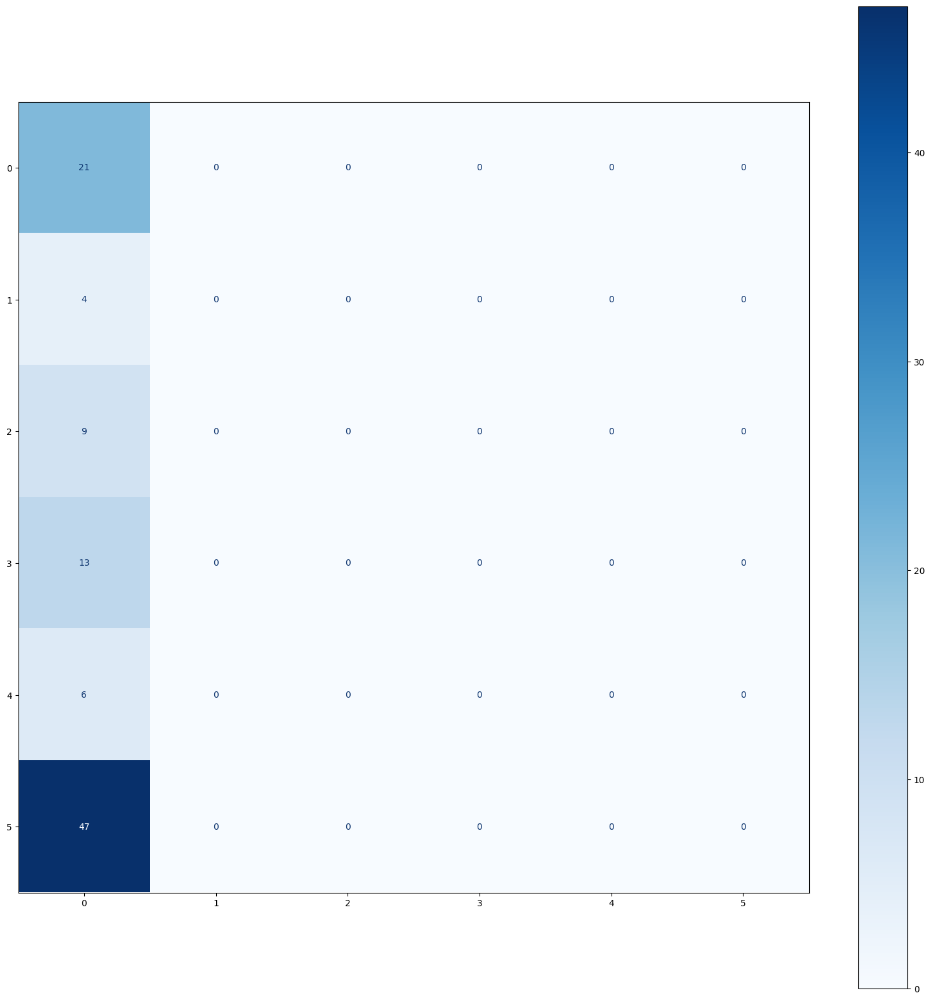

time: 1.25 s (started: 2024-03-04 09:43:32 +00:00)


In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


print(ground_truth.shape)
print(predictions.shape)

# Convert one-hot encoded vectors to class labels
y_true_labels = [np.argmax(item) for item in ground_truth]
y_pred_labels = [np.argmax(item) for item in predictions]

# Assuming you have already calculated the confusion matrix
# conf_matrix = confusion_matrix(true_labels, predicted_labels)
conf_matrix = confusion_matrix(y_true_labels, y_pred_labels)
print(conf_matrix.shape)

# print(conf_matrix.shape)

# Plot confusion matrix using ConfusionMatrixDisplay
class_names = [str(i) for i in range(num_classes)]
print(class_names)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)

# Display the plot
fig, ax = plt.subplots(figsize=(20, 20)) #plt.subplots(figsize=(10,10))
disp.plot(ax=ax, cmap=plt.cm.Blues, values_format="d")
fig.tight_layout(rect=[0, 0, 1, 1])
plt.show()

### Demo

## 4) Reflecting on the Paper Reading Workshop [10%]

The paper reading workshop taught me new skills that help me immensely when finding a relevant topic or new topics in academic papers. Initially, I learned to strategically pinpoint my topic through preliminary research, ensuring a clear path to finding the relevant topic I want by identifying specific keywords. I then read the abstracts of the papers to ensure that the papers I found are discussing my related topic, all of which assists in narrowing down the reading to the relevant topic. After that, I read the conclusions of the papers as a sort of "last line of defence" to confirm if the paper is actually discussing my topic, as the conclusion is the final part of a text or presentation that summarises key points, provides closure, and often offers insights or implications.

These skills I had already learned about before and have used them to identify relevant papers. However, the part that was a major issue for me when reading academic papers is when I lose track in the paper, making me wander off-topic, losing time and focus on my original goal. So, the next skill is to first identify what I am trying to look for. For example, am I trying to understand the implementation methodology of the paper, or am I trying to grasp the essential concepts of my research topic? This step sharpens the focus of my literature review. Simultaneously, I've recognised the significance of utilising references as valuable tools for deeper exploration. By delving into the cited works, I can augment my understanding and address specific research objectives more comprehensively. In essence, this refined process has not only streamlined my literature review but has also equipped me with essential skills to navigate the academic landscape more effectively.

The main two topics covered in the paper reading workshop were the CycleGAN model and the Dropout layer. CycleGAN is a type of generative adversarial network (GAN) used in computer vision, particularly for image-to-image translation tasks. It employs two networks, a generator and a discriminator, which work in tandem to convert images from one domain to another. Notably, CycleGAN introduces a cycle-consistency loss, ensuring that the translated image can be accurately reversed to the original, maintaining consistency. On the other hand, a Dropout layer is a neural network regularisation technique where randomly selected neurons are omitted during training, preventing co-dependency among neurons and reducing overfitting. Dropout enhances the network's robustness and generalisation ability by promoting the learning of more independent and diverse features.
